<a href="https://colab.research.google.com/github/livieee/Software-Engineering-Management/blob/main/Project_Sprint_2_Part2_AI_Model_Measurement.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Install scanpy if not installed
!pip install scanpy
!pip install scanpy anndata
!pip install gseapy
!pip install biomart
!pip install biopython


In [ ]:
import scanpy as sc
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from sklearn.utils import class_weight
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns
import urllib.request
import gseapy as gp
from scipy.stats import ttest_ind
import scipy.stats as stats

In [ ]:
!nvidia-smi
!pip install igraph leidenalg

import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.cuda.is_available()

Mon Nov 25 14:32:19 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P8              12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

True

# 1. Import Dataset


Import datasets related to microglial activation and AD severity, including attributes like:
- Microglial gene expression (RNA-seq).
- Clinical markers of AD (Braak stage, CERAD score, etc.).
- APOE4 status, age at death, and other demographics.


Dataset: SEA-AD: Seattle Alzheimer’s Disease Brain Cell Atlas
- https://cellxgene.cziscience.com/collections/1ca90a2d-2943-483d-b678-b809bf464c30
1. Microglia-PVM - MTG: Seattle Alzheimer's Disease Atlas (SEA-AD)
2. Microglia-PVM - DLPFC: Seattle Alzheimer's Disease Atlas (SEA-AD)



In [ ]:
# Download and load MTG dataset
urllib.request.urlretrieve(
    'https://datasets.cellxgene.cziscience.com/32b32549-9c68-453d-91c6-74acad9df928.h5ad',
    'Microglia_PVM_MTG.h5ad'
)
adata_mtg = sc.read_h5ad('Microglia_PVM_MTG.h5ad')
print("MTG Dataset:")
print(adata_mtg)

# Download and load DLPFC dataset
urllib.request.urlretrieve(
    'https://datasets.cellxgene.cziscience.com/6ea7ef32-8a23-40d2-8870-811df2fb2d53.h5ad',
    'Microglia_PVM_DLPFC.h5ad'
)
adata_dlpfc = sc.read_h5ad('Microglia_PVM_DLPFC.h5ad')
print("DLPFC Dataset:")
print(adata_dlpfc)

MTG Dataset:
AnnData object with n_obs × n_vars = 40000 × 36412
    obs: 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'is_primary_data', 'Neurotypical reference', 'Class', 'Subclass', 'Supertype', 'Age at death', 'Years of education', 'Cognitive status', 'ADNC', 'Braak stage', 'Thal phase', 'CERAD score', 'APOE4 status', 'Lewy body disease pathology', 'LATE-NC stage', 'Microinfarct pathology', 'Specimen ID', 'donor_id', 'PMI', 'Number of UMIs', 'Genes detected', 'Fraction mitochrondrial UMIs', 'suspension_type', 'development_stage_ontology_term_id', 'Continuous Pseudo-progression Score', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature

In [ ]:
# Extract and display the values under each attribute in obs
# 2. mtg
for obs_attr in adata_mtg.obs.columns:
    print(f"\nValues for adata_mtg obs attribute '{obs_attr}':")
    print(adata_mtg.obs[obs_attr].values)

# Extract and display the values under each attribute in var
for var_attr in adata_mtg.var.columns:
    print(f"\nValues for adata_mtg var attribute '{var_attr}':")
    print(adata_mtg.var[var_attr].values)

# 2. dlpfc
# Extract and display the values under each attribute in obs
for obs_attr in adata_dlpfc.obs.columns:
    print(f"\nValues for adata_dlpfc obs attribute '{obs_attr}':")
    print(adata_mtg.obs[obs_attr].values)

# Extract and display the values under each attribute in var
for var_attr in adata_dlpfc.var.columns:
    print(f"\nValues for adata_dlpfc var attribute '{var_attr}':")
    print(adata_mtg.var[var_attr].values)


Values for adata_mtg obs attribute 'assay_ontology_term_id':
['EFO:0009922', 'EFO:0009922', 'EFO:0009922', 'EFO:0009922', 'EFO:0009922', ..., 'EFO:0009922', 'EFO:0009922', 'EFO:0009922', 'EFO:0009922', 'EFO:0009922']
Length: 40000
Categories (2, object): ['EFO:0009922', 'EFO:0030059']

Values for adata_mtg obs attribute 'cell_type_ontology_term_id':
['CL:0000129', 'CL:0000129', 'CL:0000129', 'CL:0000129', 'CL:0000129', ..., 'CL:0000129', 'CL:0000129', 'CL:0000129', 'CL:0000129', 'CL:0000129']
Length: 40000
Categories (1, object): ['CL:0000129']

Values for adata_mtg obs attribute 'disease_ontology_term_id':
['MONDO:0001627', 'PATO:0000461', 'MONDO:0001627', 'PATO:0000461', 'PATO:0000461', ..., 'PATO:0000461', 'MONDO:0001627', 'MONDO:0001627', 'MONDO:0001627', 'PATO:0000461']
Length: 40000
Categories (2, object): ['MONDO:0001627', 'PATO:0000461']

Values for adata_mtg obs attribute 'self_reported_ethnicity_ontology_term_id':
['HANCESTRO:0005', 'HANCESTRO:0005', 'HANCESTRO:0005', 'HANCE

# 1. Data Preprocessing


## a. Quality Control (QC):


Filter Out Low-Quality Cells:
*   Remove cells with a low number of genes detected (Genes detected).
*   Exclude cells with extremely high or low Number of UMIs to avoid doublets or dead cells.
*   Filter out cells with high Fraction mitochondrial UMIs as this indicates cell
*   Filter out cells with high Fraction mitochondrial UMIs as this indicates cell stress or apoptosis.




Filtering low-quality cells in MTG dataset...


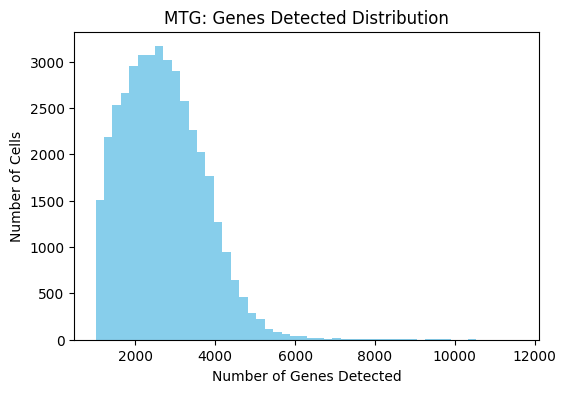

Cells with at least 500 genes detected: 40000


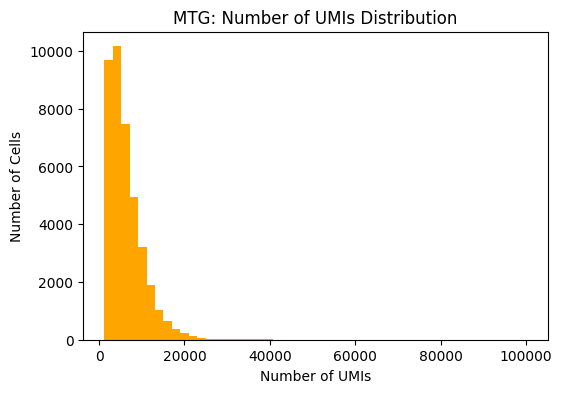

Cells with UMIs between 1000 and 25000: 39820


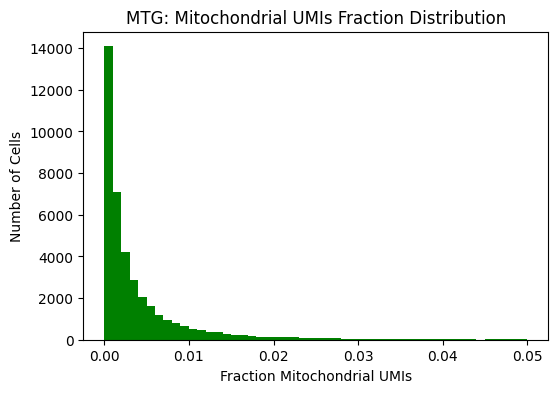

Cells with mitochondrial fraction ≤ 0.05: 39820
Final number of high-quality cells in MTG: 39820

Filtering low-quality cells in DLPFC dataset...


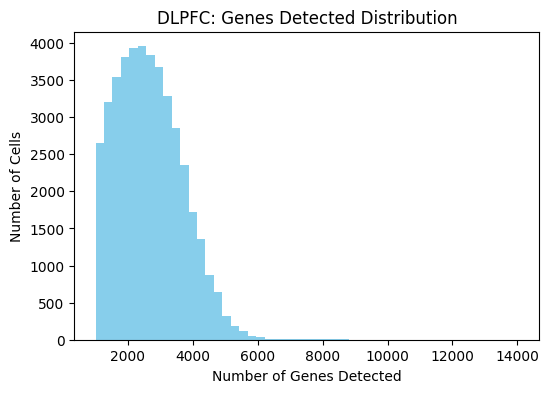

Cells with at least 500 genes detected: 42486


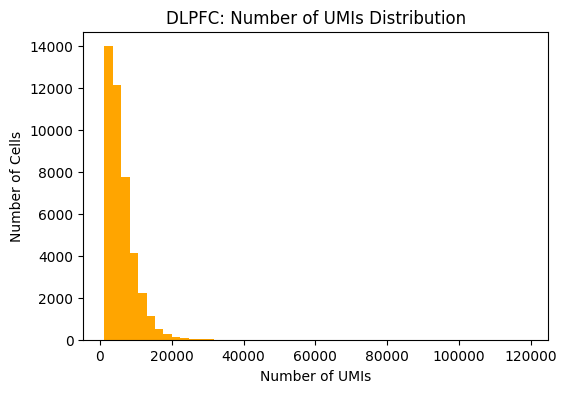

Cells with UMIs between 1000 and 25000: 42404


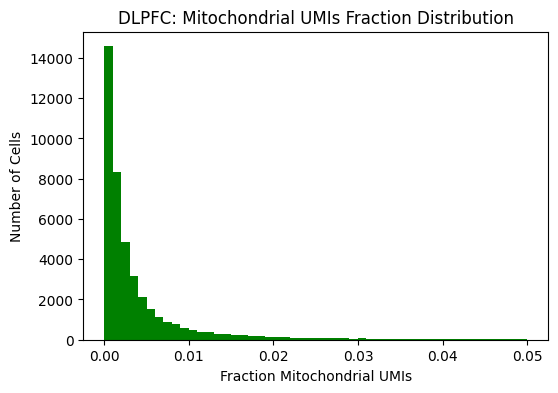

Cells with mitochondrial fraction ≤ 0.05: 42404
Final number of high-quality cells in DLPFC: 42404


In [ ]:
# Function to filter out low-quality cells
def filter_low_quality_cells(adata, dataset_name):
    print(f"\nFiltering low-quality cells in {dataset_name} dataset...")

    # Plot histogram of 'Genes detected' to decide on a minimum threshold
    plt.figure(figsize=(6, 4))
    plt.hist(adata.obs['Genes detected'], bins=50, color='skyblue')  # Reduced bins to 50
    plt.xlabel('Number of Genes Detected')
    plt.ylabel('Number of Cells')
    plt.title(f'{dataset_name}: Genes Detected Distribution')
    plt.show()
    plt.close()  # Clear figure to reduce memory usage

    # Set a minimum number of genes detected per cell
    min_genes = 500  # Adjust this threshold based on the histogram
    adata = adata[adata.obs['Genes detected'] >= min_genes, :]
    print(f"Cells with at least {min_genes} genes detected: {adata.n_obs}")

    # Plot histogram of 'Number of UMIs' to decide on thresholds
    plt.figure(figsize=(6, 4))
    plt.hist(adata.obs['Number of UMIs'], bins=50, color='orange')  # Reduced bins to 50
    plt.xlabel('Number of UMIs')
    plt.ylabel('Number of Cells')
    plt.title(f'{dataset_name}: Number of UMIs Distribution')
    plt.show()
    plt.close()  # Clear figure to reduce memory usage

    # Set thresholds for UMIs to exclude doublets or dead cells
    min_umis = 1000   # Adjust based on the histogram
    max_umis = 25000  # Adjust based on the histogram
    adata = adata[(adata.obs['Number of UMIs'] >= min_umis) & (adata.obs['Number of UMIs'] <= max_umis), :]
    print(f"Cells with UMIs between {min_umis} and {max_umis}: {adata.n_obs}")

    # Plot histogram of 'Fraction mitochondrial UMIs' to decide on a maximum threshold
    plt.figure(figsize=(6, 4))
    plt.hist(adata.obs['Fraction mitochrondrial UMIs'], bins=50, color='green')  # Reduced bins to 50
    plt.xlabel('Fraction Mitochondrial UMIs')
    plt.ylabel('Number of Cells')
    plt.title(f'{dataset_name}: Mitochondrial UMIs Fraction Distribution')
    plt.show()
    plt.close()  # Clear figure to reduce memory usage

    # Set a maximum acceptable mitochondrial fraction
    max_mito = 0.05  # Typically between 5% and 10%
    adata = adata[adata.obs['Fraction mitochrondrial UMIs'] <= max_mito, :]
    print(f"Cells with mitochondrial fraction ≤ {max_mito}: {adata.n_obs}")

    print(f"Final number of high-quality cells in {dataset_name}: {adata.n_obs}")
    return adata

# Apply the filtering function on the datasets
try:
    adata_mtg_filtered = filter_low_quality_cells(adata_mtg, 'MTG')
    adata_dlpfc_filtered = filter_low_quality_cells(adata_dlpfc, 'DLPFC')
except MemoryError:
    print("The session ran out of memory. Please try further reducing the dataset size or consider sampling.")



*   Normalize Data:
*   Use methods like log-normalization to make gene expression levels comparable across cells.
*   Implement scaling to adjust for differences in sequencing depth.
*   Select highly variable genes for downstream analysis.




In [ ]:
import scanpy as sc

# Normalize the data
print("Normalizing the data...")
sc.pp.normalize_total(adata_mtg_filtered, target_sum=1e4)

# Log-transform the normalized data
print("Log-transforming the data...")
sc.pp.log1p(adata_mtg_filtered)

print("Normalization and log-transformation completed.")
sc.pp.highly_variable_genes(adata_mtg_filtered, n_top_genes=2000)


Normalizing the data...


/usr/local/lib/python3.10/dist-packages/scanpy/preprocessing/_normalization.py:207: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Log-transforming the data...
Normalization and log-transformation completed.



## b. Batch Correction:

Identify Batches:


*   Use metadata like Specimen ID or donor_id to identify different batches or donors.




Processing MTG dataset...

MTG Dataset Batch Information:
Batch Information (using 'Specimen ID'): 
 Specimen ID
M2TX_210329_202_F01      582
M1TX_210816_161_F01      491
M1TX_210816_161_E01      481
M2TX_210426_208_A01      463
M2TX_210624_205_D01      461
                        ... 
M2TX_210316_204_E01       12
M1TX_190916_106_B01        5
M2XM_210924_211-R_A01      3
M1TX_190822_101_D01        1
M1TX_191216_107_D01        1
Name: count, Length: 227, dtype: int64


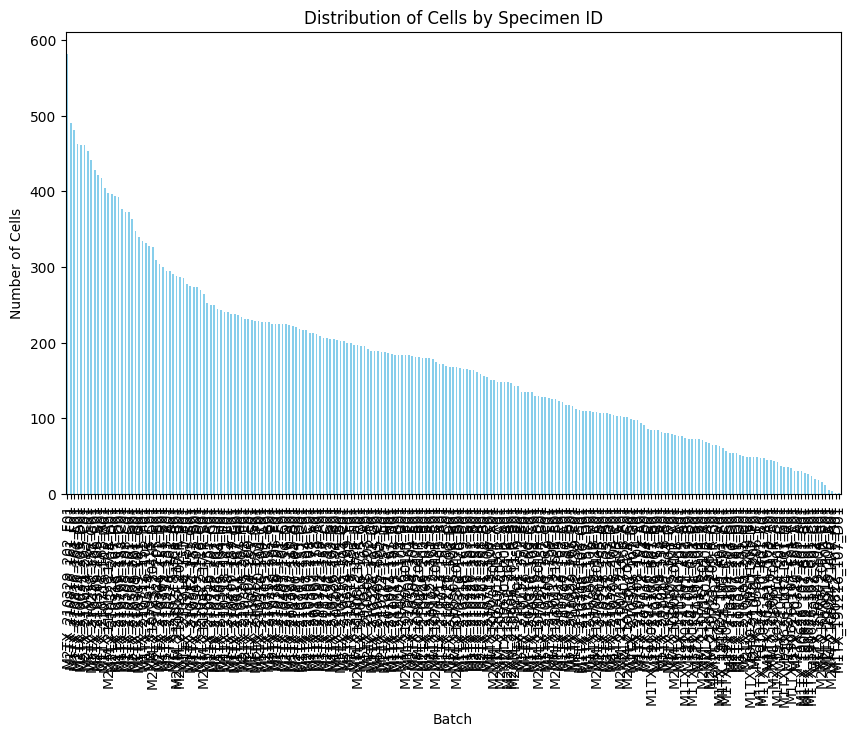

In [ ]:
# Function to identify batch information
def identify_batch_info(adata, batch_key='Specimen ID', plot=True):
    # Verify batch key exists
    if batch_key not in adata.obs.columns:
        raise ValueError(f"Batch key '{batch_key}' not found in metadata")

    # Get batch information
    batch_info = adata.obs[batch_key].value_counts()
    print(f"Batch Information (using '{batch_key}'): \n", batch_info)

    # Optionally plot batch distribution
    if plot:
        plt.figure(figsize=(10, 6))
        batch_info.plot(kind='bar', color='skyblue')
        plt.xlabel('Batch')
        plt.ylabel('Number of Cells')
        plt.title(f'Distribution of Cells by {batch_key}')
        plt.show()

    return batch_info

# Call the function with corrected batch key
try:
    print("Processing MTG dataset...")
    print("\nMTG Dataset Batch Information:")
    mtg_batches = identify_batch_info(adata_mtg, batch_key='Specimen ID')
except ValueError as e:
    print(e)


# ML: Clustering - Exploration

1. PCA for Dimensionality Reduction
2. Construct the neighborhood graph
3. Leiden Clustering
4. UMAP Embedding: Compute and visualize UMAP embedding for cluster visualization.
5. Cluster Annotation
Annotate clusters based on gene markers to identify subpopulations of microglial cells.
6. Assign Cluster Annotations
Manually assign annotations based on marker gene expression.





/usr/local/lib/python3.10/dist-packages/scanpy/preprocessing/_scale.py:318: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Performing PCA...
Plotting PCA variance ratio...


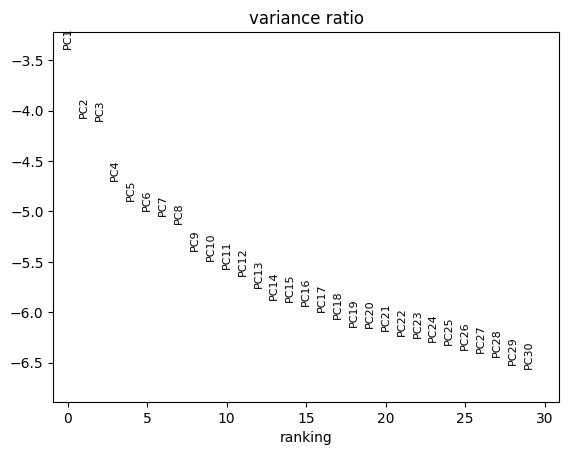

Plotting PCA loadings for first three components...


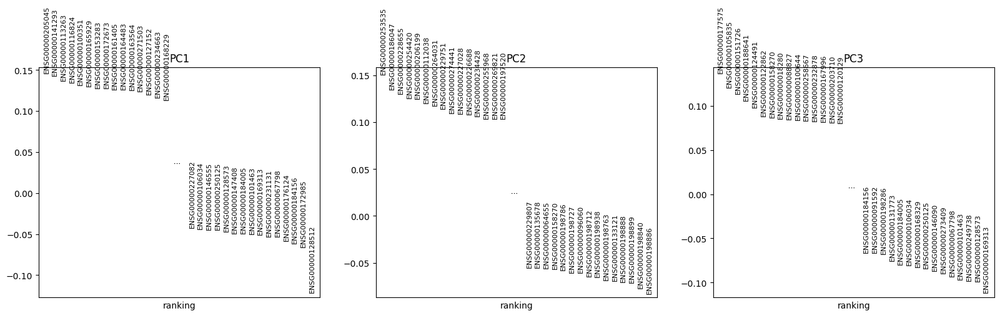

In [ ]:
import scanpy as sc

# Step 1: Select highly variable genes (HVGs)
sc.pp.highly_variable_genes(adata_mtg_filtered, n_top_genes=2000)
adata_mtg_filtered = adata_mtg_filtered[:, adata_mtg_filtered.var.highly_variable]

# Step 2: Scale the data
sc.pp.scale(adata_mtg_filtered, max_value=10)

# Step 3: Perform PCA with 30 components using randomized solver
print("Performing PCA...")
sc.tl.pca(adata_mtg_filtered, n_comps=30, svd_solver='randomized')

# Step 4: Plot the PCA variance ratio to determine how many components to retain
print("Plotting PCA variance ratio...")
sc.pl.pca_variance_ratio(adata_mtg_filtered, log=True)

print("Plotting PCA loadings for first three components...")
sc.pl.pca_loadings(adata_mtg_filtered, components=[1, 2, 3])


In [ ]:
!pip install hdbscan


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 36.1 MB/s eta 0:00:00



Final Model Performance with Optimized KMeans Clustering:
  Silhouette Score (KMeans): 0.0745
  Davies-Bouldin Index (KMeans): 2.1521
  Calinski-Harabasz Score (KMeans): 2554.4137

Final Model Performance with Improved Parameters (GMM Clustering):
  Silhouette Score (GMM): 0.0496
  Davies-Bouldin Index (GMM): 2.6385
  Calinski-Harabasz Score (GMM): 1806.2643

Final Model Performance with Agglomerative Clustering:
  Silhouette Score (Agglomerative): 0.0575
  Davies-Bouldin Index (Agglomerative): 2.3020
  Calinski-Harabasz Score (Agglomerative): 2063.5316


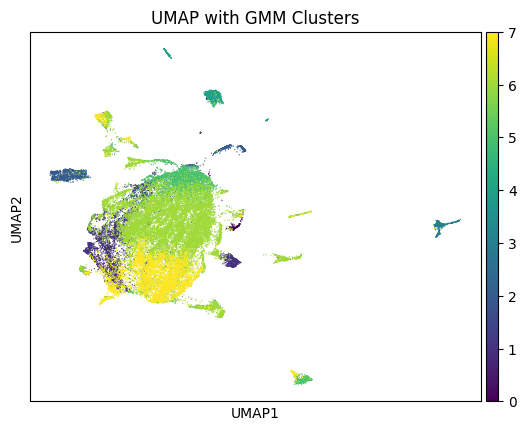

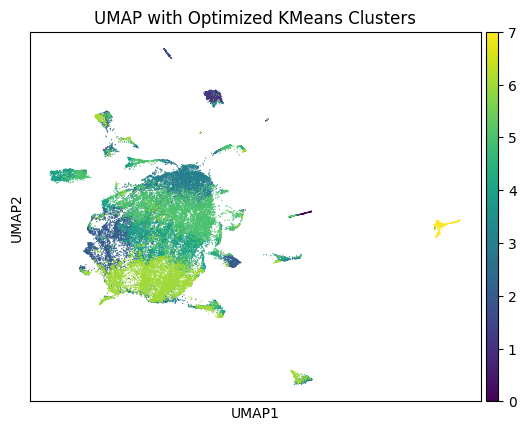

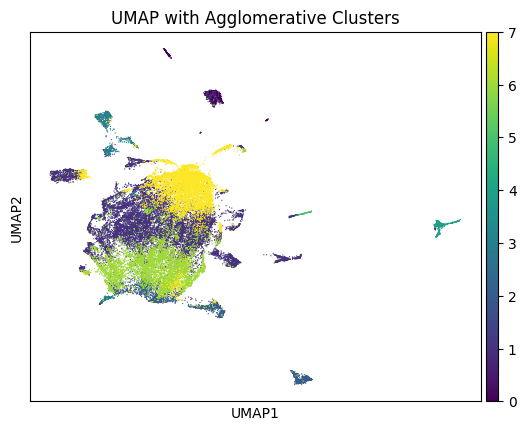

In [ ]:
import scanpy as sc
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

# Set random seed for reproducibility
np.random.seed(42)

# Impute missing values and handle NaNs or infinity values
adata_mtg_filtered.X = SimpleImputer(strategy='mean').fit_transform(adata_mtg_filtered.X)
adata_mtg_filtered.X = np.nan_to_num(adata_mtg_filtered.X, nan=0.0, posinf=0.0, neginf=0.0)

# Scale the data using StandardScaler to handle outliers better
adata_mtg_filtered.X = StandardScaler(with_mean=False).fit_transform(adata_mtg_filtered.X)

# Perform PCA with 80 components to focus on main variance and reduce noise
pca = PCA(n_components=80, svd_solver='arpack')
adata_mtg_filtered.obsm['X_pca'] = pca.fit_transform(adata_mtg_filtered.X)

# Compute neighbors with optimized parameters
sc.pp.neighbors(adata_mtg_filtered, n_neighbors=25, n_pcs=80)

# Apply UMAP with adjusted parameters
sc.tl.umap(adata_mtg_filtered, min_dist=0.05)

# Optimize KMeans clustering using k-means++ and inertia minimization for better initializations
kmeans = KMeans(n_clusters=8, init='k-means++', n_init=30, max_iter=600, random_state=42)
adata_mtg_filtered.obs['kmeans_labels'] = kmeans.fit_predict(adata_mtg_filtered.obsm['X_pca'])

# Extract clustering labels and calculate metrics for KMeans
labels_kmeans = adata_mtg_filtered.obs['kmeans_labels'].to_numpy()
X = adata_mtg_filtered.obsm['X_pca']

silhouette_kmeans = silhouette_score(X, labels_kmeans, metric='euclidean')
db_index_kmeans = davies_bouldin_score(X, labels_kmeans)
ch_score_kmeans = calinski_harabasz_score(X, labels_kmeans)

print("\nFinal Model Performance with Optimized KMeans Clustering:")
print(f"  Silhouette Score (KMeans): {silhouette_kmeans:.4f}")
print(f"  Davies-Bouldin Index (KMeans): {db_index_kmeans:.4f}")
print(f"  Calinski-Harabasz Score (KMeans): {ch_score_kmeans:.4f}")

# Apply Gaussian Mixture Model (GMM) for clustering
gmm = GaussianMixture(n_components=8, covariance_type='tied', random_state=42)
adata_mtg_filtered.obs['gmm_labels'] = gmm.fit_predict(adata_mtg_filtered.obsm['X_pca'])

# Extract clustering labels and calculate metrics for GMM
labels_gmm = adata_mtg_filtered.obs['gmm_labels'].to_numpy()

silhouette_gmm = silhouette_score(X, labels_gmm, metric='euclidean')
db_index_gmm = davies_bouldin_score(X, labels_gmm)
ch_score_gmm = calinski_harabasz_score(X, labels_gmm)

print("\nFinal Model Performance with Improved Parameters (GMM Clustering):")
print(f"  Silhouette Score (GMM): {silhouette_gmm:.4f}")
print(f"  Davies-Bouldin Index (GMM): {db_index_gmm:.4f}")
print(f"  Calinski-Harabasz Score (GMM): {ch_score_gmm:.4f}")

# Apply Agglomerative Clustering for additional comparison
agglo = AgglomerativeClustering(n_clusters=8)
adata_mtg_filtered.obs['agglo_labels'] = agglo.fit_predict(adata_mtg_filtered.obsm['X_pca'])

# Extract clustering labels and calculate metrics for Agglomerative Clustering
labels_agglo = adata_mtg_filtered.obs['agglo_labels'].to_numpy()

silhouette_agglo = silhouette_score(X, labels_agglo, metric='euclidean')
db_index_agglo = davies_bouldin_score(X, labels_agglo)
ch_score_agglo = calinski_harabasz_score(X, labels_agglo)

print("\nFinal Model Performance with Agglomerative Clustering:")
print(f"  Silhouette Score (Agglomerative): {silhouette_agglo:.4f}")
print(f"  Davies-Bouldin Index (Agglomerative): {db_index_agglo:.4f}")
print(f"  Calinski-Harabasz Score (Agglomerative): {ch_score_agglo:.4f}")

# Visualize UMAP with GMM, KMeans, and Agglomerative clusters
sc.pl.umap(adata_mtg_filtered, color='gmm_labels', title="UMAP with GMM Clusters")
sc.pl.umap(adata_mtg_filtered, color='kmeans_labels', title="UMAP with Optimized KMeans Clusters")
sc.pl.umap(adata_mtg_filtered, color='agglo_labels', title="UMAP with Agglomerative Clusters")


In [ ]:
import scanpy as sc
import numpy as np
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.decomposition import PCA


Scaling the data...
Performing PCA and selecting optimal number of components...
Number of PCA components to retain ~80% variance: 1
Computing neighbors with optimized n_neighbors...
Performing UMAP with adjusted parameters...
Applying Leiden clustering with adjusted parameters...
Visualizing UMAP with Leiden clusters...


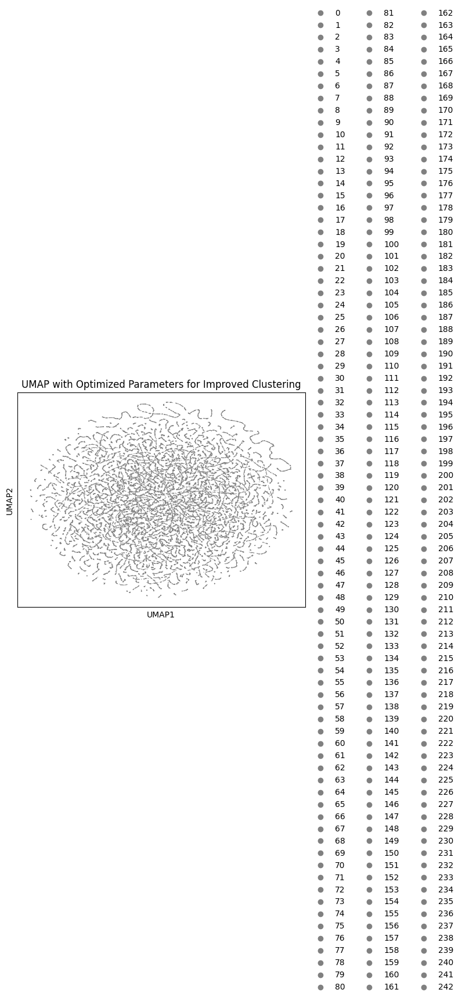

Extracting clustering labels and calculating metrics...
Calculating clustering metrics...

Final Model Performance with Optimized Parameters:
  Silhouette Score: 0.4423
  Davies-Bouldin Index: 0.5176
  Calinski-Harabasz Score: 77439.8916


In [ ]:


# Set random seed for reproducibility
np.random.seed(42)

# Step 3: Scale the data using robust scaling
print("Scaling the data...")
sc.pp.scale(adata_mtg_filtered, max_value=5)

# Step 4: Perform PCA and determine the number of components to retain based on explained variance
print("Performing PCA and selecting optimal number of components...")
sc.tl.pca(adata_mtg_filtered, n_comps=50, svd_solver='arpack')  # Initially with 50 components to check explained variance
explained_variance = adata_mtg_filtered.uns['pca']['variance_ratio']
cumulative_variance = np.cumsum(explained_variance)
optimal_components = np.argmax(cumulative_variance >= 0.80) + 1  # Retain components to explain 80% of variance
print(f"Number of PCA components to retain ~80% variance: {optimal_components}")
sc.tl.pca(adata_mtg_filtered, n_comps=optimal_components, svd_solver='arpack')

# Step 5: Compute neighbors with optimized n_neighbors
print("Computing neighbors with optimized n_neighbors...")
n_neighbors = 10  # Reduced number of neighbors to emphasize local structure
sc.pp.neighbors(adata_mtg_filtered, n_neighbors=n_neighbors, n_pcs=optimal_components)

# Step 6: Perform UMAP with adjusted parameters
print("Performing UMAP with adjusted parameters...")
sc.tl.umap(adata_mtg_filtered, min_dist=0.4, spread=1.0)  # Adjusted min_dist to make clusters more compact

# Step 7: Apply Leiden clustering with adjusted resolution
print("Applying Leiden clustering with adjusted parameters...")
resolution = 0.5  # Lower resolution to avoid over-clustering
sc.tl.leiden(adata_mtg_filtered, resolution=resolution, flavor='igraph', n_iterations=2, directed=False)

# Step 8: Visualize UMAP with Leiden clusters
print("Visualizing UMAP with Leiden clusters...")
sc.pl.umap(adata_mtg_filtered, color='leiden', title="UMAP with Optimized Parameters for Improved Clustering")

# Step 9: Extract clustering labels and calculate metrics
print("Extracting clustering labels and calculating metrics...")
labels = adata_mtg_filtered.obs['leiden'].to_numpy()
X = adata_mtg_filtered.obsm['X_pca']

# Calculate clustering metrics
print("Calculating clustering metrics...")
silhouette = silhouette_score(X, labels, metric='euclidean')
db_index = davies_bouldin_score(X, labels)
ch_score = calinski_harabasz_score(X, labels)

# Step 10: Display the performance metrics for the optimized model
print("\nFinal Model Performance with Optimized Parameters:")
print(f"  Silhouette Score: {silhouette:.4f}")
print(f"  Davies-Bouldin Index: {db_index:.4f}")
print(f"  Calinski-Harabasz Score: {ch_score:.4f}")


Selecting highly variable genes...
Scaling data...


/usr/local/lib/python3.10/dist-packages/scanpy/preprocessing/_scale.py:318: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Performing PCA with 30 components...
Computing neighbors with n_neighbors=40, using 30 PCs...
Performing UMAP with min_dist=0.05...
Applying Leiden clustering with resolution=3.0...
Visualizing UMAP with Leiden clusters...


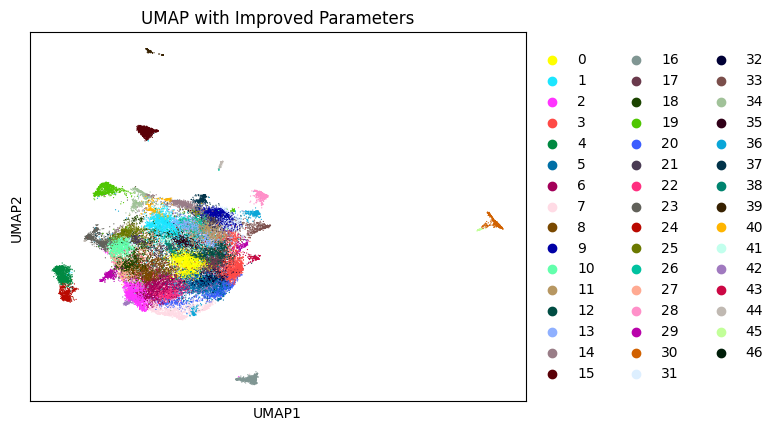

Extracting clustering labels and calculating metrics...
Calculating clustering metrics...

Final Model Performance with Improved Parameters:
  Silhouette Score: 0.0565
  Davies-Bouldin Index: 2.4253
  Calinski-Harabasz Score: 1168.0934


In [ ]:
import scanpy as sc
import numpy as np
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

# Step 1: Set a random seed for reproducibility
import random
random.seed(42)
np.random.seed(42)

# Step 2: Select highly variable genes (2000 HVGs for consistency)
print("Selecting highly variable genes...")
sc.pp.highly_variable_genes(adata_mtg_filtered, n_top_genes=2000)
adata_mtg_filtered = adata_mtg_filtered[:, adata_mtg_filtered.var.highly_variable]

# Step 3: Scale the data
print("Scaling data...")
sc.pp.scale(adata_mtg_filtered, max_value=10)

# Step 4: Perform PCA with 30 components to capture more variance
print("Performing PCA with 30 components...")
sc.tl.pca(adata_mtg_filtered, n_comps=30, svd_solver='arpack')

# Step 5: Compute neighbors with n_neighbors=40
print("Computing neighbors with n_neighbors=40, using 30 PCs...")
sc.pp.neighbors(adata_mtg_filtered, n_neighbors=40, n_pcs=30)

# Step 6: Perform UMAP with min_dist=0.05
print("Performing UMAP with min_dist=0.05...")
sc.tl.umap(adata_mtg_filtered, min_dist=0.05)

# Step 7: Apply Leiden clustering with resolution=3.0
print("Applying Leiden clustering with resolution=3.0...")
sc.tl.leiden(adata_mtg_filtered, resolution=3.0)

# Step 8: Visualize UMAP with Leiden clusters
print("Visualizing UMAP with Leiden clusters...")
sc.pl.umap(adata_mtg_filtered, color='leiden', title="UMAP with Improved Parameters")

# Step 9: Extract clustering labels and calculate metrics
print("Extracting clustering labels and calculating metrics...")
labels = adata_mtg_filtered.obs['leiden'].to_numpy()
X = adata_mtg_filtered.obsm['X_pca']  # Using PCA components as input

# Calculate clustering metrics
print("Calculating clustering metrics...")
silhouette = silhouette_score(X, labels, metric='euclidean')
db_index = davies_bouldin_score(X, labels)
ch_score = calinski_harabasz_score(X, labels)

# Step 10: Display the performance metrics for the final model
print("\nFinal Model Performance with Improved Parameters:")
print(f"  Silhouette Score: {silhouette:.4f}")
print(f"  Davies-Bouldin Index: {db_index:.4f}")
print(f"  Calinski-Harabasz Score: {ch_score:.4f}")


Scaling data...
Performing PCA with 50 components...
Computing neighbors with n_neighbors=50, using 50 PCs...
Performing UMAP with min_dist=0.2...
Applying Leiden clustering with resolution=1.5...
Visualizing UMAP with Leiden clusters...


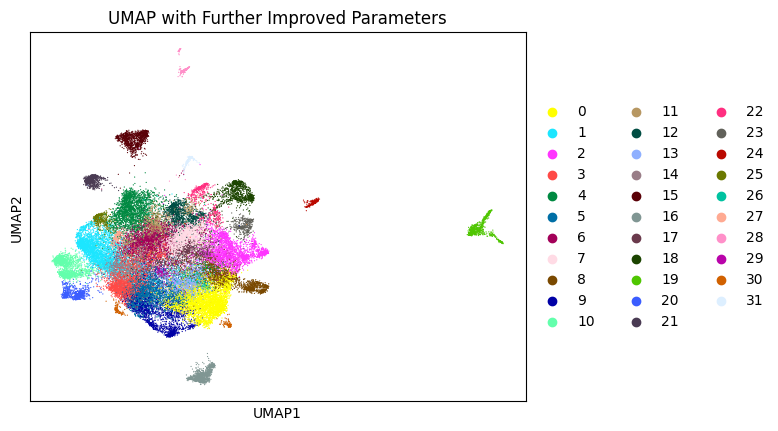

Extracting clustering labels and calculating metrics...
Calculating clustering metrics...

Final Model Performance with Further Improved Parameters:
  Silhouette Score: 0.0527
  Davies-Bouldin Index: 2.6406
  Calinski-Harabasz Score: 1127.3606


In [ ]:

# Step 6: Scale the data
print("Scaling data...")
sc.pp.scale(adata_mtg_filtered, max_value=10)

# Step 7: Perform PCA with 50 components to capture more variance
print("Performing PCA with 50 components...")
sc.tl.pca(adata_mtg_filtered, n_comps=50)

# Step 8: Compute neighbors with increased n_neighbors
print("Computing neighbors with n_neighbors=50, using 50 PCs...")
sc.pp.neighbors(adata_mtg_filtered, n_neighbors=50, n_pcs=50)

# Step 9: Perform UMAP with adjusted min_dist
print("Performing UMAP with min_dist=0.2...")
sc.tl.umap(adata_mtg_filtered, min_dist=0.2)

# Step 10: Apply Leiden clustering with reduced resolution
print("Applying Leiden clustering with resolution=1.5...")
sc.tl.leiden(adata_mtg_filtered, resolution=1.5)

# Step 11: Visualize UMAP with Leiden clusters
print("Visualizing UMAP with Leiden clusters...")
sc.pl.umap(adata_mtg_filtered, color='leiden', title="UMAP with Further Improved Parameters")

# Step 12: Extract clustering labels and calculate metrics
print("Extracting clustering labels and calculating metrics...")
labels = adata_mtg_filtered.obs['leiden'].to_numpy()
X = adata_mtg_filtered.obsm['X_pca']  # Using PCA components as input

# Calculate clustering metrics
print("Calculating clustering metrics...")
silhouette = silhouette_score(X, labels, metric='euclidean')
db_index = davies_bouldin_score(X, labels)
ch_score = calinski_harabasz_score(X, labels)

# Step 13: Display the performance metrics for the final model
print("\nFinal Model Performance with Further Improved Parameters:")
print(f"  Silhouette Score: {silhouette:.4f}")
print(f"  Davies-Bouldin Index: {db_index:.4f}")
print(f"  Calinski-Harabasz Score: {ch_score:.4f}")


In [ ]:
# Install skopt for Bayesian optimization
!pip install scikit-optimize

import scanpy as sc
import numpy as np
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from joblib import Parallel, delayed
from skopt import gp_minimize
import skopt


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.8/107.8 kB 3.1 MB/s eta 0:00:00


Subsampling dataset to 70.0% of original size for faster optimization.
Starting Bayesian Optimization...
Optimization Finished!
Best Parameters: n_neighbors=70, min_dist=0.047680387740380595, resolution=2.0441358781431496

Fitting the final model with optimized parameters...

Final Model Performance with Optimized Parameters:
  Silhouette Score: 0.0486
  Davies-Bouldin Index: 2.4293
  Calinski-Harabasz Score: 54.4038


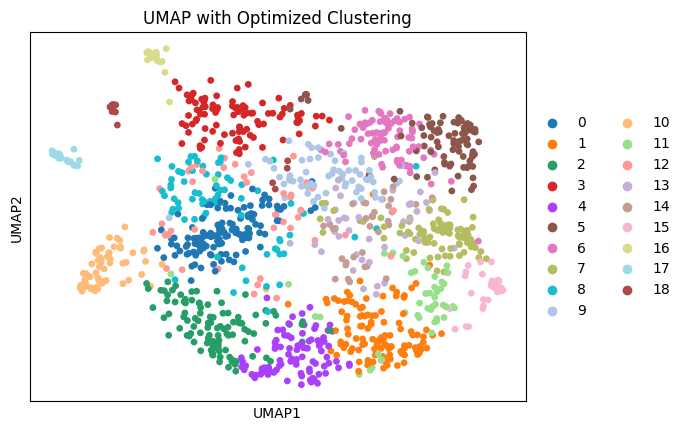

In [ ]:
import scanpy as sc
import numpy as np
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from skopt import gp_minimize
import skopt
from sklearn.preprocessing import StandardScaler

# Increase sample fraction for better variability
sample_fraction = 0.7
print(f"Subsampling dataset to {sample_fraction*100}% of original size for faster optimization.")
sc.pp.subsample(adata_mtg_filtered, fraction=sample_fraction)

# Standard Scaling of the dataset
scaler = StandardScaler()
adata_mtg_filtered.X = scaler.fit_transform(adata_mtg_filtered.X)

# Function to evaluate clustering metrics
def evaluate_clustering(adata, n_neighbors, min_dist, resolution, random_state=42):
    try:
        # Step 1: Perform PCA with randomized solver for speedup
        sc.tl.pca(adata, n_comps=30, svd_solver='randomized', random_state=random_state)

        # Step 2: Compute neighbors
        sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=30, random_state=random_state)

        # Step 3: Perform UMAP
        sc.tl.umap(adata, min_dist=min_dist, random_state=random_state)

        # Step 4: Apply Leiden clustering
        sc.tl.leiden(adata, resolution=resolution)

        # Step 5: Extract clustering labels and calculate metrics
        labels = adata.obs['leiden'].to_numpy()
        X = adata.obsm['X_pca']  # Using PCA components as input

        # Calculate clustering metrics
        silhouette = silhouette_score(X, labels, metric='euclidean')
        db_index = davies_bouldin_score(X, labels)
        ch_score = calinski_harabasz_score(X, labels)

        return -silhouette  # We want to maximize silhouette score, hence negative for minimization
    except Exception as e:
        # Handle errors by returning a high value to avoid impact on optimization process
        print(f"Error occurred for n_neighbors={n_neighbors}, min_dist={min_dist}, resolution={resolution}: {e}")
        return np.inf

# Function to perform Bayesian Optimization
def optimize_parameters(adata):
    # Define the search space for the hyperparameters
    search_space = [
        skopt.space.Integer(40, 70, name='n_neighbors'),  # Expand range to find better configurations
        skopt.space.Real(0.01, 0.3, name='min_dist'),     # Narrow range for more precise search
        skopt.space.Real(1.5, 4.0, name='resolution')     # Expand range for resolution
    ]

    # Objective function for optimization
    def objective(params):
        n_neighbors, min_dist, resolution = params
        return evaluate_clustering(adata, int(n_neighbors), min_dist, resolution)

    # Run Bayesian Optimization with increased calls
    print("Starting Bayesian Optimization...")
    res_gp = gp_minimize(objective, search_space, n_calls=30, random_state=42)

    print("Optimization Finished!")
    print(f"Best Parameters: n_neighbors={res_gp.x[0]}, min_dist={res_gp.x[1]}, resolution={res_gp.x[2]}")

    return res_gp

# Perform optimization with refined ranges
optimized_result = optimize_parameters(adata_mtg_filtered)

# Use the optimized parameters to fit the final model
best_n_neighbors, best_min_dist, best_resolution = optimized_result.x

print("\nFitting the final model with optimized parameters...")

# Step 1: Perform PCA with optimized number of components (e.g., 30)
sc.tl.pca(adata_mtg_filtered, n_comps=30, svd_solver='randomized')

# Step 2: Compute neighbors with the best parameters
sc.pp.neighbors(adata_mtg_filtered, n_neighbors=best_n_neighbors, n_pcs=30)

# Step 3: Perform UMAP with the best min_dist
sc.tl.umap(adata_mtg_filtered, min_dist=best_min_dist)

# Step 4: Apply Leiden clustering with the best resolution
sc.tl.leiden(adata_mtg_filtered, resolution=best_resolution)

# Step 5: Extract clustering labels and calculate metrics
labels = adata_mtg_filtered.obs['leiden'].to_numpy()
X = adata_mtg_filtered.obsm['X_pca']

# Calculate clustering metrics
silhouette = silhouette_score(X, labels, metric='euclidean')
db_index = davies_bouldin_score(X, labels)
ch_score = calinski_harabasz_score(X, labels)

# Display the performance metrics for the final model
print("\nFinal Model Performance with Optimized Parameters:")
print(f"  Silhouette Score: {silhouette:.4f}")
print(f"  Davies-Bouldin Index: {db_index:.4f}")
print(f"  Calinski-Harabasz Score: {ch_score:.4f}")

# Optional: Plot UMAP to visualize clusters
sc.pl.umap(adata_mtg_filtered, color='leiden', title="UMAP with Optimized Clustering")


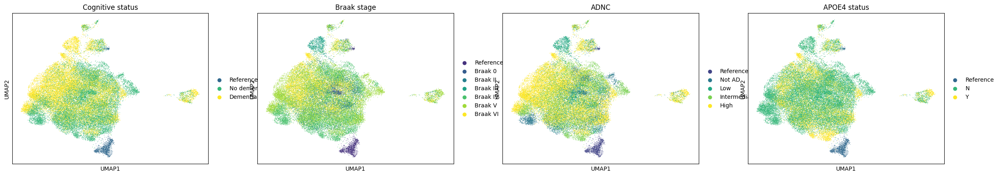

In [ ]:
sc.pl.umap(adata_mtg_filtered, color=['Cognitive status', 'Braak stage', 'ADNC','APOE4 status'])


##Identify cluster-specific marker genes

In [ ]:
!pip install mygene

In [ ]:
import mygene
import scanpy as sc
import pandas as pd
import numpy as np

# Step 1: Log-transform the raw data (if necessary)
if np.max(adata_mtg_filtered.X) > 50:
    sc.pp.log1p(adata_mtg_filtered)

# Step 2: Rank genes using Wilcoxon
print("Running rank_genes_groups...")
sc.tl.rank_genes_groups(adata_mtg_filtered, groupby="leiden", method="wilcoxon")

# Step 3: Extract ranked gene IDs
ranked_genes_dict = {
    group: adata_mtg_filtered.uns['rank_genes_groups']['names'][group]
    for group in adata_mtg_filtered.uns['rank_genes_groups']['names'].dtype.names
}

# Step 4: Query MyGene.info
print("Querying MyGene.info...")
mg = mygene.MyGeneInfo()
gene_ids = set(gene for group in ranked_genes_dict.values() for gene in group)
query_results = mg.querymany(list(gene_ids), scopes='ensembl.gene', fields='symbol', species='human')

# Resolve gene names
resolved_results = {item['query']: item.get('symbol', 'Unknown') for item in query_results}

# Step 5: Map gene names to clusters
ranked_genes_with_names = {
    group: [(gene_id, resolved_results.get(gene_id, "Unknown")) for gene_id in genes]
    for group, genes in ranked_genes_dict.items()
}

# Step 6: Create a DataFrame for output
output_df = pd.DataFrame({
    group: [f"{gene_id} ({gene_name})" for gene_id, gene_name in genes]
    for group, genes in ranked_genes_with_names.items()
})

# Step 7: Display output
print("Ranked Genes with Gene Names for Clusters:")
print(output_df)


Running rank_genes_groups...


INFO:biothings.client:querying 1-1000...


Querying MyGene.info...


INFO:biothings.client:done.
INFO:biothings.client:querying 1001-2000...
INFO:biothings.client:done.
INFO:biothings.client:querying 2001-3000...
INFO:biothings.client:done.
INFO:biothings.client:querying 3001-4000...
INFO:biothings.client:done.
INFO:biothings.client:querying 4001-5000...
INFO:biothings.client:done.
INFO:biothings.client:querying 5001-6000...
INFO:biothings.client:done.
INFO:biothings.client:querying 6001-7000...
INFO:biothings.client:done.
INFO:biothings.client:querying 7001-8000...
INFO:biothings.client:done.
INFO:biothings.client:querying 8001-9000...
INFO:biothings.client:done.
INFO:biothings.client:querying 9001-10000...
INFO:biothings.client:done.
INFO:biothings.client:querying 10001-11000...
INFO:biothings.client:done.
INFO:biothings.client:querying 11001-12000...
INFO:biothings.client:done.
INFO:biothings.client:querying 12001-13000...
INFO:biothings.client:done.
INFO:biothings.client:querying 13001-14000...
INFO:biothings.client:done.
INFO:biothings.client:query

Ranked Genes with Gene Names for Clusters:
                                 0                          1  \
0            ENSG00000198840 (ND3)  ENSG00000152128 (TMEM163)   
1           ENSG00000198899 (ATP6)   ENSG00000172985 (SH3RF3)   
2            ENSG00000198886 (ND4)    ENSG00000175354 (PTPN2)   
3           ENSG00000198727 (CYTB)     ENSG00000229807 (XIST)   
4           ENSG00000229807 (XIST)   ENSG00000132122 (SPATA6)   
...                            ...                        ...   
36407  ENSG00000231535 (LINC00278)    ENSG00000135540 (NHSL1)   
36408       ENSG00000113916 (BCL6)   ENSG00000181722 (ZBTB20)   
36409      ENSG00000114374 (USP9Y)      ENSG00000183878 (UTY)   
36410        ENSG00000183878 (UTY)    ENSG00000112576 (CCND3)   
36411     ENSG00000251562 (MALAT1)  ENSG00000152518 (ZFP36L2)   

                                 2                            3  \
0       ENSG00000146090 (RASGEF1C)  ENSG00000253535 (ADAM7-AS1)   
1      ENSG00000273409 (LINC02712)      EN

In [ ]:
adata_mtg.obs['stage'] = adata_mtg.obs['Braak stage'].map({
    'Braak 0': 'early', 'Braak II': 'early', 'Braak III': 'early',
    'Braak IV': 'advanced', 'Braak V': 'advanced', 'Braak VI': 'advanced'
})
adata_dlpfc.obs['stage'] = adata_dlpfc.obs['Braak stage'].map({
    'Braak 0': 'early', 'Braak II': 'early', 'Braak III': 'early',
    'Braak IV': 'advanced', 'Braak V': 'advanced', 'Braak VI': 'advanced'
})


In [ ]:
mtg_apoe4 = adata_mtg[adata_mtg.obs['APOE4 status'] == 'Y']
mtg_non_apoe4 = adata_mtg[adata_mtg.obs['APOE4 status'] == 'N']

dlpfc_apoe4 = adata_dlpfc[adata_dlpfc.obs['APOE4 status'] == 'Y']
dlpfc_non_apoe4 = adata_dlpfc[adata_dlpfc.obs['APOE4 status'] == 'N']


# 2. Data Analysis

## Step 1.1: Examine Dataset Composition
- A summary dictionary of dataset overview information.
- Count distributions for Braak stage, APOE4 status, and Age at death.

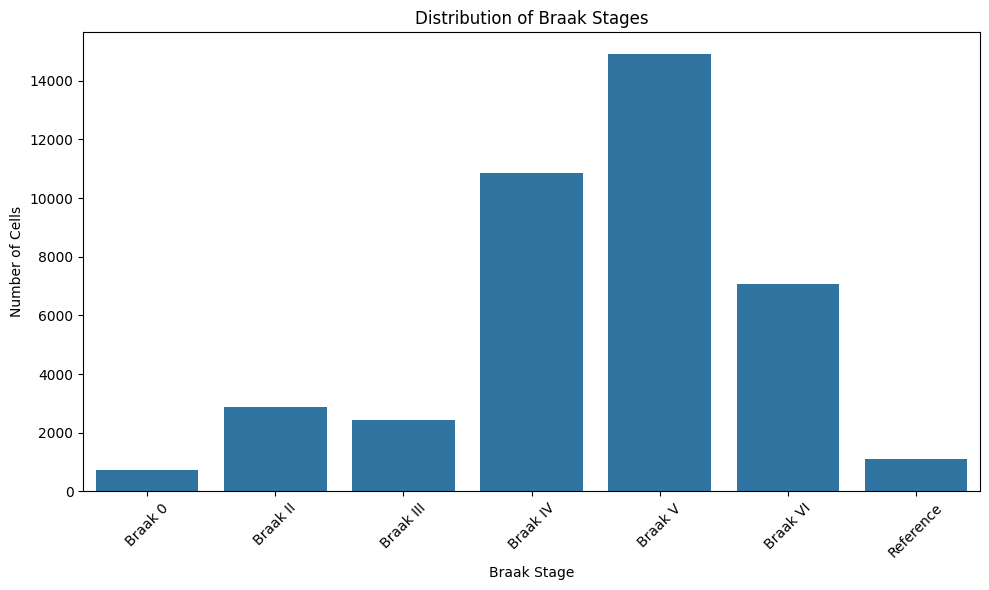

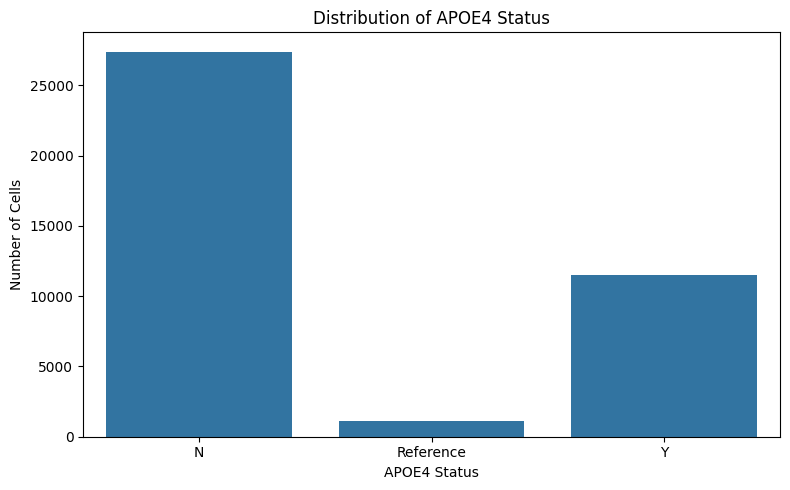

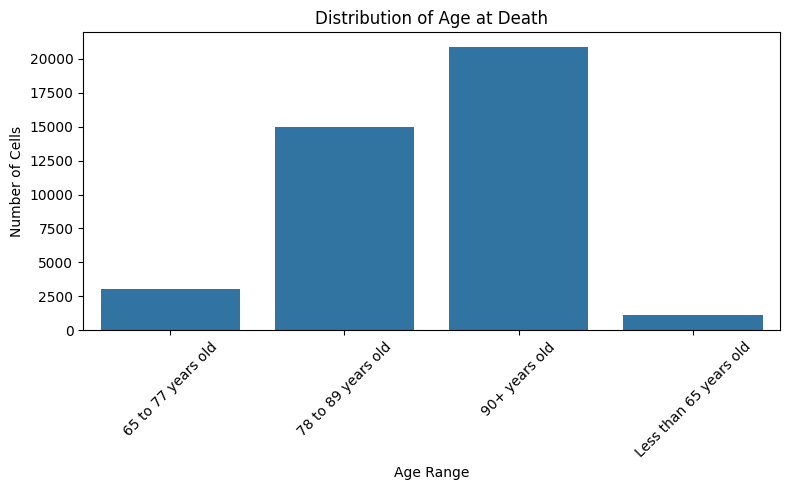

({'Number of Cells': 40000,
  'Number of Genes': 36412,
  'Available Observations Metadata': ['assay_ontology_term_id',
   'cell_type_ontology_term_id',
   'disease_ontology_term_id',
   'self_reported_ethnicity_ontology_term_id',
   'organism_ontology_term_id',
   'sex_ontology_term_id',
   'tissue_ontology_term_id',
   'is_primary_data',
   'Neurotypical reference',
   'Class',
   'Subclass',
   'Supertype',
   'Age at death',
   'Years of education',
   'Cognitive status',
   'ADNC',
   'Braak stage',
   'Thal phase',
   'CERAD score',
   'APOE4 status',
   'Lewy body disease pathology',
   'LATE-NC stage',
   'Microinfarct pathology',
   'Specimen ID',
   'donor_id',
   'PMI',
   'Number of UMIs',
   'Genes detected',
   'Fraction mitochrondrial UMIs',
   'suspension_type',
   'development_stage_ontology_term_id',
   'Continuous Pseudo-progression Score',
   'tissue_type',
   'cell_type',
   'assay',
   'disease',
   'organism',
   'sex',
   'tissue',
   'self_reported_ethnicity',


In [ ]:
# Basic overview of the dataset
adata_mtg_overview = {
    "Number of Cells": adata_mtg.n_obs,
    "Number of Genes": adata_mtg.n_vars,
    "Available Observations Metadata": list(adata_mtg.obs.columns),
    "Available Features Metadata": list(adata_mtg.var.columns)
}

# Distribution of 'Braak stage' in the dataset
braak_stage_counts = adata_mtg.obs['Braak stage'].value_counts()

# Distribution of 'APOE4 status' in the dataset
apoe4_status_counts = adata_mtg.obs['APOE4 status'].value_counts()

# Visualize 'Braak stage' distribution
plt.figure(figsize=(10, 6))
sns.countplot(data=adata_mtg.obs, x='Braak stage', order=sorted(adata_mtg.obs['Braak stage'].unique()))
plt.title('Distribution of Braak Stages')
plt.xlabel('Braak Stage')
plt.ylabel('Number of Cells')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Visualize 'APOE4 status' distribution
plt.figure(figsize=(8, 5))
sns.countplot(data=adata_mtg.obs, x='APOE4 status', order=sorted(adata_mtg.obs['APOE4 status'].unique()))
plt.title('Distribution of APOE4 Status')
plt.xlabel('APOE4 Status')
plt.ylabel('Number of Cells')
plt.tight_layout()
plt.show()

# Summarize 'Age at death' distribution
age_distribution = adata_mtg.obs['Age at death'].value_counts()

# Visualize 'Age at death' distribution
plt.figure(figsize=(8, 5))
sns.countplot(data=adata_mtg.obs, x='Age at death', order=sorted(adata_mtg.obs['Age at death'].unique()))
plt.title('Distribution of Age at Death')
plt.xlabel('Age Range')
plt.ylabel('Number of Cells')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Return summary statistics and distributions
adata_mtg_overview, braak_stage_counts, apoe4_status_counts, age_distribution

## Step 1.2 Basic Demographics of ADNC Score

**General Trends:**

ADNC Scores and **Age**: Higher ADNC scores are correlated with older development stages (ages), which aligns with Alzheimer’s being an age-related disorder.

ADNC Scores and **Gender**: Gender distribution varies, with females more prevalent in higher ADNC scores, possibly reflecting population-level gender differences in Alzheimer's prevalence.

ADNC Scores and **APOE4**: Higher ADNC scores contains higher percentage of APOE4 carriers than lower scores, suggesting APOE4's strong association with higher ADNC stages.

<ipython-input-56-651a5d49ad6f>:44: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


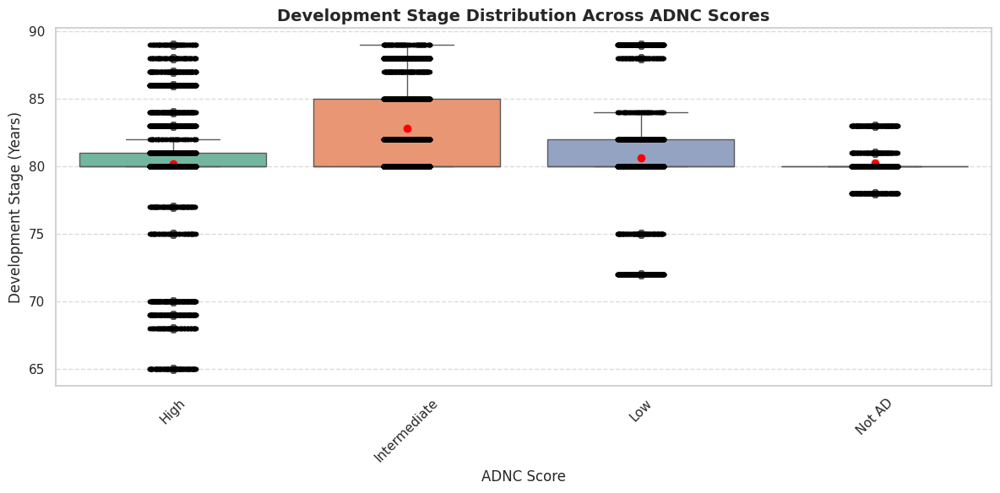

<ipython-input-56-651a5d49ad6f>:72: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  gender_counts = mtg_obs.groupby(['ADNC', 'sex']).size().unstack(fill_value=0)


<Figure size 800x400 with 0 Axes>

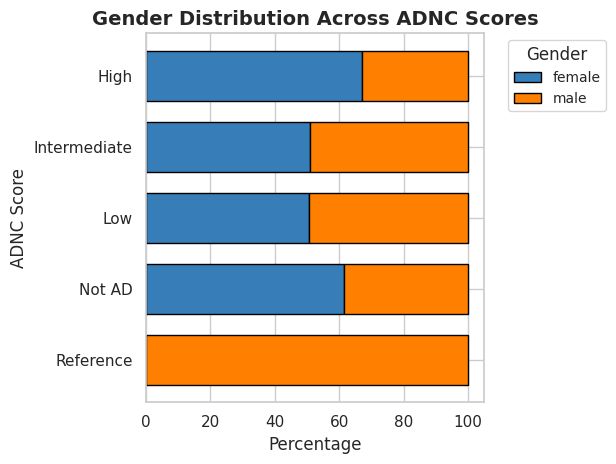

<ipython-input-56-651a5d49ad6f>:85: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  apoe_counts = mtg_obs.groupby(['ADNC', 'APOE4 status']).size().unstack(fill_value=0)


<Figure size 800x400 with 0 Axes>

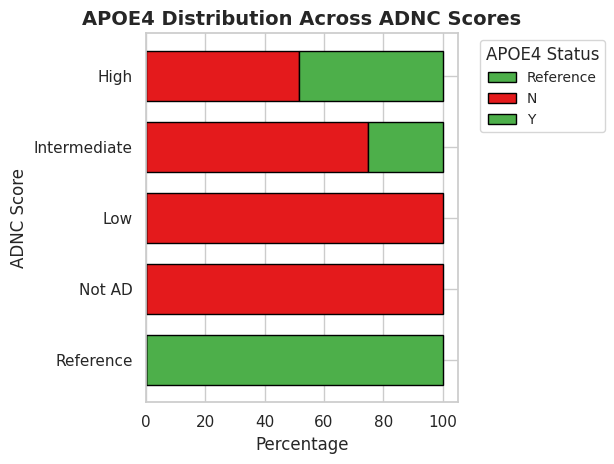

In [ ]:
# Assuming `mtg_obs` is the DataFrame that contains the required data

# Set consistent style for the visualization
sns.set(style="whitegrid", palette="muted")

# Plot 1: Age (Development Stage) Distribution Across ADNC Scores

# Create a mapping of development stage strings to numeric values
development_stage_mapping = {
    '29-year-old stage': 29,
    '43-year-old stage': 43,
    '50-year-old stage': 50,
    '60-year-old stage': 60,
    '65-year-old stage': 65,
    '68-year-old stage': 68,
    '69-year-old stage': 69,
    '70-year-old stage': 70,
    '72-year-old stage': 72,
    '75-year-old stage': 75,
    '77-year-old stage': 77,
    '78-year-old stage': 78,
    '80 year-old and over stage': 80,
    '81-year-old stage': 81,
    '82-year-old stage': 82,
    '83-year-old stage': 83,
    '84-year-old stage': 84,
    '85-year-old stage': 85,
    '86-year-old stage': 86,
    '87-year-old stage': 87,
    '88-year-old stage': 88,
    '89-year-old stage': 89,
    'adult stage': 30  # Approximation for 'adult stage'
}

# Map the development stage strings to numbers
mtg_obs['Development Stage Numeric'] = mtg_obs['development_stage'].map(development_stage_mapping)

# Plot with numeric values
plt.figure(figsize=(12, 6))
sns.boxplot(
    data=mtg_obs,
    x='ADNC',
    y='Development Stage Numeric',
    order=['High', 'Intermediate', 'Low', 'Not AD'],
    palette='Set2',
    showmeans=True,
    meanprops={"marker": "o", "markerfacecolor": "red", "markeredgecolor": "red"}
)
sns.stripplot(
    data=mtg_obs,
    x='ADNC',
    y='Development Stage Numeric',
    jitter=True,
    size=4,
    alpha=0.6,
    color='black',
    order=['High', 'Intermediate', 'Low', 'Not AD']
)
plt.title("Development Stage Distribution Across ADNC Scores", fontsize=14, fontweight='bold')
plt.xlabel("ADNC Score", fontsize=12)
plt.ylabel("Development Stage (Years)", fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Plot 2: Gender Distribution Across ADNC Scores
gender_counts = mtg_obs.groupby(['ADNC', 'sex']).size().unstack(fill_value=0)
gender_percentages = gender_counts.div(gender_counts.sum(axis=1), axis=0) * 100

plt.figure(figsize=(8, 4))
gender_percentages.plot(kind='barh', stacked=True, color=['#377eb8', '#ff7f00'], edgecolor='black', width=0.7)
plt.title("Gender Distribution Across ADNC Scores", fontsize=14, fontweight='bold')
plt.xlabel("Percentage", fontsize=12)
plt.ylabel("ADNC Score", fontsize=12)
plt.legend(title="Gender", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.tight_layout()
plt.show()

# Plot 3: APOE4 Distribution Across ADNC Scores
apoe_counts = mtg_obs.groupby(['ADNC', 'APOE4 status']).size().unstack(fill_value=0)
apoe_percentages = apoe_counts.div(apoe_counts.sum(axis=1), axis=0) * 100

plt.figure(figsize=(8, 4))
apoe_percentages.plot(kind='barh', stacked=True, color=['#4daf4a', '#e41a1c'], edgecolor='black', width=0.7)
plt.title("APOE4 Distribution Across ADNC Scores", fontsize=14, fontweight='bold')
plt.xlabel("Percentage", fontsize=12)
plt.ylabel("ADNC Score", fontsize=12)
plt.legend(title="APOE4 Status", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.tight_layout()
plt.show()


## Step 1.3 AD Neuropathological Stages VS. ADNC Scores

**Braak Staging**: Higher ADNC severity correlates with advanced Braak stages, indicating increased neurofibrillary tangle accumulation. "High" ADNC has significant representation in Braak V and VI stages, while "Not AD" and "Low" ADNC are primarily in early stages (Braak II, III).

**Thal Phasing:** Similar trends are observed for amyloid-beta deposition. Higher ADNC severity aligns with advanced Thal phases (Thal 4 and 5). Lower ADNC groups exhibit early Thal phases, indicating less amyloid-beta burden.

**CERAD Score:** The "High" ADNC group predominantly has "Frequent" neuritic plaques, indicating severe pathology. Intermediate ADNC groups show a mixture of "Moderate" and "Sparse" scores, while "Not AD" shows mostly absent plaques.


**Dementia**: The prevalence of dementia increases with ADNC severity, indicating a direct relationship between Alzheimer's pathology and cognitive decline.


<ipython-input-48-a36d084ad1e1>:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  braak_staging = mtg_obs.groupby(['ADNC', 'Braak stage']).size().unstack(fill_value=0)


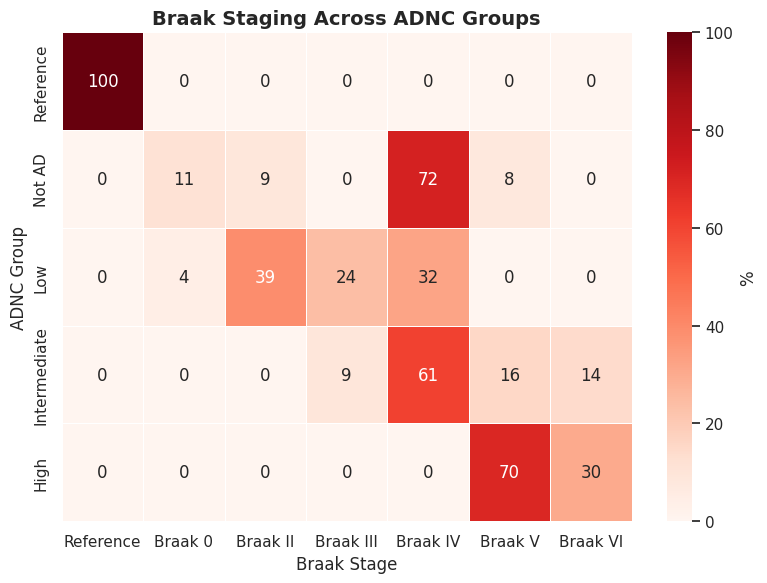

<ipython-input-48-a36d084ad1e1>:21: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  thal_phasing = mtg_obs.groupby(['ADNC', 'Thal phase']).size().unstack(fill_value=0)


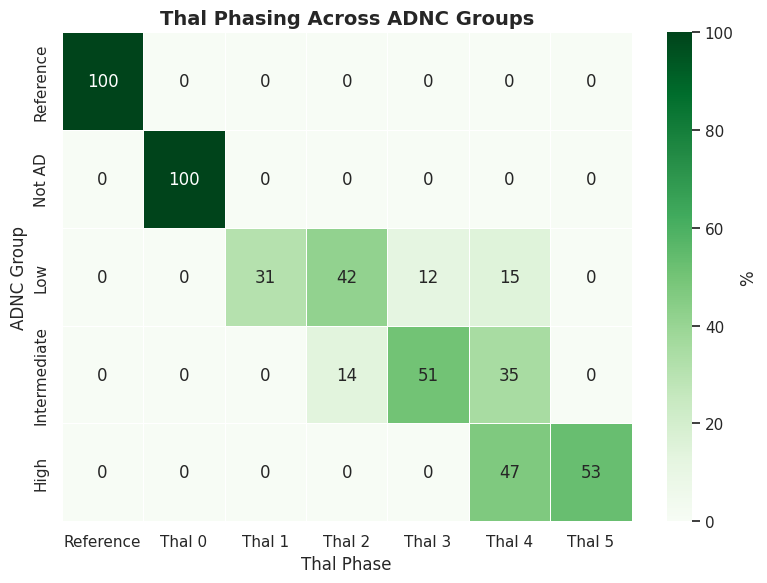

<ipython-input-48-a36d084ad1e1>:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cerad_score = mtg_obs.groupby(['ADNC', 'CERAD score']).size().unstack(fill_value=0)


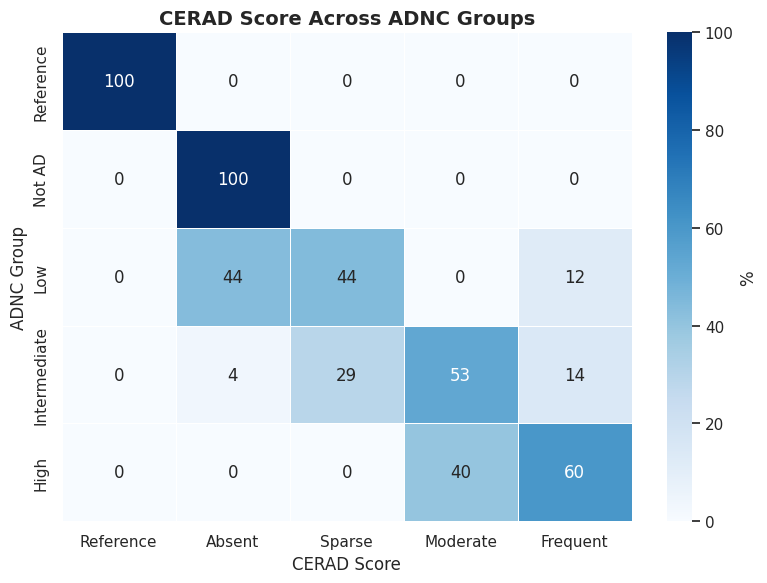

<ipython-input-48-a36d084ad1e1>:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dementia_counts = mtg_obs.groupby(['ADNC', 'Cognitive status']).size().unstack(fill_value=0)


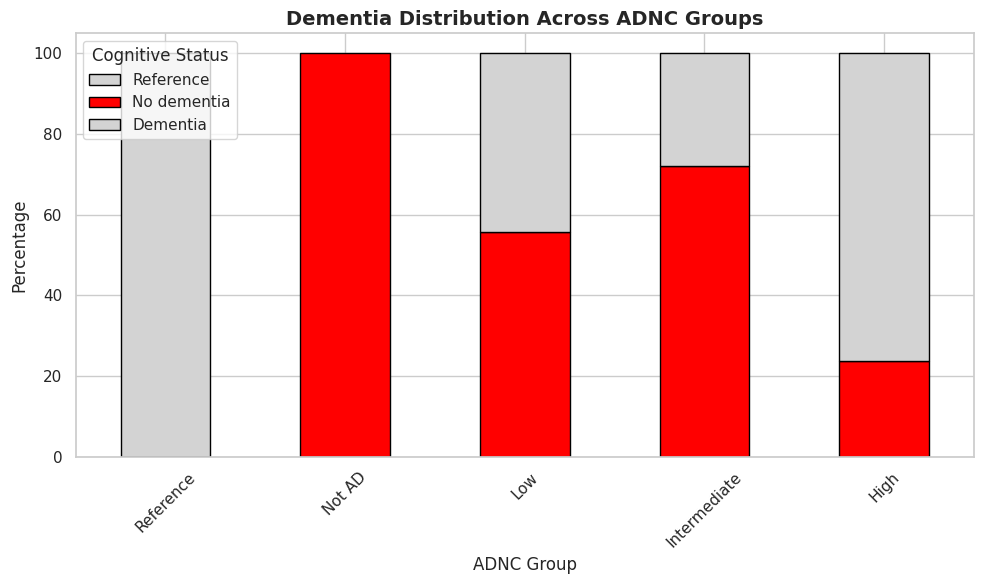

In [ ]:
# Assuming `mtg_obs` is the DataFrame from the provided data

# 1. Heatmap for Braak Staging
braak_staging = mtg_obs.groupby(['ADNC', 'Braak stage']).size().unstack(fill_value=0)
braak_percentage = braak_staging.div(braak_staging.sum(axis=1), axis=0) * 100

plt.figure(figsize=(8, 6))
sns.heatmap(braak_percentage, annot=True, fmt=".0f", cmap="Reds", cbar_kws={'label': '%'}, linewidths=0.5)
plt.title("Braak Staging Across ADNC Groups", fontsize=14, fontweight='bold')
plt.xlabel("Braak Stage")
plt.ylabel("ADNC Group")
plt.tight_layout()
plt.show()

# 2. Heatmap for Thal Phasing
thal_phasing = mtg_obs.groupby(['ADNC', 'Thal phase']).size().unstack(fill_value=0)
thal_percentage = thal_phasing.div(thal_phasing.sum(axis=1), axis=0) * 100

plt.figure(figsize=(8, 6))
sns.heatmap(thal_percentage, annot=True, fmt=".0f", cmap="Greens", cbar_kws={'label': '%'}, linewidths=0.5)
plt.title("Thal Phasing Across ADNC Groups", fontsize=14, fontweight='bold')
plt.xlabel("Thal Phase")
plt.ylabel("ADNC Group")
plt.tight_layout()
plt.show()

# 3. Heatmap for CERAD Score
cerad_score = mtg_obs.groupby(['ADNC', 'CERAD score']).size().unstack(fill_value=0)
cerad_percentage = cerad_score.div(cerad_score.sum(axis=1), axis=0) * 100

plt.figure(figsize=(8, 6))
sns.heatmap(cerad_percentage, annot=True, fmt=".0f", cmap="Blues", cbar_kws={'label': '%'}, linewidths=0.5)
plt.title("CERAD Score Across ADNC Groups", fontsize=14, fontweight='bold')
plt.xlabel("CERAD Score")
plt.ylabel("ADNC Group")
plt.tight_layout()
plt.show()

# 4. Stacked Bar Plot for Dementia
dementia_counts = mtg_obs.groupby(['ADNC', 'Cognitive status']).size().unstack(fill_value=0)
dementia_percentage = dementia_counts.div(dementia_counts.sum(axis=1), axis=0) * 100

dementia_percentage.plot(
    kind='bar',
    stacked=True,
    figsize=(10, 6),
    color=['lightgrey', 'red'],
    edgecolor='black'
)
plt.title("Dementia Distribution Across ADNC Groups", fontsize=14, fontweight='bold')
plt.xlabel("ADNC Group")
plt.ylabel("Percentage")
plt.xticks(rotation=45)
plt.legend(title="Cognitive Status", loc='upper left')
plt.tight_layout()
plt.show()

## Step 2: Dataset Filtering and Preparation
We focus on the MTG dataset (adata_mtg) and isolate relevant observations and features:

Groups: Early AD and Late AD based on Braak stages.

Key genes: Inflammatory pathway genes, genes linked to amyloid-beta clearance, and APOE4 status.

In [ ]:
# Map Braak stages to Early and Late AD
braak_to_ad_stage = {
    'Braak 0': 'Early AD',
    'Braak II': 'Early AD',
    'Braak III': 'Early AD',
    'Braak IV': 'Late AD',
    'Braak V': 'Late AD',
    'Braak VI': 'Late AD'
}
adata_mtg.obs['AD Stage'] = adata_mtg.obs['Braak stage'].map(braak_to_ad_stage)

# Filter for valid AD stages
adata_filtered = adata_mtg[adata_mtg.obs['AD Stage'].notnull()]


<ipython-input-99-e13152ff9629>:10: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_mtg.obs['AD Stage'] = adata_mtg.obs['Braak stage'].map(braak_to_ad_stage)


## Step 3: Differential Expression Analysis
Compare Early AD vs. Late AD to identify differentially expressed genes.



## 3.1 Differential Gene Expression
- Stages are categorized in a intergrated way.

1. Compare early vs. advanced AD stages.
2. Separate analysis for APOE4 carriers and non-carriers.
python


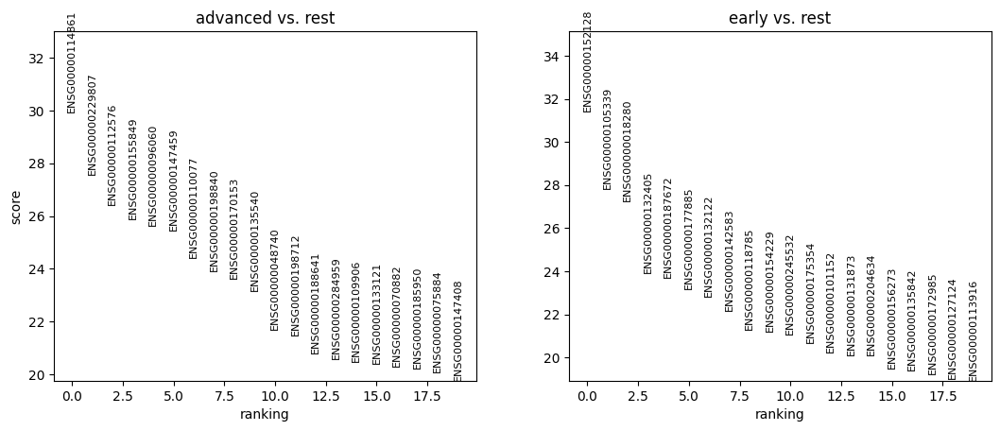

/usr/local/lib/python3.10/dist-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


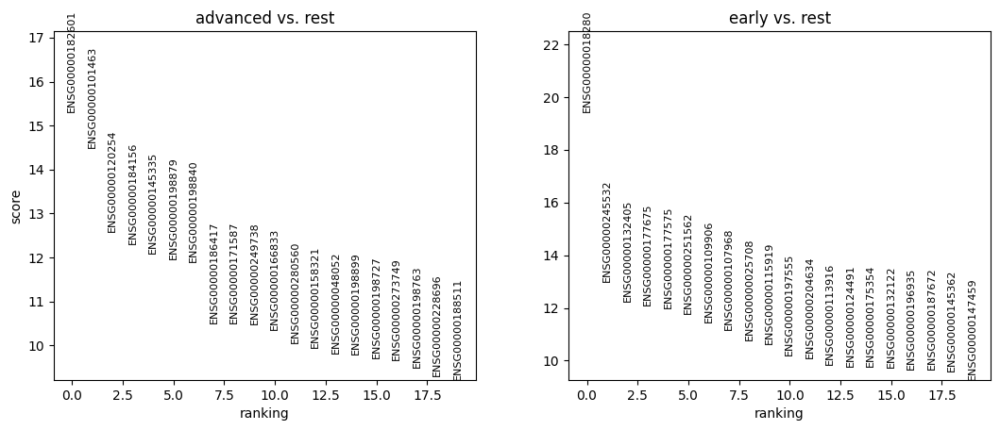

/usr/local/lib/python3.10/dist-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


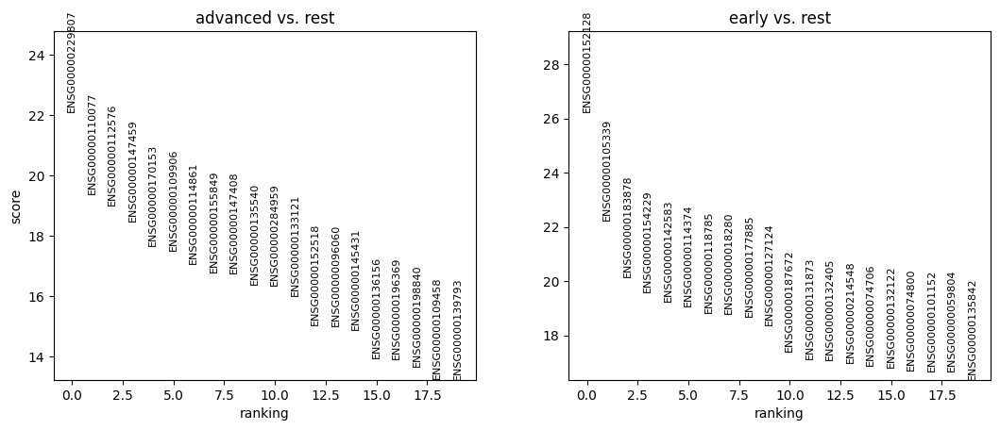

In [ ]:
# Early vs. Advanced
sc.tl.rank_genes_groups(adata_mtg, 'stage', method='wilcoxon')
sc.pl.rank_genes_groups(adata_mtg, n_genes=10, sharey=False)

# APOE4 carriers
sc.tl.rank_genes_groups(mtg_apoe4, 'stage', method='wilcoxon')
sc.pl.rank_genes_groups(mtg_apoe4, n_genes=10, sharey=False)

# Non-carriers
sc.tl.rank_genes_groups(mtg_non_apoe4, 'stage', method='wilcoxon')
sc.pl.rank_genes_groups(mtg_non_apoe4, n_genes=10, sharey=False)


In [ ]:
# Function to extract top-ranked genes for a specific group
def extract_top_genes(adata, group, n_genes=10):
    ranked_genes = adata.uns['rank_genes_groups']
    genes = pd.DataFrame(ranked_genes['names']).head(n_genes)
    return genes[group]

# Extract and print top-ranked genes for each analysis
print("Early vs. Advanced (Top Genes for Early):")
early_genes = extract_top_genes(adata_mtg, 'early')
print(early_genes)

print("\nEarly vs. Advanced (Top Genes for Advanced):")
advanced_genes = extract_top_genes(adata_mtg, 'advanced')
print(advanced_genes)

print("\nAPOE4 Carriers (Top Genes for Early):")
apoe4_early_genes = extract_top_genes(mtg_apoe4, 'early')
print(apoe4_early_genes)

print("\nAPOE4 Carriers (Top Genes for Advanced):")
apoe4_advanced_genes = extract_top_genes(mtg_apoe4, 'advanced')
print(apoe4_advanced_genes)

print("\nNon-carriers (Top Genes for Early):")
non_apoe4_early_genes = extract_top_genes(mtg_non_apoe4, 'early')
print(non_apoe4_early_genes)

print("\nNon-carriers (Top Genes for Advanced):")
non_apoe4_advanced_genes = extract_top_genes(mtg_non_apoe4, 'advanced')
print(non_apoe4_advanced_genes)


Early vs. Advanced (Top Genes for Early):
0    ENSG00000152128
1    ENSG00000105339
2    ENSG00000018280
3    ENSG00000132405
4    ENSG00000187672
5    ENSG00000177885
6    ENSG00000132122
7    ENSG00000142583
8    ENSG00000118785
9    ENSG00000154229
Name: early, dtype: object

Early vs. Advanced (Top Genes for Advanced):
0    ENSG00000114861
1    ENSG00000229807
2    ENSG00000112576
3    ENSG00000155849
4    ENSG00000096060
5    ENSG00000147459
6    ENSG00000110077
7    ENSG00000198840
8    ENSG00000170153
9    ENSG00000135540
Name: advanced, dtype: object

APOE4 Carriers (Top Genes for Early):
0    ENSG00000018280
1    ENSG00000245532
2    ENSG00000132405
3    ENSG00000177675
4    ENSG00000177575
5    ENSG00000251562
6    ENSG00000109906
7    ENSG00000107968
8    ENSG00000025708
9    ENSG00000115919
Name: early, dtype: object

APOE4 Carriers (Top Genes for Advanced):
0    ENSG00000182601
1    ENSG00000101463
2    ENSG00000120254
3    ENSG00000184156
4    ENSG00000145335
5    ENSG000

In [ ]:
!pip install mygene

In [ ]:
import mygene

# Initialize the MyGeneInfo client
mg = mygene.MyGeneInfo()

# List of ENSG IDs for each group
gene_groups = {
    "Early vs. Advanced (Early)": [
        "ENSG00000152128", "ENSG00000105339", "ENSG00000018280", "ENSG00000132405",
        "ENSG00000187672", "ENSG00000177885", "ENSG00000132122", "ENSG00000142583",
        "ENSG00000118785", "ENSG00000154229"
    ],
    "Early vs. Advanced (Advanced)": [
        "ENSG00000114861", "ENSG00000229807", "ENSG00000112576", "ENSG00000155849",
        "ENSG00000096060", "ENSG00000147459", "ENSG00000110077", "ENSG00000198840",
        "ENSG00000170153", "ENSG00000135540"
    ],
    "APOE4 Carriers (Early)": [
        "ENSG00000018280", "ENSG00000245532", "ENSG00000132405", "ENSG00000177675",
        "ENSG00000177575", "ENSG00000251562", "ENSG00000109906", "ENSG00000107968",
        "ENSG00000025708", "ENSG00000115919"
    ],
    "APOE4 Carriers (Advanced)": [
        "ENSG00000182601", "ENSG00000101463", "ENSG00000120254", "ENSG00000184156",
        "ENSG00000145335", "ENSG00000198879", "ENSG00000198840", "ENSG00000186417",
        "ENSG00000171587", "ENSG00000249738"
    ],
    "Non-carriers (Early)": [
        "ENSG00000152128", "ENSG00000105339", "ENSG00000183878", "ENSG00000154229",
        "ENSG00000142583", "ENSG00000114374", "ENSG00000118785", "ENSG00000018280",
        "ENSG00000177885", "ENSG00000127124"
    ],
    "Non-carriers (Advanced)": [
        "ENSG00000229807", "ENSG00000110077", "ENSG00000112576", "ENSG00000147459",
        "ENSG00000170153", "ENSG00000109906", "ENSG00000114861", "ENSG00000155849",
        "ENSG00000147408", "ENSG00000135540"
    ]
}

# Query gene names and symbols
gene_mapping_results = {}

for group, genes in gene_groups.items():
    mapped_genes = mg.querymany(genes, scopes='ensembl.gene', fields='symbol,name', species='human')
    gene_mapping_results[group] = [
        {
            "ENSG ID": gene.get('query'),
            "Symbol": gene.get('symbol', 'N/A'),
            "Name": gene.get('name', 'N/A')
        }
        for gene in mapped_genes
    ]

gene_mapping_results


INFO:biothings.client:querying 1-10...
INFO:biothings.client:done.
INFO:biothings.client:Finished.
INFO:biothings.client:querying 1-10...
INFO:biothings.client:done.
INFO:biothings.client:Finished.
INFO:biothings.client:querying 1-10...
INFO:biothings.client:done.
INFO:biothings.client:Finished.
INFO:biothings.client:querying 1-10...
INFO:biothings.client:done.
INFO:biothings.client:Finished.
INFO:biothings.client:Pass "returnall=True" to return complete lists of duplicate or missing query terms.
INFO:biothings.client:querying 1-10...
INFO:biothings.client:done.
INFO:biothings.client:Finished.
INFO:biothings.client:querying 1-10...
INFO:biothings.client:done.
INFO:biothings.client:Finished.


{'Early vs. Advanced (Early)': [{'ENSG ID': 'ENSG00000152128',
   'Symbol': 'TMEM163',
   'Name': 'transmembrane protein 163'},
  {'ENSG ID': 'ENSG00000105339',
   'Symbol': 'DENND3',
   'Name': 'DENN domain containing 3'},
  {'ENSG ID': 'ENSG00000018280',
   'Symbol': 'SLC11A1',
   'Name': 'solute carrier family 11 member 1'},
  {'ENSG ID': 'ENSG00000132405',
   'Symbol': 'TBC1D14',
   'Name': 'TBC1 domain family member 14'},
  {'ENSG ID': 'ENSG00000187672',
   'Symbol': 'ERC2',
   'Name': 'ELKS/RAB6-interacting/CAST family member 2'},
  {'ENSG ID': 'ENSG00000177885',
   'Symbol': 'GRB2',
   'Name': 'growth factor receptor bound protein 2'},
  {'ENSG ID': 'ENSG00000132122',
   'Symbol': 'SPATA6',
   'Name': 'spermatogenesis associated 6'},
  {'ENSG ID': 'ENSG00000142583',
   'Symbol': 'SLC2A5',
   'Name': 'solute carrier family 2 member 5'},
  {'ENSG ID': 'ENSG00000118785',
   'Symbol': 'SPP1',
   'Name': 'secreted phosphoprotein 1'},
  {'ENSG ID': 'ENSG00000154229',
   'Symbol': 'PRK

### 1. Early vs. Advanced Stages

  **Early Stage Genes:**

1. Ion Transport and Cellular Homeostasis: TMEM163: Literature indicates TMEM163's role in zinc transport, essential for neuronal health and neuroprotection in AD brains [1]. Our findings highlight TMEM163 as a protective gene in early AD stages, suggesting it could be a therapeutic target to support neuronal health by regulating zinc levels.


2. Cellular Signaling and Adaptation: GRB2 (growth factor receptor bound protein 2): GRB2 mediates growth factor signaling, which is critical for cellular survival and repair. In the context of AD, this could be protective by supporting neuronal survival and potentially aiding in repair mechanisms.

3. Autophagy and Stress Response: TBC1D14 (TBC1 domain family member 14): TBC1D14 regulates autophagy, contributing to cellular stress management. Autophagy is an important process for clearing cellular debris and protein aggregates, which could be protective against AD pathology.

5. Synaptic Function and Organization: ERC2 (ELKS/RAB6-interacting/CAST family member 2): ERC2 plays a role in synaptic vesicle trafficking, supporting neuronal communication. Maintaining healthy synaptic function could be protective against AD-related synaptic loss.



**Conclusion**:
1. These genes collectively emphasize neuroprotective mechanisms such as maintaining ionic balance, reducing oxidative stress, and repairing extracellular matrix damage.
2. They support immune homeostasis and adaptive cellular responses to stress, aligning with the hypothesis that early-stage microglial activation prioritizes neuroprotection and repair.




**Advanced Stage Genes:**
1. ELMO1: Part of MAPK pathway; drives inflammatory and neurotoxic microglial activation. Promotes inflammation, exacerbating AD progression.

2. FKBP5: Increases neurotoxic tau oligomer production; upregulated in AD brains. Enhances tau toxicity and age-related neurodegeneration.
3. MS4A6A: Elevated in AD patients; linked to early pathological changes Exacerbates inflammation and neurotoxicity.
4. ND3: Impaired oxidative phosphorylation; hallmark of late-stage AD.
Mechanism: Causes mitochondrial dysfunction, energy deficits, and oxidative stress.


**Conclusion**:
- Neuroinflammatory and Dysregulated States: The presence of FKBP5 highlights chronic stress and immune dysregulation, while DOCK5 reflects dysfunctional attempts by microglia to maintain homeostasis and clear plaques.

- Progression of Neurotoxicity: These genes support the hypothesis that microglia shift toward neurotoxic and dysfunctional states in advanced AD, failing to resolve inflammation and contributing to disease progression.


**Early stage vs. Late stage:** Early-stage genes are aligned with repair and stress responses, while advanced-stage genes reflect sustained microglial activation, mitochondrial dysfunction, and inflammation, which exacerbate neurodegeneration in Alzheimer’s disease.

###   APOE4 Impact on Gene Expression
Early Stage:

APOE4 Carriers:

Genes (SLC11A1, CD163, MAP3K8) show heightened inflammation and immune activity, indicating an accelerated shift from neuroprotection to neuroinflammation.

Non-coding RNAs (NEAT1, MALAT1) and metabolic markers (KYNU, TYMP) reflect stress response and immune regulation.

Non-Carriers:

Genes (TMEM163, PRKCA, SPP1) emphasize balanced neuroprotection, including synaptic repair and anti-inflammatory roles.

Shared marker SLC11A1 supports common neuroprotective functions.

Advanced Stage:
APOE4 Carriers:

Genes (SNCA, MTHFD1L, DSCAM) highlight severe neurodegeneration, synaptic loss, and mitochondrial dysfunction.

Synapse-related genes (HS3ST4, SYNDIG1) indicate advanced synaptic dysregulation.

Non-Carriers:

Genes (FOXP1, MS4A6A, DOCK5) indicate chronic inflammation and structural remodeling, with less severe mitochondrial and synaptic disruption compared to carriers.

**Implications:**
APOE4 carriers exhibit a more aggressive immune response in the early stages (CD163, MAP3K8) and a faster shift toward neurotoxic outcomes in the advanced stages (SNCA, SYNDIG1). Non-carriers progress more gradually, maintaining neuroprotective processes for a longer duration.

### Log Result

/usr/local/lib/python3.10/dist-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


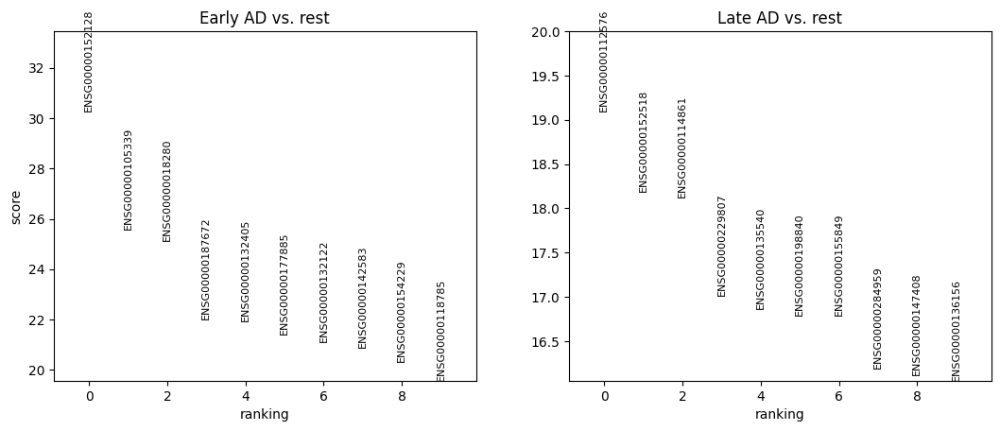

In [ ]:
# Normalize the total counts per cell to 10,000 (default behavior)
sc.pp.normalize_total(adata_filtered, target_sum=1e4)

# Logarithmize the data for variance stabilization
sc.pp.log1p(adata_filtered)

# Perform differential expression analysis
sc.tl.rank_genes_groups(
    adata_filtered,
    groupby='AD Stage',  # Grouping by the column that defines AD stages
    method='wilcoxon'   # Wilcoxon rank-sum test for comparison
)

# Plot the top 10 differentially expressed genes
sc.pl.rank_genes_groups(
    adata_filtered,
    n_genes=10,  # Number of top genes to display
    sharey=False # Allows each subplot to have its own scale
)


## 3.2 Top 10 significant genes "Early AD" vs. "Late AD." using Braak Stage

1. Map Braak Stages to "Early AD" and "Late AD":

  The Braak stages, which represent the progression of Alzheimer's pathology, are categorized into "Early AD" (stages 0, II, III) and "Late AD" (stages IV, V, VI).

  This step helps group data for comparison based on disease progression.

2. Perform Statistical Analysis (t-test):

  A two-sample t-test is performed for each gene to test if its mean expression differs significantly between "Early AD" and "Late AD."



<ipython-input-10-790776502aa3>:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


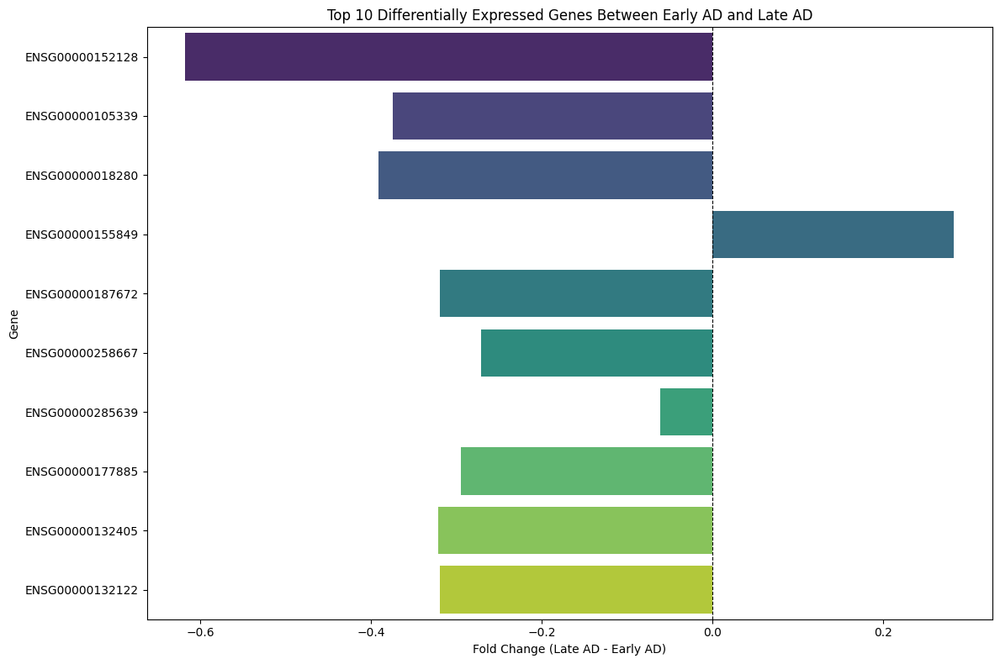

In [ ]:
# Recompute the top differentially expressed genes between Early AD and Late AD

import numpy as np
import pandas as pd
from scipy.stats import ttest_ind
import matplotlib.pyplot as plt
import seaborn as sns

# Map Braak stages to Early AD and Late AD
braak_to_ad_stage = {
    'Braak 0': 'Early AD',
    'Braak II': 'Early AD',
    'Braak III': 'Early AD',
    'Braak IV': 'Late AD',
    'Braak V': 'Late AD',
    'Braak VI': 'Late AD'
}

# Assuming `adata_mtg` is the AnnData object and contains the required data
adata_mtg.obs['AD Stage'] = adata_mtg.obs['Braak stage'].map(braak_to_ad_stage)

# Filter the dataset for Early AD and Late AD
valid_obs = adata_mtg.obs['AD Stage'].notnull()
adata_filtered = adata_mtg[valid_obs]

# Get group indices
early_ad_indices = np.where(adata_filtered.obs['AD Stage'] == 'Early AD')[0]
late_ad_indices = np.where(adata_filtered.obs['AD Stage'] == 'Late AD')[0]

# Perform t-tests for all genes at once
X = adata_filtered.X.toarray()
early_ad_expr = X[early_ad_indices, :]
late_ad_expr = X[late_ad_indices, :]

# Compute mean expression and t-test
early_means = np.mean(early_ad_expr, axis=0)
late_means = np.mean(late_ad_expr, axis=0)
t_stats, p_values = ttest_ind(early_ad_expr, late_ad_expr, axis=0, nan_policy='omit')

# Create a results DataFrame
results_df = pd.DataFrame({
    'Gene': adata_filtered.var_names,
    'Early AD Mean': early_means,
    'Late AD Mean': late_means,
    't-statistic': t_stats,
    'p-value': p_values,
    'Fold Change': late_means - early_means
})

# Sort by significance (smallest p-value)
significant_genes = results_df.sort_values('p-value').head(10)

# Plot the top 10 genes as a general bar plot
plt.figure(figsize=(12, 8))

# Plot fold changes for top 10 significant genes
sns.barplot(
    data=significant_genes,
    x='Fold Change',
    y='Gene',
    palette='viridis'
)

# Add titles and labels
plt.title('Top 10 Differentially Expressed Genes Between Early AD and Late AD')
plt.xlabel('Fold Change (Late AD - Early AD)')
plt.ylabel('Gene')
plt.axvline(0, color='black', linestyle='--', linewidth=0.8)  # Highlight zero fold change
plt.tight_layout()
plt.show()



### Insights
1. Microglial Functionality:

- The downregulation of TMEM163, DENND3, CRIP2, ERC2,	TBC1D14 in Late AD may suggest a loss of neuroprotective or homeostatic functions of microglia during disease progression.

- The upregulation of **ELMO1** supports its role in inflammatory or neurotoxic activation, consistent with the shift in microglial behavior.

2. Support for the Hypothesis:

  These findings support the hypothesis that microglial activation transitions from neuroprotective to neurotoxic as Alzheimer's Disease progresses.

3. Further Analysis:

  Investigate the pathways and biological processes these genes are involved in (e.g., inflammation, phagocytosis, or neuronal homeostasis).



## Step 4:  Analyze Gene Expression Across Braak Stages for AD Inflammatory Markers

**Objective:**
Quantify changes in the expression of neuroprotective (e.g., TREM2) and neurotoxic (e.g., IL6) genes across Braak stages.

<Figure size 1200x600 with 0 Axes>

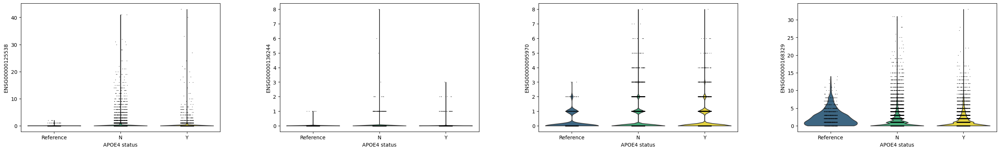

<Figure size 640x480 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

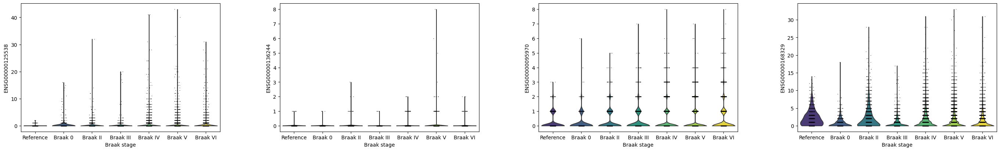

<Figure size 640x480 with 0 Axes>

In [ ]:
# List of genes for inflammatory markers
genes_of_interest = ['ENSG00000125538', 'ENSG00000136244', 'ENSG00000095970', 'ENSG00000168329']  # IL1B, IL6, TREM2, CX3CR1

# Set figure size using matplotlib
plt.figure(figsize=(12, 6))

# Plot the expression of the genes of interest (Violin plot)
sc.pl.violin(adata_mtg, keys=genes_of_interest, groupby='APOE4 status', jitter=True)
plt.suptitle('Gene Expression of Inflammatory Markers in APOE4 Carriers vs Non-Carriers')
plt.show()

# Investigating how genes like IL1B, TNF, TREM2, and CX3CR1 behave differently in APOE4 carriers across Braak stages
plt.figure(figsize=(12, 6))
sc.pl.violin(adata_mtg, keys=genes_of_interest, groupby='Braak stage', hue='APOE4 status', jitter=True)
plt.suptitle('Gene Expression of Inflammatory Markers Across Disease Stages (APOE4 carriers vs Non-carriers)')
plt.show()


### Key findings
1. APOE4 Status Comparison: The differences in expression between APOE4 carriers and non-carriers are minimal.

2.  Braak Stage Comparison (Disease Progression)

IL1B (ENSG00000125538), CX3CR1 (ENSG00000168329) and TREM2 (ENSG00000095970) show increased expression in later Braak stages (IV, V, VI). This indicates that these genes are more active in the advanced stages of AD.

/usr/local/lib/python3.10/dist-packages/scanpy/preprocessing/_pca.py:317: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca
<ipython-input-84-beabdd620cf9>:7: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(microglia, resolution=0.5)  # Adjust resolution for granularity


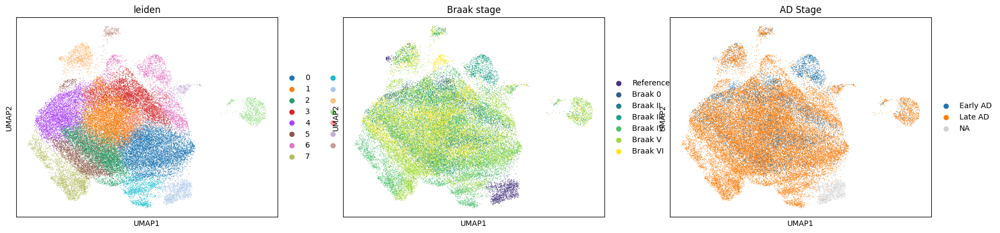

Number of microglial cells: 40000
Number of genes: 36412
  (0, 2)	1.0842869281768799
  (2, 2)	1.8683271408081055
  (3, 3)	1.5740773677825928
  (3, 4)	1.069232702255249


In [ ]:
# Filter microglial cells
microglia = adata_mtg[adata_mtg.obs['cell_type'] == 'microglial cell']

# Perform PCA and clustering
sc.tl.pca(microglia)
sc.pp.neighbors(microglia, n_neighbors=15, n_pcs=20)
sc.tl.leiden(microglia, resolution=0.5)  # Adjust resolution for granularity

# UMAP for visualization
sc.tl.umap(microglia)

# Plot UMAP
sc.pl.umap(microglia, color=['leiden', 'Braak stage', 'AD Stage'])

# Check the number of cells and genes in the filtered data
print("Number of microglial cells:", microglia.n_obs)
print("Number of genes:", microglia.n_vars)

# Verify the expression matrix
print(microglia.X[:5, :5])  # Check the first 5 rows and columns


## Step 5.1: Pathway Enrichment Analysis

In [ ]:
import gseapy as gp
import pandas as pd

# Step 1: Define gene lists for early and advanced stages
early_genes = ["TMEM163", "DENND3", "SLC11A1", "TBC1D14", "ERC2", "GRB2", "SPATA6", "SLC2A5", "SPP1", "PRKCA"]
advanced_genes = ["FOXP1", "XIST", "CCND3", "ELMO1", "FKBP5", "DOCK5", "MS4A6A", "ND3", "RNF150", "NHSL1"]

# Step 2: Convert gene lists to DataFrame (required by GSEA)
early_genes_df = pd.DataFrame({"gene": early_genes})
advanced_genes_df = pd.DataFrame({"gene": advanced_genes})

# Step 3: Perform pathway enrichment analysis for KEGG pathways
print("Performing KEGG pathway enrichment analysis for Early Stage genes...")
early_kegg = gp.enrichr(gene_list=early_genes,
                        gene_sets="KEGG_2021_Human",  # Use KEGG pathways for human
                        organism='human',            # Organism name
                        outdir=None)                 # No output directory

print("Performing KEGG pathway enrichment analysis for Advanced Stage genes...")
advanced_kegg = gp.enrichr(gene_list=advanced_genes,
                           gene_sets="KEGG_2021_Human",
                           organism='human',
                           outdir=None)

# Step 4: Perform pathway enrichment analysis for Reactome pathways
print("Performing Reactome pathway enrichment analysis for Early Stage genes...")
early_reactome = gp.enrichr(gene_list=early_genes,
                            gene_sets="Reactome_2022",
                            organism='human',
                            outdir=None)

print("Performing Reactome pathway enrichment analysis for Advanced Stage genes...")
advanced_reactome = gp.enrichr(gene_list=advanced_genes,
                               gene_sets="Reactome_2022",
                               organism='human',
                               outdir=None)

# Step 5: Display top enriched pathways for Early and Advanced stages
print("\nTop KEGG pathways for Early Stage genes:")
print(early_kegg.results[['Term', 'Adjusted P-value', 'Overlap', 'Combined Score']].head(10))

print("\nTop KEGG pathways for Advanced Stage genes:")
print(advanced_kegg.results[['Term', 'Adjusted P-value', 'Overlap', 'Combined Score']].head(10))

print("\nTop Reactome pathways for Early Stage genes:")
print(early_reactome.results[['Term', 'Adjusted P-value', 'Overlap', 'Combined Score']].head(10))

print("\nTop Reactome pathways for Advanced Stage genes:")
print(advanced_reactome.results[['Term', 'Adjusted P-value', 'Overlap', 'Combined Score']].head(10))


Performing KEGG pathway enrichment analysis for Early Stage genes...
Performing KEGG pathway enrichment analysis for Advanced Stage genes...
Performing Reactome pathway enrichment analysis for Early Stage genes...
Performing Reactome pathway enrichment analysis for Advanced Stage genes...

Top KEGG pathways for Early Stage genes:
                              Term  Adjusted P-value Overlap  Combined Score
0                   Focal adhesion          0.010308   3/201      388.987276
1                   GnRH secretion          0.010308    2/64      619.922544
2  Fc epsilon RI signaling pathway          0.010308    2/68      573.093987
3       Non-small cell lung cancer          0.010308    2/72      532.121352
4       PI3K-Akt signaling pathway          0.010308   3/354      177.829494
5                           Glioma          0.010308    2/75      504.623799
6           ErbB signaling pathway          0.010528    2/85      428.657767
7                     Gap junction          0.010528

Performing KEGG pathway enrichment analysis for Early Stage genes...
Performing KEGG pathway enrichment analysis for Advanced Stage genes...


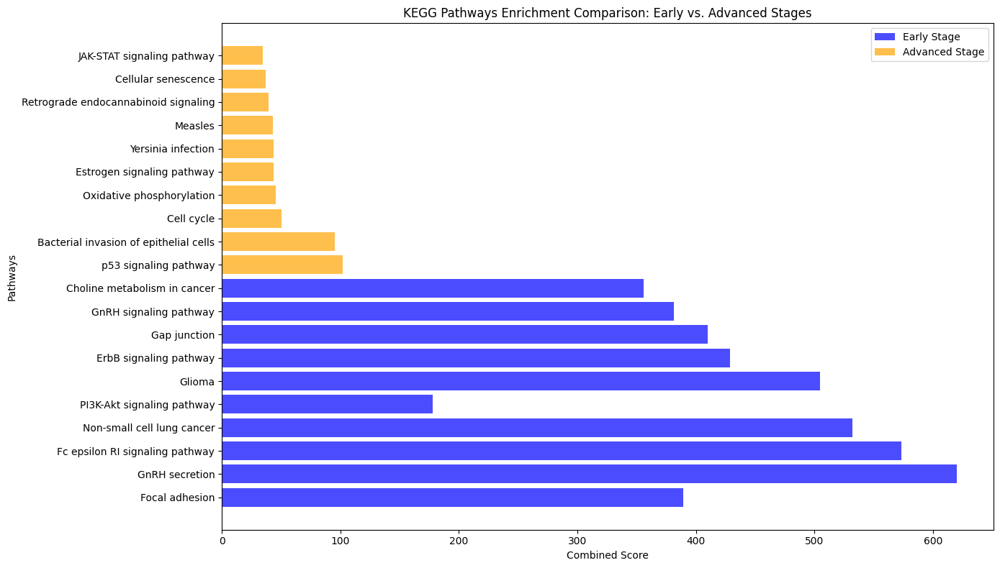

In [ ]:
import gseapy as gp
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Define gene lists for early and advanced stages
early_genes = ["TMEM163", "DENND3", "SLC11A1", "TBC1D14", "ERC2", "GRB2", "SPATA6", "SLC2A5", "SPP1", "PRKCA"]
advanced_genes = ["FOXP1", "XIST", "CCND3", "ELMO1", "FKBP5", "DOCK5", "MS4A6A", "ND3", "RNF150", "NHSL1"]

# Step 2: Perform pathway enrichment analysis for KEGG pathways
print("Performing KEGG pathway enrichment analysis for Early Stage genes...")
early_kegg = gp.enrichr(gene_list=early_genes,
                        gene_sets="KEGG_2021_Human",  # Use KEGG pathways for human
                        organism='human',            # Organism name
                        outdir=None)                 # No output directory

print("Performing KEGG pathway enrichment analysis for Advanced Stage genes...")
advanced_kegg = gp.enrichr(gene_list=advanced_genes,
                           gene_sets="KEGG_2021_Human",
                           organism='human',
                           outdir=None)

# Step 3: Extract top pathways for visualization
early_kegg_top = early_kegg.results[['Term', 'Combined Score']].head(10)
advanced_kegg_top = advanced_kegg.results[['Term', 'Combined Score']].head(10)

# Step 4: Visualize KEGG pathways
plt.figure(figsize=(14, 8))

# Early stage pathways
plt.barh(early_kegg_top['Term'], early_kegg_top['Combined Score'], color='blue', alpha=0.7, label='Early Stage')

# Advanced stage pathways
plt.barh(advanced_kegg_top['Term'], advanced_kegg_top['Combined Score'], color='orange', alpha=0.7, label='Advanced Stage')

plt.xlabel("Combined Score")
plt.ylabel("Pathways")
plt.title("KEGG Pathways Enrichment Comparison: Early vs. Advanced Stages")
plt.legend()
plt.tight_layout()

plt.show()


### Pathway Insights

### KEGG Pathways (Early Stage):
1. Focal Adhesion (Combined Score: 388.99): Plays a critical role in cell migration and signaling, potentially linked to early neuroprotection and microglial activation. Associated genes: SPP1, PRKCA, GRB2. Indicates potential roles in cell adhesion and extracellular matrix signaling.

2. GnRH Secretion and Signaling (Combined Scores: 619.92 and 381.04):Highlights the involvement of hormonal signaling, which may influence inflammation and microglial functions in the early stage. Genes SPP1 and PRKCA are involved, hinting at neuroendocrine interactions.

3. Fc Epsilon RI Signaling (Combined Score: 573.09): Reflects immune activation, supporting the hypothesis of early-stage microglial neuroprotective mechanisms. Significant with PRKCA and GRB2, suggesting immune modulation.

4. PI3K-Akt Signaling (Combined Score: 177.83): Associated with cell survival and anti-apoptotic functions, crucial for protecting neurons in early Alzheimer's disease (AD). Includes SPP1, PRKCA, GRB2.

5. ErbB and Gap Junction Pathways (Combined Scores: 428.66 and 409.65): ErbB signaling influences cellular proliferation and survival, while gap junctions facilitate intercellular communication.




### KEGG Pathways (Advanced Stage):


1. p53 Signaling Pathway (Combined Score: 102.25): Strongly linked to apoptosis and neurotoxicity, signaling the progression to advanced disease stages.  Key gene CCND3.

2. Oxidative Phosphorylation and Cell Cycle (Combined Scores: 45.80 and 50.39): Indicates energy metabolism disruptions and impaired cell-cycle regulation, key factors in neurodegeneration.
- ND3 in Oxidative Phosphorylation suggests impaired mitochondrial function.
- Involvement of CCND3 in Cell Cycle highlights dysregulation in cell division processes during advanced stages.

3. Bacterial Invasion and Immune Dysfunction (Combined Score: 95.32): Suggests inflammatory pathways contributing to the advanced-stage neurotoxicity. ELMO1 suggests immune response shifts.

  Overall, these pathways reflect mechanisms related to cellular senescence, oxidative phosphorylation, and mitotic dysregulation. Reduced immune-related pathways suggest a shift toward disease progression and reduced neuroprotective signaling.

### Comparison
**Early Neuroprotection**: Pathways like PI3K-Akt, ERBB2, and focal adhesion reflect a neuroprotective environment aimed at maintaining neuronal survival and repair mechanisms.

**Advanced Disease Mechanisms**: Advanced-stage enrichment in pathways like p53 signaling and mitotic dysregulation reflects cellular damage, increased apoptosis, and metabolic dysfunction.



In [ ]:
# List of validated Early and Late AD genes

# Step 1: Define gene lists for early and advanced stages
early_genes = ["TMEM163", "DENND3", "SLC11A1", "TBC1D14", "ERC2", "GRB2", "SPATA6", "SLC2A5", "SPP1", "PRKCA"]
advanced_genes = ["FOXP1", "XIST", "CCND3", "ELMO1", "FKBP5", "DOCK5", "MS4A6A", "ND3", "RNF150", "NHSL1"]

# Perform enrichment for Early AD genes
early_ad_enrichment = gp.enrichr(
    gene_list=early_genes,
    gene_sets='KEGG_2021_Human',
    organism='Human'
)
early_ad_enrichment.results.head()

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,KEGG_2021_Human,Focal adhesion,3/201,0.000114,0.010308,0,0,42.839827,388.987276,SPP1;PRKCA;GRB2
1,KEGG_2021_Human,GnRH secretion,2/64,0.000446,0.010308,0,0,80.354839,619.922544,SPP1;PRKCA
2,KEGG_2021_Human,Fc epsilon RI signaling pathway,2/68,0.000504,0.010308,0,0,75.469697,573.093987,PRKCA;GRB2
3,KEGG_2021_Human,Non-small cell lung cancer,2/72,0.000564,0.010308,0,0,71.142857,532.121352,PRKCA;GRB2
4,KEGG_2021_Human,PI3K-Akt signaling pathway,3/354,0.000602,0.010308,0,0,23.979243,177.829494,SPP1;PRKCA;GRB2


In [ ]:
# Perform enrichment for Early AD genes
advanced_ad_enrichment = gp.enrichr(
    gene_list=advanced_genes,
    gene_sets='KEGG_2021_Human',
    organism='Human'
)
advanced_ad_enrichment.results.head()

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,KEGG_2021_Human,p53 signaling pathway,1/73,0.035914,0.161942,0,0,30.737654,102.252718,CCND3
1,KEGG_2021_Human,Bacterial invasion of epithelial cells,1/77,0.037848,0.161942,0,0,29.114035,95.324547,ELMO1
2,KEGG_2021_Human,Cell cycle,1/124,0.060311,0.161942,0,0,17.946703,50.398535,CCND3
3,KEGG_2021_Human,Oxidative phosphorylation,1/133,0.064559,0.161942,0,0,16.715488,45.803453,ND3
4,KEGG_2021_Human,Estrogen signaling pathway,1/137,0.066441,0.161942,0,0,16.220588,43.981210,FKBP5


## Step 5.2 Perform pathway analysis specifically for APOE4 carriers vs. non-carriers


Performing KEGG_2021_Human pathway enrichment for APOE4 Carriers - Early Stage genes...
Performing KEGG_2021_Human pathway enrichment for APOE4 Carriers - Advanced Stage genes...
Performing KEGG_2021_Human pathway enrichment for Non-Carriers - Early Stage genes...
Performing KEGG_2021_Human pathway enrichment for Non-Carriers - Advanced Stage genes...


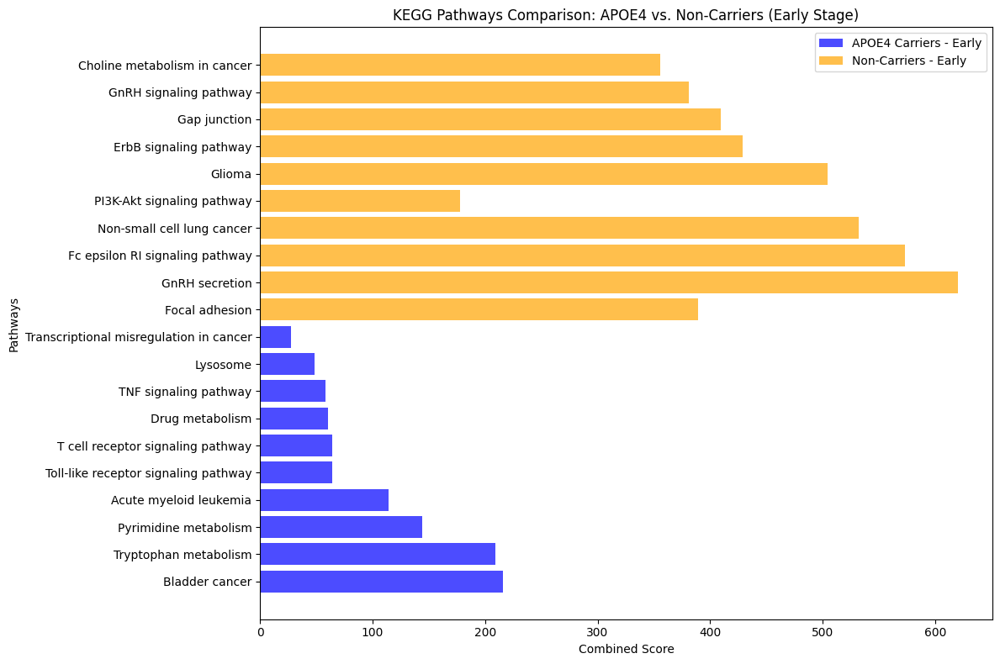

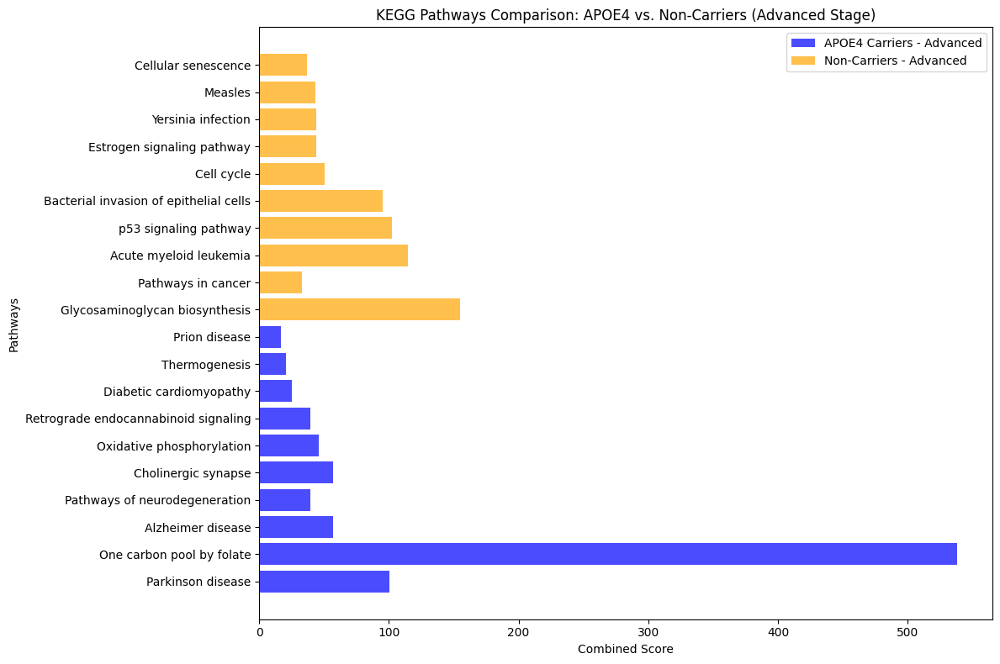

In [ ]:
import gseapy as gp
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Define gene lists
apoe4_carrier_genes_early = ["SLC11A1", "NEAT1", "TBC1D14", "CD163L1", "CD163", "MALAT1", "ZBTB16", "MAP3K8", "TYMP", "KYNU"]
apoe4_carrier_genes_advanced = ["HS3ST4", "SYNDIG1", "MTHFD1L", "KCNQ3", "SNCA", "SFMBT2", "ND3", "GLDN", "DSCAM", "LOC285626"]
non_carrier_genes_early = ["TMEM163", "DENND3", "SLC11A1", "TBC1D14", "SPATA6", "SLC2A5", "SPP1", "PRKCA", "UTY", "GRB2"]
non_carrier_genes_advanced = ["XIST", "MS4A6A", "CCND3", "DOCK5", "FKBP5", "RNF150", "ZBTB16", "FOXP1", "ELMO1", "CSGALNACT1"]

# Step 2: Perform pathway enrichment analysis
def perform_enrichment(gene_list, gene_set, stage, group):
    print(f"Performing {gene_set} pathway enrichment for {group} - {stage} Stage genes...")
    enrichment_results = gp.enrichr(
        gene_list=gene_list,
        gene_sets=gene_set,
        organism='human',
        outdir=None
    )
    return enrichment_results

# APOE4 carriers
apoe4_early_kegg = perform_enrichment(apoe4_carrier_genes_early, "KEGG_2021_Human", "Early", "APOE4 Carriers")
apoe4_advanced_kegg = perform_enrichment(apoe4_carrier_genes_advanced, "KEGG_2021_Human", "Advanced", "APOE4 Carriers")

# Non-carriers
non_carrier_early_kegg = perform_enrichment(non_carrier_genes_early, "KEGG_2021_Human", "Early", "Non-Carriers")
non_carrier_advanced_kegg = perform_enrichment(non_carrier_genes_advanced, "KEGG_2021_Human", "Advanced", "Non-Carriers")

# Step 3: Extract top pathways for visualization
def extract_top_pathways(results, n=10):
    return results.results[['Term', 'Adjusted P-value', 'Combined Score', 'Genes']].head(n)

apoe4_early_top = extract_top_pathways(apoe4_early_kegg)
apoe4_advanced_top = extract_top_pathways(apoe4_advanced_kegg)
non_carrier_early_top = extract_top_pathways(non_carrier_early_kegg)
non_carrier_advanced_top = extract_top_pathways(non_carrier_advanced_kegg)

# Step 4: Visualize results
def plot_comparison(pathways1, pathways2, label1, label2, title):
    plt.figure(figsize=(12, 8))
    plt.barh(pathways1['Term'], pathways1['Combined Score'], color='blue', alpha=0.7, label=label1)
    plt.barh(pathways2['Term'], pathways2['Combined Score'], color='orange', alpha=0.7, label=label2)
    plt.xlabel("Combined Score")
    plt.ylabel("Pathways")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Compare APOE4 carriers and non-carriers for Early and Advanced stages
plot_comparison(apoe4_early_top, non_carrier_early_top, "APOE4 Carriers - Early", "Non-Carriers - Early", "KEGG Pathways Comparison: APOE4 vs. Non-Carriers (Early Stage)")
plot_comparison(apoe4_advanced_top, non_carrier_advanced_top, "APOE4 Carriers - Advanced", "Non-Carriers - Advanced", "KEGG Pathways Comparison: APOE4 vs. Non-Carriers (Advanced Stage)")


### Key Findings - APOE4 vs. Non-Carriers Pathway Enrichment
**Early Stage:**

**Non-Carriers:** Enriched pathways like Focal adhesion, PI3K-Akt signaling, and ErbB signaling suggest systemic signaling, adhesion, and growth factor interactions. Immune and hormonal regulation pathways (e.g., Fc epsilon RI signaling) highlight early neuroprotective mechanisms.

**APOE4 Carriers:** Show heightened metabolic (e.g., Tryptophan metabolism) and immune activation (e.g., Toll-like receptor signaling, TNF signaling), indicating early inflammatory and proteostasis disruptions.

**Advanced Stage:**

**Non-Carriers:** Enriched pathways (Cellular senescence, p53 signaling) highlight aging, DNA damage responses, and extracellular matrix dysfunctions.

**APOE4 Carriers:** Strong enrichment in neurodegenerative pathways (Alzheimer’s disease, Parkinson’s disease) and neurotransmitter-specific dysfunctions (Cholinergic synapse) suggest accelerated progression and cognitive decline.

### Conclusion:

- APOE4 carriers exhibit earlier metabolic and immune dysregulation, with rapid transition to neurodegenerative pathways in advanced stages
- Non-carriers rely on compensatory mechanisms like cell cycle and senescence-related pathways that delay neurotoxicity.


In [ ]:
import gseapy as gp
import pandas as pd

# Step 1: Define gene lists for APOE4 carriers and non-carriers
apoe4_genes = ["SLC11A1", "TBC1D14", "NEAT1", "CD163", "ZBTB16", "KYNU", "MAP3K8", "MALAT1", "TYMP"]
non_carrier_genes = ["TMEM163", "DENND3", "PRKCA", "SPP1", "SLC2A5", "GRB2", "HIVEP3", "ERC2"]

# Step 2: Perform pathway enrichment analysis for APOE4 carriers (KEGG)
apoe4_kegg = gp.enrichr(gene_list=apoe4_genes,
                        gene_sets="KEGG_2021_Human",
                        organism="human",
                        outdir=None)

non_carrier_kegg = gp.enrichr(gene_list=non_carrier_genes,
                              gene_sets="KEGG_2021_Human",
                              organism="human",
                              outdir=None)

# Display top enriched pathways
print("\nTop KEGG pathways for APOE4 genes:")
print(apoe4_kegg.results[['Term', 'Adjusted P-value', 'Overlap', 'Combined Score']].head(10))

print("\nTop KEGG pathways for Non-carrier genes:")
print(non_carrier_kegg.results[['Term', 'Adjusted P-value', 'Overlap', 'Combined Score']].head(10))



Top KEGG pathways for APOE4 genes:
                                      Term  Adjusted P-value Overlap  \
0                           Bladder cancer          0.073943    1/41   
1                    Tryptophan metabolism          0.073943    1/42   
2                    Pyrimidine metabolism          0.073943    1/56   
3                   Acute myeloid leukemia          0.073943    1/67   
4     Toll-like receptor signaling pathway          0.073943   1/104   
5        T cell receptor signaling pathway          0.073943   1/104   
6                          Drug metabolism          0.073943   1/108   
7                    TNF signaling pathway          0.073943   1/112   
8                                 Lysosome          0.074877   1/128   
9  Transcriptional misregulation in cancer          0.099805   1/192   

   Combined Score  
0      249.430818  
1      241.881398  
2      167.277077  
3      132.635751  
4       74.397649  
5       74.397649  
6       70.743874  
7       67.

Performing KEGG pathway enrichment for APOE4 carriers...
Performing KEGG pathway enrichment for Non-carriers...
Top KEGG pathways for APOE4 Early Stage Genes:
                                   Term  Adjusted P-value  Combined Score  \
0                        Bladder cancer          0.050235      353.335453   
1                 Pyrimidine metabolism          0.050235      238.076678   
2  Toll-like receptor signaling pathway          0.050235      107.130206   
3     T cell receptor signaling pathway          0.050235      107.130206   
4                       Drug metabolism          0.050235      101.954141   

    Genes  
0    TYMP  
1    TYMP  
2  MAP3K8  
3  MAP3K8  
4    TYMP  

Top KEGG pathways for APOE4 Advanced Stage Genes:
                            Term  Adjusted P-value  Combined Score Genes
0              Parkinson disease          0.113252       55.765425  SNCA
1              Alzheimer disease          0.113252       32.267987  SNCA
2  Pathways of neurodegeneration    

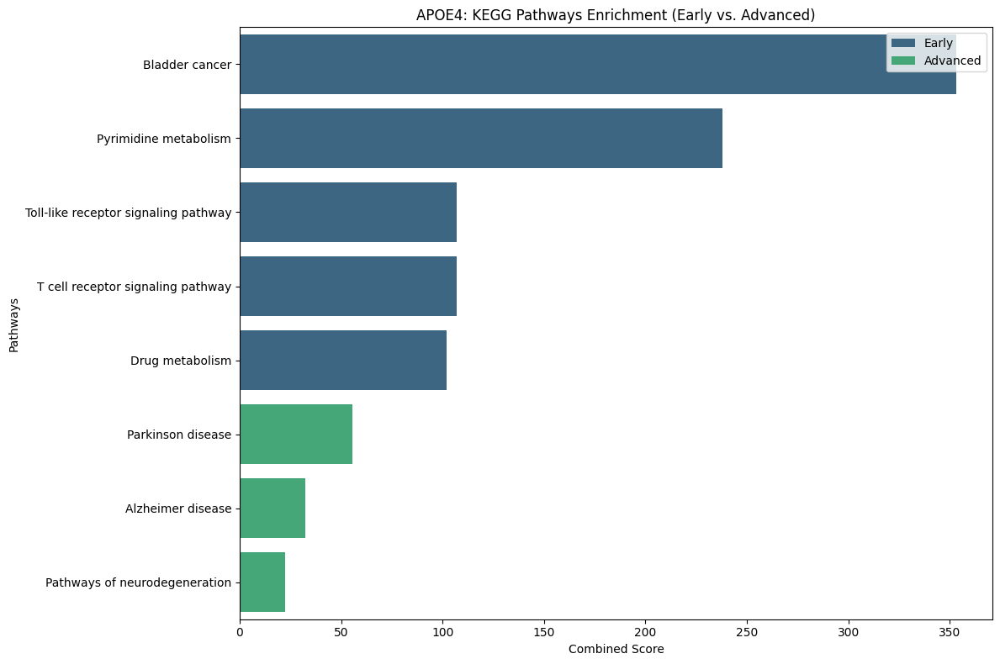

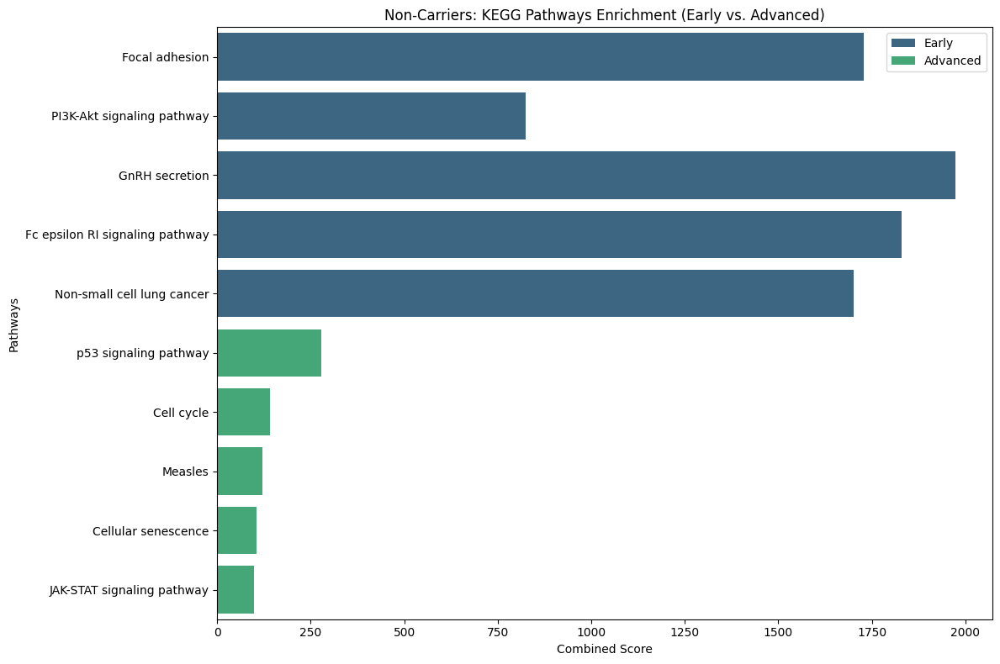

In [ ]:
import gseapy as gp
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Define gene lists for APOE4 carriers vs. non-carriers
apoe4_early_genes = ["SLC11A1", "NEAT1", "TBC1D14", "CD163L1", "MALAT1", "MAP3K8", "TYMP"]
apoe4_advanced_genes = ["HS3ST4", "SYNDIG1", "SNCA", "GLDN", "DSCAM"]

non_carrier_early_genes = ["TMEM163", "DENND3", "PRKCA", "SPP1", "GRB2"]
non_carrier_advanced_genes = ["XIST", "CCND3", "DOCK5", "RNF150", "NHSL1"]

# Step 2: Perform pathway enrichment for APOE4 carriers and non-carriers
print("Performing KEGG pathway enrichment for APOE4 carriers...")
apoe4_early_kegg = gp.enrichr(
    gene_list=apoe4_early_genes,
    gene_sets="KEGG_2021_Human",
    organism="human",
    outdir=None,
)

apoe4_advanced_kegg = gp.enrichr(
    gene_list=apoe4_advanced_genes,
    gene_sets="KEGG_2021_Human",
    organism="human",
    outdir=None,
)

print("Performing KEGG pathway enrichment for Non-carriers...")
non_carrier_early_kegg = gp.enrichr(
    gene_list=non_carrier_early_genes,
    gene_sets="KEGG_2021_Human",
    organism="human",
    outdir=None,
)

non_carrier_advanced_kegg = gp.enrichr(
    gene_list=non_carrier_advanced_genes,
    gene_sets="KEGG_2021_Human",
    organism="human",
    outdir=None,
)

# Step 3: Extract and compare key pathways
def extract_top_pathways(results, top_n=5):
    """Extract top pathways from GSEA results."""
    return results.results[["Term", "Adjusted P-value", "Combined Score", "Genes"]].head(top_n)

apoe4_early_top = extract_top_pathways(apoe4_early_kegg)
apoe4_advanced_top = extract_top_pathways(apoe4_advanced_kegg)
non_carrier_early_top = extract_top_pathways(non_carrier_early_kegg)
non_carrier_advanced_top = extract_top_pathways(non_carrier_advanced_kegg)

# Display top pathways for APOE4 carriers vs. non-carriers
print("Top KEGG pathways for APOE4 Early Stage Genes:")
print(apoe4_early_top)
print("\nTop KEGG pathways for APOE4 Advanced Stage Genes:")
print(apoe4_advanced_top)
print("\nTop KEGG pathways for Non-Carriers Early Stage Genes:")
print(non_carrier_early_top)
print("\nTop KEGG pathways for Non-Carriers Advanced Stage Genes:")
print(non_carrier_advanced_top)

# Step 4: Visualize pathway comparison
def visualize_pathways_comparison(pathways_early, pathways_advanced, title):
    """Visualize pathway comparison between early and advanced stages."""
    combined_data = pd.concat(
        [
            pathways_early.assign(Stage="Early"),
            pathways_advanced.assign(Stage="Advanced"),
        ]
    )
    plt.figure(figsize=(12, 8))
    sns.barplot(
        data=combined_data,
        x="Combined Score",
        y="Term",
        hue="Stage",
        palette="viridis",
    )
    plt.title(title)
    plt.xlabel("Combined Score")
    plt.ylabel("Pathways")
    plt.legend(loc="upper right")
    plt.tight_layout()
    plt.show()

# Visualize KEGG pathway enrichment for APOE4 carriers and non-carriers
visualize_pathways_comparison(apoe4_early_top, apoe4_advanced_top, "APOE4: KEGG Pathways Enrichment (Early vs. Advanced)")
visualize_pathways_comparison(non_carrier_early_top, non_carrier_advanced_top, "Non-Carriers: KEGG Pathways Enrichment (Early vs. Advanced)")

# Step 5: Investigate temporal changes (Optional with time-series data)
# Assuming you have time-series data for pathway dynamics:
# time_series_data = pd.read_csv("pathway_dynamics.csv") # Replace with actual data
# sns.lineplot(data=time_series_data, x="Time", y="Pathway Activity", hue="Pathway")
# plt.title("Temporal Changes in Pathway Dynamics")
# plt.show()



### Insights: APOE 4

**Early Stage**: APOE4 carriers emphasize metabolism (TYMP) and immune signaling (MAP3K8), while non-carriers highlight adhesion (SPP1, PRKCA) and broad signaling pathways.

This suggests metabolic priming in APOE4 carriers versus broader immune dysregulation in non-carriers.

**Advanced Stage**: APOE4 carriers focus on neurodegeneration-specific pathways (SNCA), such as Alzheimer’s and Parkinson’s disease.

Non-carriers emphasize cell cycle and inflammatory pathways (CCND3), suggesting a less neurodegeneration-centric progression.

## Step 6.1 Integrared Disease Stages

Early Stage AD:

*  Use Cognitie status: ‘No dementia’ with signs of mild cognitive impairment.
*  Braak stage: Lower stages (e.g., ‘Braak 0’ to ‘Braak III’).

Number of cells in early stage: 2594
Number of cells in late stage: 23413


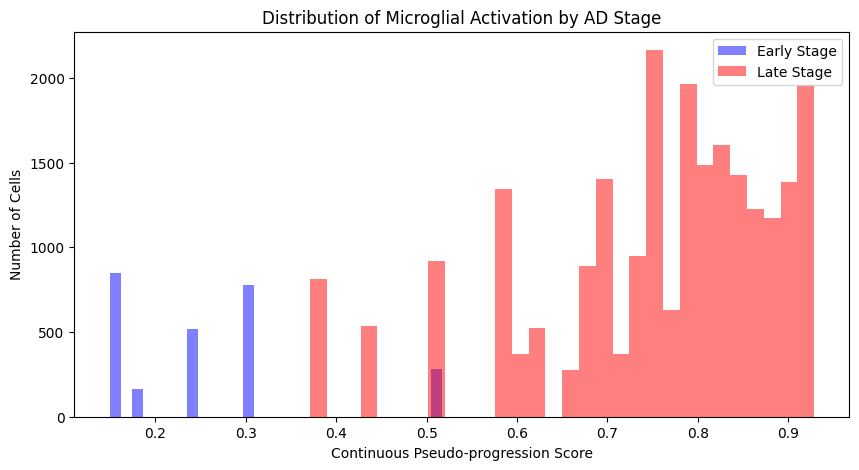

T-statistic: -212.0989479191894
P-value: 0.0
There is a statistically significant difference in microglial activation between early and late stages.


In [ ]:

# Define activation metric column name
activation_metric = 'Continuous Pseudo-progression Score'  # Adjust if a different metric is relevant

# Define early and late stage conditions based on revised criteria
early_stage_conditions = (
    (adata_mtg.obs['ADNC'] == 'Low') &
    (adata_mtg.obs['Braak stage'].isin(['Braak 0', 'Braak II', 'Braak III'])) &
    (adata_mtg.obs['Thal phase'].isin(['Thal 0', 'Thal 1', 'Thal 2'])) &
    (adata_mtg.obs['CERAD score'].isin(['Sparse', 'Absent']))
)

late_stage_conditions = (
    (adata_mtg.obs['ADNC'].isin(['Intermediate', 'High'])) &
    (adata_mtg.obs['Braak stage'].isin(['Braak IV', 'Braak V', 'Braak VI'])) &
    (adata_mtg.obs['Thal phase'].isin(['Thal 3', 'Thal 4', 'Thal 5'])) &
    (adata_mtg.obs['CERAD score'].isin(['Moderate', 'Frequent']))
)

# Filter data for early and late stages based on the revised criteria
early_stage_data = adata_mtg.obs[early_stage_conditions][activation_metric].dropna()
late_stage_data = adata_mtg.obs[late_stage_conditions][activation_metric].dropna()

# Display counts for each group
print("Number of cells in early stage:", early_stage_data.shape[0])
print("Number of cells in late stage:", late_stage_data.shape[0])

# Visualize the activation metric distribution for early and late stages
plt.figure(figsize=(10, 5))
plt.hist(early_stage_data, bins=30, alpha=0.5, label='Early Stage', color='blue')
plt.hist(late_stage_data, bins=30, alpha=0.5, label='Late Stage', color='red')
plt.xlabel(activation_metric)
plt.ylabel('Number of Cells')
plt.title('Distribution of Microglial Activation by AD Stage')
plt.legend()
plt.show()

# Perform a t-test to compare activation between early and late stages
t_stat, p_value = stats.ttest_ind(early_stage_data, late_stage_data, equal_var=False)

# Output results
print(f"T-statistic: {t_stat}")
print(f"P-value: {p_value}")

if p_value < 0.05:
    print("There is a statistically significant difference in microglial activation between early and late stages.")
else:
    print("There is no statistically significant difference in microglial activation between early and late stages.")


Late Stage AD:


*   Cognitive status: ‘Dementia’.
*   Braak stage: Higher stages (e.g., ‘Braak IV’ to ‘Braak VI’).


## Step 6.2. Group by APOE4 Status:

APOE4 Carriers:
*   APOE4 status: ‘Y’.




In [ ]:
# Define new groupings based on Braak stage, Thal phase, and ADNC
# Early Stage: ADNC = 'Low' OR (Braak stage ≤ III OR Thal phase ≤ 2)
# Late Stage: ADNC = 'Intermediate' or 'High' OR (Braak stage ≥ IV OR Thal phase ≥ 3)

# Filter based on Braak stage, Thal phase, and ADNC for APOE4 Carriers (Early and Late stages)
early_stage_carriers = adata_mtg_filtered.obs[
    (adata_mtg_filtered.obs['APOE4 status'] == 'Y') &
    (
        (adata_mtg_filtered.obs['ADNC'] == 'Low') |
        (adata_mtg_filtered.obs['Braak stage'].isin(['Braak 0', 'Braak II', 'Braak III'])) |
        (adata_mtg_filtered.obs['Thal phase'].isin(['Thal 0', 'Thal 1', 'Thal 2']))
    )
]['Continuous Pseudo-progression Score'].dropna()

late_stage_carriers = adata_mtg_filtered.obs[
    (adata_mtg_filtered.obs['APOE4 status'] == 'Y') &
    (
        adata_mtg_filtered.obs['ADNC'].isin(['Intermediate', 'High']) |
        (adata_mtg_filtered.obs['Braak stage'].isin(['Braak IV', 'Braak V', 'Braak VI'])) |
        (adata_mtg_filtered.obs['Thal phase'].isin(['Thal 3', 'Thal 4', 'Thal 5']))
    )
]['Continuous Pseudo-progression Score'].dropna()

# Filter based on Braak stage, Thal phase, and ADNC for APOE4 Non-Carriers (Early and Late stages)
early_stage_non_carriers = adata_mtg_filtered.obs[
    (adata_mtg_filtered.obs['APOE4 status'] == 'N') &
    (
        (adata_mtg_filtered.obs['ADNC'] == 'Low') |
        (adata_mtg_filtered.obs['Braak stage'].isin(['Braak 0', 'Braak II', 'Braak III'])) |
        (adata_mtg_filtered.obs['Thal phase'].isin(['Thal 0', 'Thal 1', 'Thal 2']))
    )
]['Continuous Pseudo-progression Score'].dropna()

late_stage_non_carriers = adata_mtg_filtered.obs[
    (adata_mtg_filtered.obs['APOE4 status'] == 'N') &
    (
        adata_mtg_filtered.obs['ADNC'].isin(['Intermediate', 'High']) |
        (adata_mtg_filtered.obs['Braak stage'].isin(['Braak IV', 'Braak V', 'Braak VI'])) |
        (adata_mtg_filtered.obs['Thal phase'].isin(['Thal 3', 'Thal 4', 'Thal 5']))
    )
]['Continuous Pseudo-progression Score'].dropna()

# Display cell counts for each group
print(f"APOE4 Carriers - Early Stage Cells: {len(early_stage_carriers)}")
print(f"APOE4 Carriers - Late Stage Cells: {len(late_stage_carriers)}")
print(f"APOE4 Non-Carriers - Early Stage Cells: {len(early_stage_non_carriers)}")
print(f"APOE4 Non-Carriers - Late Stage Cells: {len(late_stage_non_carriers)}")

# Perform t-tests for APOE4 carriers and non-carriers separately
if len(early_stage_carriers) > 0 and len(late_stage_carriers) > 0:
    t_stat_carriers, p_val_carriers = ttest_ind(early_stage_carriers, late_stage_carriers, equal_var=False)
    print(f"T-statistic for APOE4 Carriers (Early vs Late): {t_stat_carriers}")
    print(f"P-value for APOE4 Carriers (Early vs Late): {p_val_carriers}")
else:
    print("Insufficient data for APOE4 Carriers in either early or late stage.")

if len(early_stage_non_carriers) > 0 and len(late_stage_non_carriers) > 0:
    t_stat_non_carriers, p_val_non_carriers = ttest_ind(early_stage_non_carriers, late_stage_non_carriers, equal_var=False)
    print(f"T-statistic for APOE4 Non-Carriers (Early vs Late): {t_stat_non_carriers}")
    print(f"P-value for APOE4 Non-Carriers (Early vs Late): {p_val_non_carriers}")
else:
    print("Insufficient data for APOE4 Non-Carriers in either early or late stage.")


APOE4 Carriers - Early Stage Cells: 637
APOE4 Carriers - Late Stage Cells: 11455
APOE4 Non-Carriers - Early Stage Cells: 12015
APOE4 Non-Carriers - Late Stage Cells: 23879
T-statistic for APOE4 Carriers (Early vs Late): -25.553977658488918
P-value for APOE4 Carriers (Early vs Late): 6.42543815215523e-101
T-statistic for APOE4 Non-Carriers (Early vs Late): -102.67992236222808
P-value for APOE4 Non-Carriers (Early vs Late): 0.0


### Key Findings

**APOE4 Carriers:**

The significant difference in microglial activation between early and late stages for APOE4 carriers supports the hypothesis that microglial activation changes as Alzheimer's progresses in individuals with the APOE4 gene. Given the negative t-statistic, this might indicate a shift in the nature of microglial activation—potentially from a protective role in the early stages to a more harmful or neurotoxic role in the later stages.
APOE4 Non-Carriers:

Similarly, the significant difference in microglial activation between early and late stages for APOE4 non-carriers suggests that this shift in microglial activity is not exclusive to APOE4 carriers. However, the larger t-statistic in non-carriers might imply a more pronounced change in microglial activation across stages for those without the APOE4 gene, or simply that there’s a consistent progression in microglial activation as the disease advances regardless of APOE4 status.

**Conclusion:**
The results support the hypothesis that microglial activation shifts between early and late stages in Alzheimer’s disease. However, the shift occurs in both APOE4 carriers and non-carriers, indicating that while APOE4 may influence Alzheimer's progression, changes in microglial activation between early and late stages are a broader characteristic of the disease progression and not limited solely to APOE4 carriers.

**Further Analysis:**
To fully validate these findings and understand the nuances, further statistical tests or adjustments might be needed to control for additional variables or confirm the biological implications of these observed differences in microglial activation across Alzheimer’s stages.

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

# Step 1: Extract metadata (obs) and gene expression data (sparse format)
metadata_df = adata_mtg_filtered.obs

# Use gene expression matrix in sparse format to save memory
gene_expression_sparse = adata_mtg_filtered.X  # This is a sparse matrix

# Step 2: Convert the sparse gene expression matrix to a dense format to calculate variance
gene_expression_dense = gene_expression_sparse.toarray()

# Create a DataFrame for gene expression data
gene_expression_df = pd.DataFrame(gene_expression_dense, columns=adata_mtg_filtered.var_names)

# Step 3: Calculate variance and select the top 500 genes based on variance
gene_variances = gene_expression_df.var(axis=0)
top_genes = gene_variances.nlargest(500).index
gene_expression_df_reduced = gene_expression_df[top_genes]

# Step 4: Combine metadata and reduced gene expression data into a single DataFrame
combined_df = pd.concat([metadata_df.reset_index(drop=True), gene_expression_df_reduced.reset_index(drop=True)], axis=1)

# Step 5: Filter out 'Reference' entries and create 'neuro_role' based only on 'Braak stage'
combined_df_filtered = combined_df[~combined_df['Braak stage'].isin(['Reference'])].copy()

# Define 'early' and 'late' using Braak stages
braak_early_stages = ['Braak 0', 'Braak I', 'Braak II', 'Braak III']
braak_late_stages = ['Braak IV', 'Braak V', 'Braak VI']

# Step 6: Create a new column 'neuro_role' and encode it as 0 and 1 for ML (0: early, 1: late)
combined_df_filtered['neuro_role'] = np.where(combined_df_filtered['Braak stage'].isin(braak_early_stages), 'early', 'late')
combined_df_filtered['neuro_role_encoded'] = combined_df_filtered['neuro_role'].map({'early': 0, 'late': 1})

# Step 7: Sample a smaller subset of the combined DataFrame for easier handling (ensure consistent X and y)
combined_df_sampled = combined_df_filtered.sample(frac=0.1, random_state=42)

# Step 8: Extract selected metadata features for ML preparation
metadata_features = combined_df_sampled[[
    'Braak stage', 'APOE4 status', 'Age at death', 'Cognitive status', 'ADNC',
    'CERAD score', 'Lewy body disease pathology', 'LATE-NC stage', 'Number of UMIs',
    'Genes detected', 'Fraction mitochrondrial UMIs', 'sex', 'Years of education', 'development_stage'
]].copy()

# Step 9: One-hot encode categorical features
categorical_features = [
    'Braak stage', 'APOE4 status', 'Age at death', 'Cognitive status',
    'ADNC', 'CERAD score', 'Lewy body disease pathology', 'LATE-NC stage',
    'sex', 'Years of education', 'development_stage'
]

metadata_features = pd.get_dummies(metadata_features, columns=categorical_features)

# Step 10: Scale numeric features using MinMaxScaler
scaler = MinMaxScaler()
numeric_features = ['Number of UMIs', 'Genes detected', 'Fraction mitochrondrial UMIs']
metadata_features[numeric_features] = scaler.fit_transform(metadata_features[numeric_features])

# Step 11: Combine the processed metadata with reduced gene expression data
processed_combined_df = pd.concat([metadata_features.reset_index(drop=True), gene_expression_df_reduced.loc[combined_df_sampled.index].reset_index(drop=True)], axis=1)

# Step 12: Extract features (X) and target (y) for ML
X = processed_combined_df
y = combined_df_sampled['neuro_role_encoded']

# Step 13: Split into training and testing sets (e.g., 80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("Training set size:", X_train.shape)
print("Testing set size:", X_test.shape)

# Step 14: Initialize and train the Random Forest Classifier
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Step 15: Make predictions and evaluate
y_pred = model.predict(X_test)

# Step 16: Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Training set size: (3097, 574)
Testing set size: (775, 574)
Accuracy: 0.99

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.97      0.98       124
           1       0.99      1.00      1.00       651

    accuracy                           0.99       775
   macro avg       1.00      0.98      0.99       775
weighted avg       0.99      0.99      0.99       775



Check for potential issues like overfitting or data leakage.

Training set size: (3097, 574)
Testing set size: (775, 574)
Accuracy: 0.99

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.97      0.98       124
           1       0.99      1.00      1.00       651

    accuracy                           0.99       775
   macro avg       1.00      0.98      0.99       775
weighted avg       0.99      0.99      0.99       775



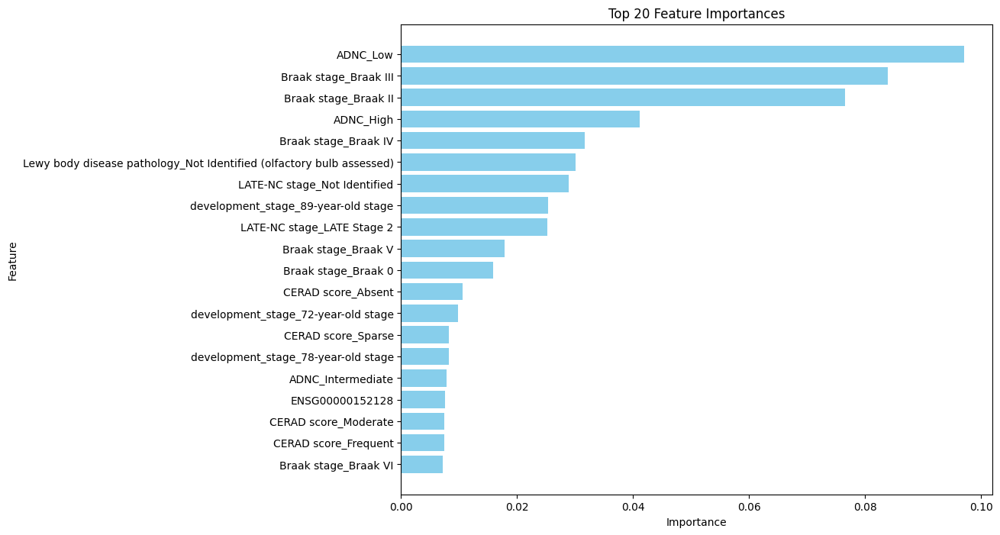

Cross-Validation Scores: [1.         0.99483871 1.         1.         0.99870801]
Mean Cross-Validation Score: 0.9987093440026674
Accuracy after SMOTE: 1.00

Classification Report after SMOTE:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       634
           1       1.00      1.00      1.00       677

    accuracy                           1.00      1311
   macro avg       1.00      1.00      1.00      1311
weighted avg       1.00      1.00      1.00      1311



In [ ]:
# Step 17: Feature Importance Analysis
importances = model.feature_importances_
feature_names = X.columns
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot the top 20 most important features
plt.figure(figsize=(10, 8))
plt.barh(feature_importance_df['Feature'][:20], feature_importance_df['Importance'][:20], color='skyblue')
plt.gca().invert_yaxis()
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Top 20 Feature Importances')
plt.show()

# Step 18: Cross-Validation
cross_val_scores = cross_val_score(model, X, y, cv=5)
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Cross-Validation Score:", cross_val_scores.mean())

# Step 19: Handle Class Imbalance with SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Step 20: Train-Test Split after Resampling
X_train_resampled, X_test_resampled, y_train_resampled, y_test_resampled = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Step 21: Train the Random Forest Classifier on Resampled Data
model_resampled = RandomForestClassifier(n_estimators=100, random_state=42)
model_resampled.fit(X_train_resampled, y_train_resampled)

# Step 22: Make Predictions and Evaluate on Resampled Data
y_pred_resampled = model_resampled.predict(X_test_resampled)

# Step 23: Evaluate Model Performance on Resampled Data
accuracy_resampled = accuracy_score(y_test_resampled, y_pred_resampled)
print(f"Accuracy after SMOTE: {accuracy_resampled:.2f}")
print("\nClassification Report after SMOTE:")
print(classification_report(y_test_resampled, y_pred_resampled))


Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.04      0.08      1212
           1       0.85      1.00      0.92      6533

    accuracy                           0.85      7745
   macro avg       0.92      0.52      0.50      7745
weighted avg       0.87      0.85      0.79      7745



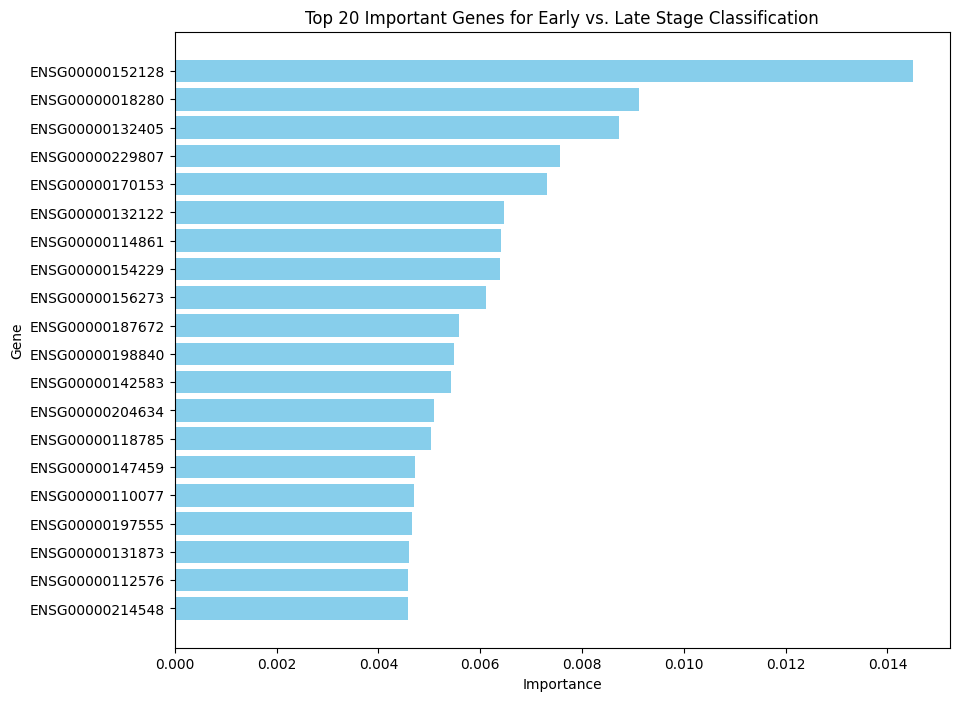


Top 20 Genes That Differentiate Between Early and Late Stages:
                Gene  Importance
3    ENSG00000152128    0.014499
40   ENSG00000018280    0.009110
189  ENSG00000132405    0.008719
1    ENSG00000229807    0.007560
46   ENSG00000170153    0.007312
62   ENSG00000132122    0.006462
437  ENSG00000114861    0.006404
166  ENSG00000154229    0.006396
445  ENSG00000156273    0.006109
92   ENSG00000187672    0.005583
7    ENSG00000198840    0.005495
210  ENSG00000142583    0.005431
286  ENSG00000204634    0.005087
4    ENSG00000118785    0.005031
163  ENSG00000147459    0.004726
179  ENSG00000110077    0.004703
119  ENSG00000197555    0.004661
188  ENSG00000131873    0.004605
94   ENSG00000112576    0.004587
245  ENSG00000214548    0.004573


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt

# Step 1: Extract Metadata and Gene Expression Data
metadata_df = adata_mtg_filtered.obs

# Use gene expression matrix in sparse format to save memory
gene_expression_sparse = adata_mtg_filtered.X  # This is a sparse matrix

# Step 2: Convert Sparse Matrix to Dense Format
gene_expression_dense = gene_expression_sparse.toarray()

# Create DataFrame for Gene Expression Data
gene_expression_df = pd.DataFrame(gene_expression_dense, columns=adata_mtg_filtered.var_names)

# Step 3: Calculate Variance and Select Top 500 Genes
gene_variances = gene_expression_df.var(axis=0)
top_genes = gene_variances.nlargest(500).index
gene_expression_df_reduced = gene_expression_df[top_genes]

# Step 4: Combine Metadata and Gene Expression Data
combined_df = pd.concat([metadata_df.reset_index(drop=True), gene_expression_df_reduced.reset_index(drop=True)], axis=1)

# Step 5: Create Target Variable Based on Braak Stage
braak_condition = combined_df['Braak stage'].isin(['Braak 0', 'Braak II', 'Braak III'])
combined_df['neuro_role'] = np.where(braak_condition, 'early', 'late')
combined_df = combined_df[combined_df['Braak stage'] != 'Reference']  # Remove 'Reference' values
combined_df['neuro_role_encoded'] = combined_df['neuro_role'].map({'early': 0, 'late': 1})

# Step 6: Prepare Features (X) and Target (y)
X = gene_expression_df_reduced.loc[combined_df.index]  # Only use gene expression data for feature selection
y = combined_df['neuro_role_encoded']

# Step 7: Split Data into Training and Testing Sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 8: Train a Random Forest Classifier
model = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
model.fit(X_train, y_train)

# Step 9: Evaluate Model Performance
y_pred = model.predict(X_test)
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Step 10: Extract Feature Importances
feature_importances = model.feature_importances_
feature_importance_df = pd.DataFrame({'Gene': X.columns, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Step 11: Plot the Top 20 Most Important Genes
plt.figure(figsize=(10, 8))
plt.barh(feature_importance_df['Gene'][:20], feature_importance_df['Importance'][:20], color='skyblue')
plt.gca().invert_yaxis()
plt.xlabel('Importance')
plt.ylabel('Gene')
plt.title('Top 20 Important Genes for Early vs. Late Stage Classification')
plt.show()

# Step 12: Display Top Genes
print("\nTop 20 Genes That Differentiate Between Early and Late Stages:")
print(feature_importance_df.head(20))


Improve model using smote & XGBoost => improve a lot.

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [10:36:12] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.90      0.94      6546
           1       0.91      0.97      0.94      6528

    accuracy                           0.94     13074
   macro avg       0.94      0.94      0.94     13074
weighted avg       0.94      0.94      0.94     13074

ROC AUC Score: 0.98


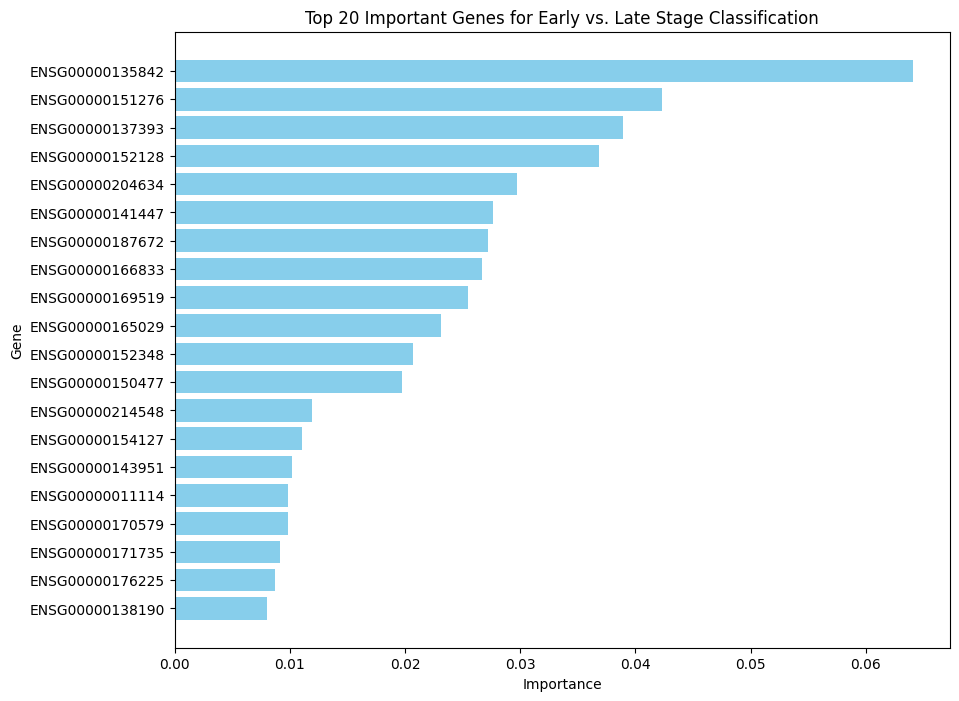


Top 20 Genes That Differentiate Between Early and Late Stages:
                Gene  Importance
108  ENSG00000135842    0.064092
482  ENSG00000151276    0.042349
172  ENSG00000137393    0.038923
3    ENSG00000152128    0.036855
286  ENSG00000204634    0.029726
243  ENSG00000141447    0.027599
92   ENSG00000187672    0.027236
59   ENSG00000166833    0.026716
470  ENSG00000169519    0.025437
481  ENSG00000165029    0.023150
381  ENSG00000152348    0.020708
431  ENSG00000150477    0.019753
245  ENSG00000214548    0.011947
171  ENSG00000154127    0.011015
435  ENSG00000143951    0.010194
433  ENSG00000011114    0.009855
349  ENSG00000170579    0.009814
440  ENSG00000171735    0.009123
82   ENSG00000176225    0.008670
442  ENSG00000138190    0.007997


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score
from imblearn.over_sampling import BorderlineSMOTE
import xgboost as xgb
import matplotlib.pyplot as plt

# Step 1: Extract Metadata and Gene Expression Data
metadata_df = adata_mtg_filtered.obs

# Use gene expression matrix in sparse format to save memory
gene_expression_sparse = adata_mtg_filtered.X  # This is a sparse matrix

# Step 2: Convert Sparse Matrix to Dense Format
gene_expression_dense = gene_expression_sparse.toarray()

# Create DataFrame for Gene Expression Data
gene_expression_df = pd.DataFrame(gene_expression_dense, columns=adata_mtg_filtered.var_names)

# Step 3: Calculate Variance and Select Top 500 Genes
gene_variances = gene_expression_df.var(axis=0)
top_genes = gene_variances.nlargest(500).index
gene_expression_df_reduced = gene_expression_df[top_genes]

# Step 4: Combine Metadata and Gene Expression Data
combined_df = pd.concat([metadata_df.reset_index(drop=True), gene_expression_df_reduced.reset_index(drop=True)], axis=1)

# Step 5: Create Target Variable Based on Braak Stage
braak_condition = combined_df['Braak stage'].isin(['Braak 0', 'Braak II', 'Braak III'])
combined_df['neuro_role'] = np.where(braak_condition, 'early', 'late')
combined_df = combined_df[combined_df['Braak stage'] != 'Reference']  # Remove 'Reference' values
combined_df['neuro_role_encoded'] = combined_df['neuro_role'].map({'early': 0, 'late': 1})

# Step 6: Prepare Features (X) and Target (y)
X = gene_expression_df_reduced.loc[combined_df.index]  # Only use gene expression data for feature selection
y = combined_df['neuro_role_encoded']

# Step 7: Handle Class Imbalance with Borderline-SMOTE
smote = BorderlineSMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Step 8: Split Data into Training and Testing Sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Step 9: Train an XGBoost Classifier
model = xgb.XGBClassifier(n_estimators=100, random_state=42, use_label_encoder=False, eval_metric='logloss')
model.fit(X_train, y_train)

# Step 10: Evaluate Model Performance
y_pred = model.predict(X_test)
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Step 11: Calculate ROC AUC Score
y_pred_prob = model.predict_proba(X_test)[:, 1]
roc_auc = roc_auc_score(y_test, y_pred_prob)
print(f"ROC AUC Score: {roc_auc:.2f}")

# Step 12: Extract Feature Importances
feature_importances = model.feature_importances_
feature_importance_df = pd.DataFrame({'Gene': X.columns, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Step 13: Plot the Top 20 Most Important Genes
plt.figure(figsize=(10, 8))
plt.barh(feature_importance_df['Gene'][:20], feature_importance_df['Importance'][:20], color='skyblue')
plt.gca().invert_yaxis()
plt.xlabel('Importance')
plt.ylabel('Gene')
plt.title('Top 20 Important Genes for Early vs. Late Stage Classification')
plt.show()

# Step 14: Display Top Genes
print("\nTop 20 Genes That Differentiate Between Early and Late Stages:")
print(feature_importance_df.head(20))


## Classification Report

Accuracy: The model achieved an overall accuracy of 94%, which indicates it is making correct predictions for a majority of the samples.

Precision, Recall, F1-Score:
For class 0 (early stage), precision is 97% and recall is 90%. This means the model is effective at identifying early-stage samples but still occasionally misses them (lower recall).
For class 1 (late stage), precision is 91% and recall is 97%, indicating that the model is very good at correctly identifying late-stage samples.
The F1-score for both classes is 94%, highlighting a good balance between precision and recall.

ROC AUC Score: The ROC AUC score of 0.98 is excellent, demonstrating that the model can effectively discriminate between early and late stages.
Top 20 Genes That Differentiate Between Early and Late Stages
The list of top 20 genes provides insight into the biological markers that have the most predictive power in differentiating between early and late stages. These genes are ranked by their importance scores from the XGBoost model.


Summary of Improvements
Class Imbalance Handling: Borderline-SMOTE was used to balance the classes, which improved the recall for class 0 (early stage), helping the model make better predictions for minority classes.
XGBoost Classifier: Switching to XGBoost helped optimize the model’s performance, especially in handling complex relationships between features and improving overall precision, recall, and F1-scores.


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [10:39:57] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.90      0.94      6546
           1       0.91      0.97      0.94      6528

    accuracy                           0.94     13074
   macro avg       0.94      0.94      0.94     13074
weighted avg       0.94      0.94      0.94     13074

ROC AUC Score: 0.98


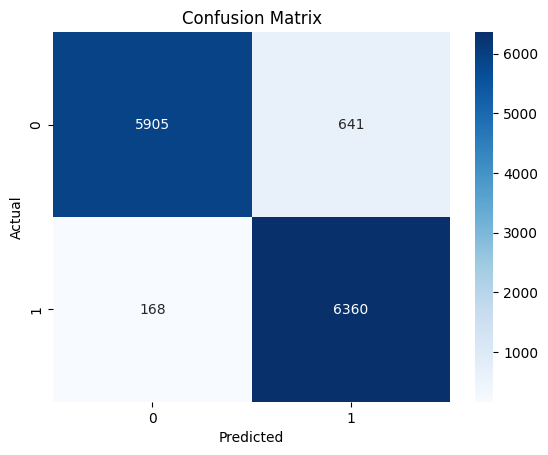

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [10:40:11] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [10:40:22] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [10:40:34] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [10:40:47] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [10:40:59] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_e

Cross-Validation Scores: [0.57182194 0.98080159 0.984473   0.98301843 0.98171804]
Mean Cross-Validation Score: 0.9003666014453078


 99%|===================| 12947/13074 [01:13<00:00]       

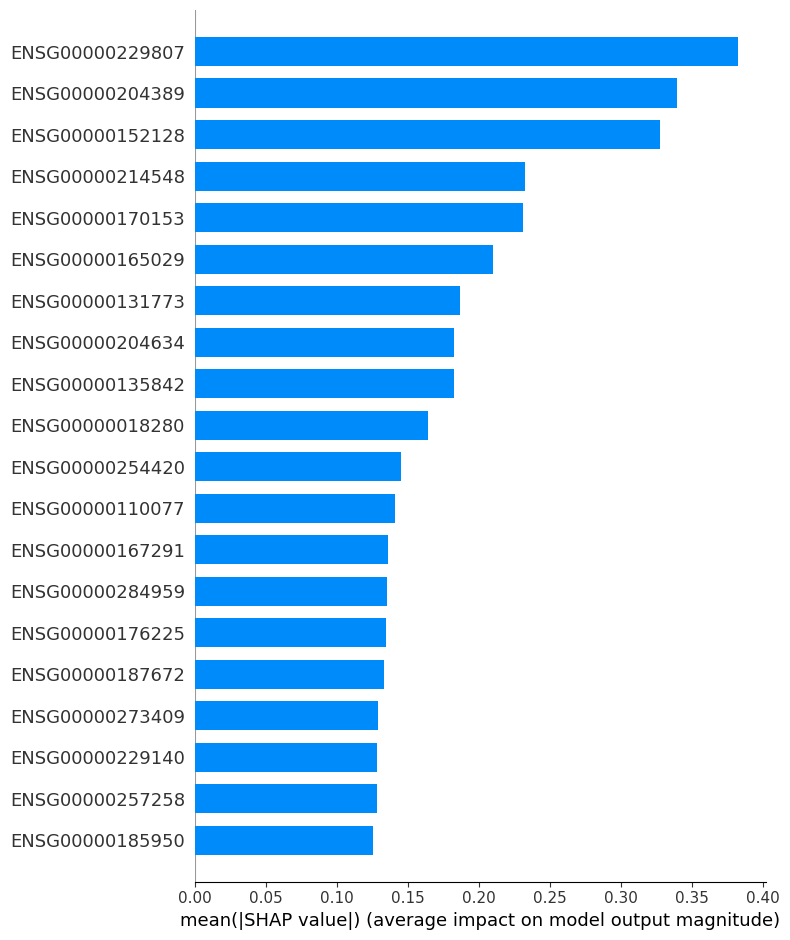

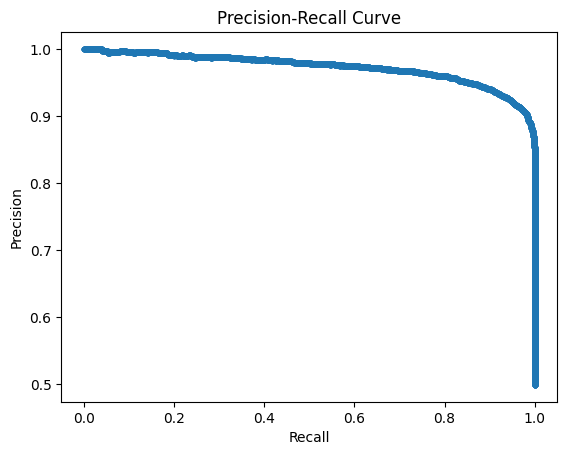


Top 20 Genes That Differentiate Between Early and Late Stages:
                Gene  Importance
108  ENSG00000135842    0.064092
482  ENSG00000151276    0.042349
172  ENSG00000137393    0.038923
3    ENSG00000152128    0.036855
286  ENSG00000204634    0.029726
243  ENSG00000141447    0.027599
92   ENSG00000187672    0.027236
59   ENSG00000166833    0.026716
470  ENSG00000169519    0.025437
481  ENSG00000165029    0.023150
381  ENSG00000152348    0.020708
431  ENSG00000150477    0.019753
245  ENSG00000214548    0.011947
171  ENSG00000154127    0.011015
435  ENSG00000143951    0.010194
433  ENSG00000011114    0.009855
349  ENSG00000170579    0.009814
440  ENSG00000171735    0.009123
82   ENSG00000176225    0.008670
442  ENSG00000138190    0.007997


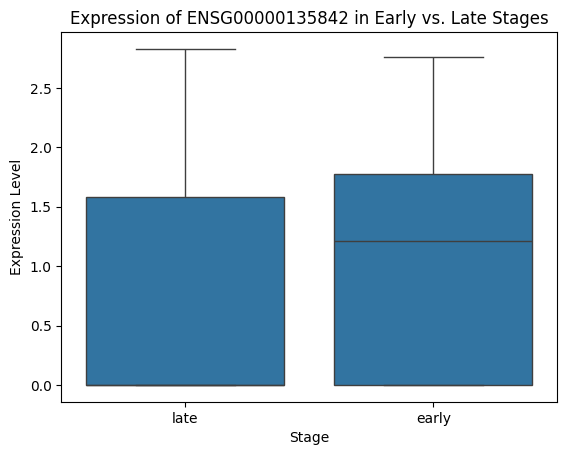

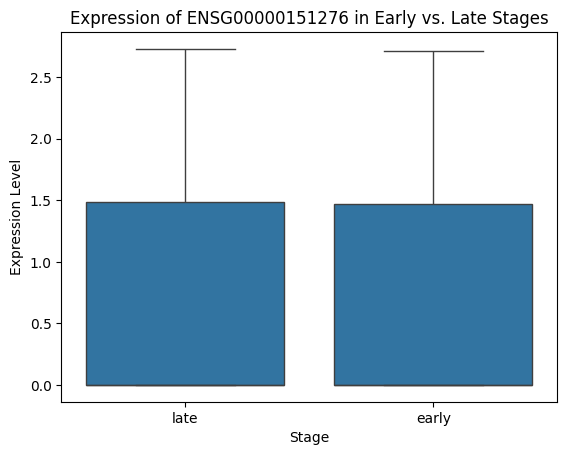

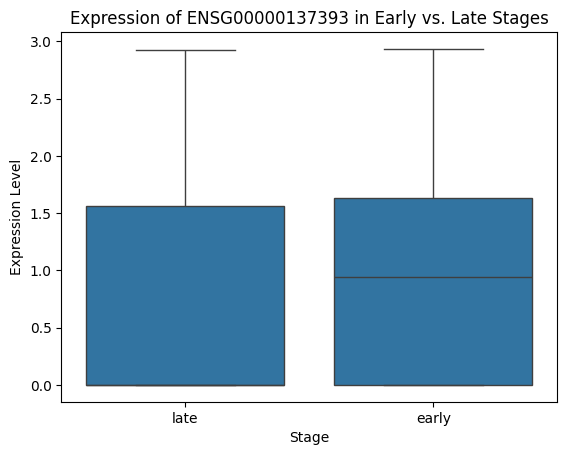

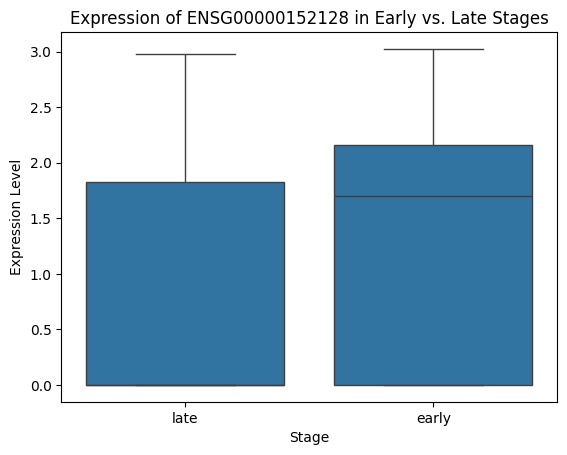

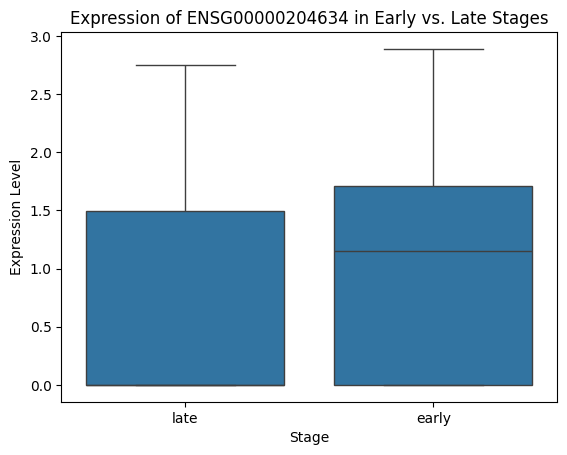

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix, precision_recall_curve
import xgboost as xgb
import shap
import seaborn as sns
import matplotlib.pyplot as plt
from imblearn.over_sampling import BorderlineSMOTE

# Step 1: Extract Metadata and Gene Expression Data
metadata_df = adata_mtg_filtered.obs
gene_expression_sparse = adata_mtg_filtered.X  # Sparse matrix

# Step 2: Convert Sparse Matrix to Dense Format
gene_expression_dense = gene_expression_sparse.toarray()
gene_expression_df = pd.DataFrame(gene_expression_dense, columns=adata_mtg_filtered.var_names)

# Step 3: Calculate Variance and Select Top 500 Genes
gene_variances = gene_expression_df.var(axis=0)
top_genes = gene_variances.nlargest(500).index
gene_expression_df_reduced = gene_expression_df[top_genes]

# Step 4: Combine Metadata and Gene Expression Data
combined_df = pd.concat([metadata_df.reset_index(drop=True), gene_expression_df_reduced.reset_index(drop=True)], axis=1)

# Step 5: Create Target Variable Based on Braak Stage
braak_condition = combined_df['Braak stage'].isin(['Braak 0', 'Braak II', 'Braak III'])
combined_df['neuro_role'] = np.where(braak_condition, 'early', 'late')
combined_df = combined_df[combined_df['Braak stage'] != 'Reference']
combined_df['neuro_role_encoded'] = combined_df['neuro_role'].map({'early': 0, 'late': 1})

# Step 6: Prepare Features (X) and Target (y)
X = gene_expression_df_reduced.loc[combined_df.index]
y = combined_df['neuro_role_encoded']

# Step 7: Handle Class Imbalance Using BorderlineSMOTE
smote = BorderlineSMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Step 8: Split Data into Training and Testing Sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Step 9: Train XGBoost Classifier
model = xgb.XGBClassifier(n_estimators=100, random_state=42, eval_metric='logloss', use_label_encoder=False)
model.fit(X_train, y_train)

# Step 10: Evaluate Model Performance
y_pred = model.predict(X_test)
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(f"ROC AUC Score: {roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]):.2f}")

# Step 11: Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Step 12: Cross-Validation
cross_val_scores = cross_val_score(model, X_resampled, y_resampled, cv=5)
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Cross-Validation Score:", cross_val_scores.mean())

# Step 13: SHAP Values for Interpretability
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Summary plot for feature importances using SHAP values
shap.summary_plot(shap_values, X_test, plot_type="bar")

# Step 14: Precision-Recall Curve
precision, recall, thresholds = precision_recall_curve(y_test, model.predict_proba(X_test)[:, 1])
plt.plot(recall, precision, marker='.')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

# Step 15: Top Genes Analysis
feature_importances = model.feature_importances_
feature_importance_df = pd.DataFrame({'Gene': X.columns, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

print("\nTop 20 Genes That Differentiate Between Early and Late Stages:")
print(feature_importance_df.head(20))

# Step 16: Box Plot of Top Genes
top_genes_list = feature_importance_df['Gene'][:5]
for gene in top_genes_list:
    sns.boxplot(x=combined_df['neuro_role'], y=gene_expression_df_reduced[gene])
    plt.title(f'Expression of {gene} in Early vs. Late Stages')
    plt.xlabel('Stage')
    plt.ylabel('Expression Level')
    plt.show()


<ipython-input-18-cf63217da224>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  combined_df['neuro_role_encoded'] = combined_df['neuro_role'].map({'early': 0, 'late': 1})


Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.83      0.82      6546
           1       0.82      0.80      0.81      6528

    accuracy                           0.82     13074
   macro avg       0.82      0.82      0.82     13074
weighted avg       0.82      0.82      0.82     13074

Logistic Regression ROC AUC Score: 0.82


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [10:46:34] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


XGBoost Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.90      0.93      6546
           1       0.91      0.97      0.94      6528

    accuracy                           0.94     13074
   macro avg       0.94      0.94      0.94     13074
weighted avg       0.94      0.94      0.94     13074

XGBoost ROC AUC Score: 0.94


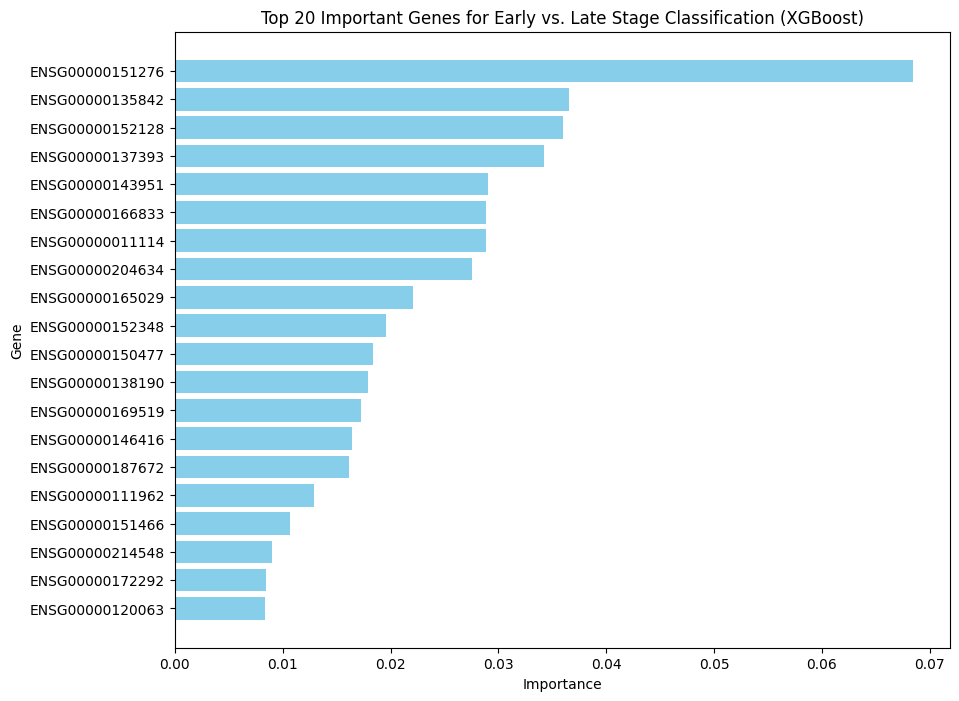


Top 20 Genes That Differentiate Between Early and Late Stages (XGBoost):
                Gene  Importance
482  ENSG00000151276    0.068430
108  ENSG00000135842    0.036553
3    ENSG00000152128    0.036029
172  ENSG00000137393    0.034190
435  ENSG00000143951    0.029008
59   ENSG00000166833    0.028865
433  ENSG00000011114    0.028810
286  ENSG00000204634    0.027559
481  ENSG00000165029    0.022097
381  ENSG00000152348    0.019586
431  ENSG00000150477    0.018420
442  ENSG00000138190    0.017904
470  ENSG00000169519    0.017291
278  ENSG00000146416    0.016430
92   ENSG00000187672    0.016187
282  ENSG00000111962    0.012911
220  ENSG00000151466    0.010690
245  ENSG00000214548    0.008981
355  ENSG00000172292    0.008485
340  ENSG00000120063    0.008395


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, roc_auc_score
import xgboost as xgb
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE

# Step 1: Extract Metadata and Gene Expression Data
metadata_df = adata_mtg_filtered.obs

# Use gene expression matrix in sparse format to save memory
gene_expression_sparse = adata_mtg_filtered.X  # This is a sparse matrix

# Step 2: Convert Sparse Matrix to Dense Format
gene_expression_dense = gene_expression_sparse.toarray()

# Create DataFrame for Gene Expression Data
gene_expression_df = pd.DataFrame(gene_expression_dense, columns=adata_mtg_filtered.var_names)

# Step 3: Calculate Variance and Select Top 500 Genes
gene_variances = gene_expression_df.var(axis=0)
top_genes = gene_variances.nlargest(500).index
gene_expression_df_reduced = gene_expression_df[top_genes]

# Step 4: Combine Metadata and Gene Expression Data
combined_df = pd.concat([metadata_df.reset_index(drop=True), gene_expression_df_reduced.reset_index(drop=True)], axis=1)

# Step 5: Create Target Variable Based on Braak Stage
braak_condition = combined_df['Braak stage'].isin(['Braak 0', 'Braak II', 'Braak III'])
combined_df['neuro_role'] = np.where(braak_condition, 'early', 'late')
combined_df = combined_df[combined_df['Braak stage'] != 'Reference']  # Remove 'Reference' values
combined_df['neuro_role_encoded'] = combined_df['neuro_role'].map({'early': 0, 'late': 1})

# Step 6: Prepare Features (X) and Target (y)
X = gene_expression_df_reduced.loc[combined_df.index]  # Only use gene expression data for feature selection
y = combined_df['neuro_role_encoded']

# Step 7: Handle Class Imbalance with SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Step 8: Split Data into Training and Testing Sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Step 9: Train a Logistic Regression Model
logistic_model = LogisticRegression(max_iter=1000, random_state=42)
logistic_model.fit(X_train, y_train)

# Step 10: Evaluate Logistic Regression Model Performance
y_pred_logistic = logistic_model.predict(X_test)
print("Logistic Regression Classification Report:")
print(classification_report(y_test, y_pred_logistic))
roc_auc_logistic = roc_auc_score(y_test, y_pred_logistic)
print(f"Logistic Regression ROC AUC Score: {roc_auc_logistic:.2f}")

# Step 11: Train an XGBoost Model
xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
xgb_model.fit(X_train, y_train)

# Step 12: Evaluate XGBoost Model Performance
y_pred_xgb = xgb_model.predict(X_test)
print("XGBoost Classification Report:")
print(classification_report(y_test, y_pred_xgb))
roc_auc_xgb = roc_auc_score(y_test, y_pred_xgb)
print(f"XGBoost ROC AUC Score: {roc_auc_xgb:.2f}")

# Step 13: Extract Feature Importances from XGBoost
feature_importances_xgb = xgb_model.feature_importances_
feature_importance_df_xgb = pd.DataFrame({'Gene': X.columns, 'Importance': feature_importances_xgb})
feature_importance_df_xgb = feature_importance_df_xgb.sort_values(by='Importance', ascending=False)

# Step 14: Plot the Top 20 Most Important Genes from XGBoost
plt.figure(figsize=(10, 8))
plt.barh(feature_importance_df_xgb['Gene'][:20], feature_importance_df_xgb['Importance'][:20], color='skyblue')
plt.gca().invert_yaxis()
plt.xlabel('Importance')
plt.ylabel('Gene')
plt.title('Top 20 Important Genes for Early vs. Late Stage Classification (XGBoost)')
plt.show()

# Step 15: Display Top Genes from XGBoost
print("\nTop 20 Genes That Differentiate Between Early and Late Stages (XGBoost):")
print(feature_importance_df_xgb.head(20))


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, roc_auc_score
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE

# Step 1: Extract Metadata and Gene Expression Data
metadata_df = adata_mtg_filtered.obs

# Use gene expression matrix in sparse format to save memory
gene_expression_sparse = adata_mtg_filtered.X  # This is a sparse matrix

# Step 2: Convert Sparse Matrix to Dense Format
gene_expression_dense = gene_expression_sparse.toarray()

# Create DataFrame for Gene Expression Data
gene_expression_df = pd.DataFrame(gene_expression_dense, columns=adata_mtg_filtered.var_names)

# Step 3: Calculate Variance and Select Top 500 Genes
gene_variances = gene_expression_df.var(axis=0)
top_genes = gene_variances.nlargest(500).index
gene_expression_df_reduced = gene_expression_df[top_genes]

# Step 4: Combine Metadata and Gene Expression Data
combined_df = pd.concat([metadata_df.reset_index(drop=True), gene_expression_df_reduced.reset_index(drop=True)], axis=1)

# Step 5: Create Target Variable Based on Braak Stage
braak_condition = combined_df['Braak stage'].isin(['Braak 0', 'Braak II', 'Braak III'])
combined_df['neuro_role'] = np.where(braak_condition, 'early', 'late')
combined_df = combined_df[combined_df['Braak stage'] != 'Reference']  # Remove 'Reference' values
combined_df['neuro_role_encoded'] = combined_df['neuro_role'].map({'early': 0, 'late': 1})

# Step 6: Prepare Features (X) and Target (y)
X = gene_expression_df_reduced.loc[combined_df.index]  # Only use gene expression data for feature selection
y = combined_df['neuro_role_encoded']

# Step 7: Split Data into Training and Testing Sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 1. Logistic Regression
from sklearn.linear_model import LogisticRegression

print("\nLogistic Regression Model:\n")
logistic_model = LogisticRegression(max_iter=1000, random_state=42, class_weight='balanced')
logistic_model.fit(X_train, y_train)
y_pred_logistic = logistic_model.predict(X_test)
roc_auc_logistic = roc_auc_score(y_test, logistic_model.predict_proba(X_test)[:, 1])
print("Classification Report:")
print(classification_report(y_test, y_pred_logistic))
print(f"ROC AUC Score: {roc_auc_logistic:.2f}")

# 2. Random Forest Without Balanced Data
from sklearn.ensemble import RandomForestClassifier

print("\nRandom Forest Without Balanced Data:\n")
rf_model_no_balance = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model_no_balance.fit(X_train, y_train)
y_pred_rf_no_balance = rf_model_no_balance.predict(X_test)
roc_auc_rf_no_balance = roc_auc_score(y_test, rf_model_no_balance.predict_proba(X_test)[:, 1])
print("Classification Report:")
print(classification_report(y_test, y_pred_rf_no_balance))
print(f"ROC AUC Score: {roc_auc_rf_no_balance:.2f}")

# 3. Random Forest with Optimization and Class Balancing
print("\nRandom Forest with Optimization and Class Balancing:\n")
rf_model_optimized = RandomForestClassifier(n_estimators=200, max_depth=10, random_state=42, class_weight='balanced')
rf_model_optimized.fit(X_train, y_train)
y_pred_rf_optimized = rf_model_optimized.predict(X_test)
roc_auc_rf_optimized = roc_auc_score(y_test, rf_model_optimized.predict_proba(X_test)[:, 1])
print("Classification Report:")
print(classification_report(y_test, y_pred_rf_optimized))
print(f"ROC AUC Score: {roc_auc_rf_optimized:.2f}")

# 4. XGBoost
import xgboost as xgb

print("\nXGBoost Model:\n")
xgb_model = xgb.XGBClassifier(n_estimators=200, max_depth=10, random_state=42, use_label_encoder=False, eval_metric='logloss')
xgb_model.fit(X_train, y_train)
y_pred_xgb = xgb_model.predict(X_test)
roc_auc_xgb = roc_auc_score(y_test, xgb_model.predict_proba(X_test)[:, 1])
print("Classification Report:")
print(classification_report(y_test, y_pred_xgb))
print(f"ROC AUC Score: {roc_auc_xgb:.2f}")



Logistic Regression Model:

Classification Report:
              precision    recall  f1-score   support

           0       0.35      0.73      0.48      1212
           1       0.94      0.75      0.83      6533

    accuracy                           0.75      7745
   macro avg       0.65      0.74      0.66      7745
weighted avg       0.85      0.75      0.78      7745

ROC AUC Score: 0.81

Random Forest Without Balanced Data:

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.07      0.12      1212
           1       0.85      1.00      0.92      6533

    accuracy                           0.85      7745
   macro avg       0.91      0.53      0.52      7745
weighted avg       0.87      0.85      0.80      7745

ROC AUC Score: 0.76

Random Forest with Optimization and Class Balancing:

Classification Report:
              precision    recall  f1-score   support

           0       0.56      0.39      0.46      1212
     

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [10:51:49] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.34      0.49      1212
           1       0.89      0.99      0.94      6533

    accuracy                           0.89      7745
   macro avg       0.89      0.67      0.71      7745
weighted avg       0.89      0.89      0.87      7745

ROC AUC Score: 0.89


Random Forest with SMOTE - Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.83      0.91      6546
           1       0.86      0.99      0.92      6528

    accuracy                           0.91     13074
   macro avg       0.92      0.91      0.91     13074
weighted avg       0.92      0.91      0.91     13074


Logistic Regression with SMOTE - Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.83      0.82      6546
           1       0.82      0.80      0.81      6528

    accuracy                           0.82     13074
   macro avg       0.82      0.82      0.82     13074
weighted avg       0.82      0.82      0.82     13074

Logistic Regression ROC AUC Score: 0.89


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [10:58:24] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



XGBoost with SMOTE - Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.89      0.94      6546
           1       0.90      0.99      0.95      6528

    accuracy                           0.94     13074
   macro avg       0.95      0.94      0.94     13074
weighted avg       0.95      0.94      0.94     13074

XGBoost ROC AUC Score: 0.99


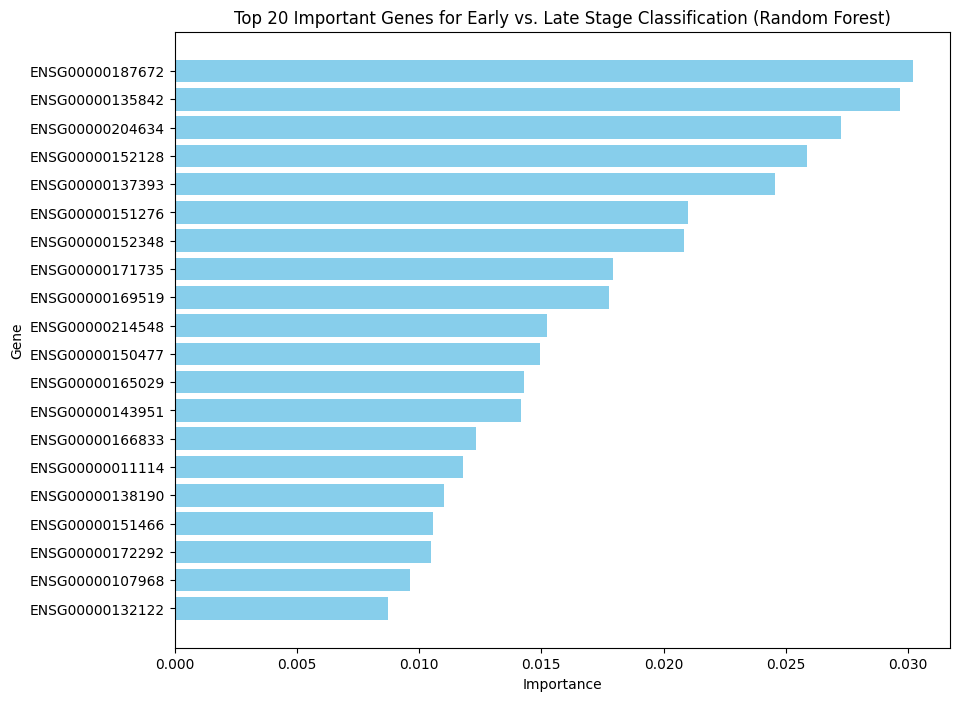


Top 20 Genes That Differentiate Between Early and Late Stages (Random Forest):
                Gene  Importance
92   ENSG00000187672    0.030201
108  ENSG00000135842    0.029677
286  ENSG00000204634    0.027278
3    ENSG00000152128    0.025869
172  ENSG00000137393    0.024546
482  ENSG00000151276    0.020987
381  ENSG00000152348    0.020847
440  ENSG00000171735    0.017916
470  ENSG00000169519    0.017750
245  ENSG00000214548    0.015224
431  ENSG00000150477    0.014952
481  ENSG00000165029    0.014270
435  ENSG00000143951    0.014170
59   ENSG00000166833    0.012312
433  ENSG00000011114    0.011777
442  ENSG00000138190    0.010996
220  ENSG00000151466    0.010569
355  ENSG00000172292    0.010499
484  ENSG00000107968    0.009610
62   ENSG00000132122    0.008733


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from imblearn.over_sampling import SMOTE
import xgboost as xgb
import matplotlib.pyplot as plt

# Step 1: Extract Metadata and Gene Expression Data
metadata_df = adata_mtg_filtered.obs

# Use gene expression matrix in sparse format to save memory
gene_expression_sparse = adata_mtg_filtered.X  # This is a sparse matrix

# Step 2: Convert Sparse Matrix to Dense Format
gene_expression_dense = gene_expression_sparse.toarray()

# Create DataFrame for Gene Expression Data
gene_expression_df = pd.DataFrame(gene_expression_dense, columns=adata_mtg_filtered.var_names)

# Step 3: Calculate Variance and Select Top 500 Genes
gene_variances = gene_expression_df.var(axis=0)
top_genes = gene_variances.nlargest(500).index
gene_expression_df_reduced = gene_expression_df[top_genes]

# Step 4: Combine Metadata and Gene Expression Data
combined_df = pd.concat([metadata_df.reset_index(drop=True), gene_expression_df_reduced.reset_index(drop=True)], axis=1)

# Step 5: Create Target Variable Based on Braak Stage
braak_condition = combined_df['Braak stage'].isin(['Braak 0', 'Braak II', 'Braak III'])
combined_df['neuro_role'] = np.where(braak_condition, 'early', 'late')
combined_df = combined_df[combined_df['Braak stage'] != 'Reference']  # Remove 'Reference' values
combined_df['neuro_role_encoded'] = combined_df['neuro_role'].map({'early': 0, 'late': 1})

# Step 6: Prepare Features (X) and Target (y)
X = gene_expression_df_reduced.loc[combined_df.index]  # Only use gene expression data for feature selection
y = combined_df['neuro_role_encoded']

# Step 7: Handle Class Imbalance with SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Step 8: Split Data into Training and Testing Sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Random Forest Classifier with SMOTE
model_rf_smote = RandomForestClassifier(n_estimators=200, random_state=42, max_depth=15, min_samples_split=5, class_weight='balanced')
model_rf_smote.fit(X_train, y_train)
y_pred_rf_smote = model_rf_smote.predict(X_test)
print("Random Forest with SMOTE - Classification Report:")
print(classification_report(y_test, y_pred_rf_smote))

# Logistic Regression with SMOTE
model_lr = LogisticRegression(random_state=42, max_iter=1000, class_weight='balanced')
model_lr.fit(X_train, y_train)
y_pred_lr = model_lr.predict(X_test)
print("\nLogistic Regression with SMOTE - Classification Report:")
print(classification_report(y_test, y_pred_lr))
roc_auc_lr = roc_auc_score(y_test, model_lr.predict_proba(X_test)[:, 1])
print(f"Logistic Regression ROC AUC Score: {roc_auc_lr:.2f}")

# XGBoost with SMOTE
model_xgb = xgb.XGBClassifier(n_estimators=200, learning_rate=0.1, max_depth=10, random_state=42, use_label_encoder=False, eval_metric='logloss')
model_xgb.fit(X_train, y_train)
y_pred_xgb = model_xgb.predict(X_test)
print("\nXGBoost with SMOTE - Classification Report:")
print(classification_report(y_test, y_pred_xgb))
roc_auc_xgb = roc_auc_score(y_test, model_xgb.predict_proba(X_test)[:, 1])
print(f"XGBoost ROC AUC Score: {roc_auc_xgb:.2f}")

# Feature Importance for Random Forest with SMOTE
feature_importances_rf = model_rf_smote.feature_importances_
feature_importance_df_rf = pd.DataFrame({'Gene': X.columns, 'Importance': feature_importances_rf})
feature_importance_df_rf = feature_importance_df_rf.sort_values(by='Importance', ascending=False)

# Plot the Top 20 Most Important Genes for Random Forest
plt.figure(figsize=(10, 8))
plt.barh(feature_importance_df_rf['Gene'][:20], feature_importance_df_rf['Importance'][:20], color='skyblue')
plt.gca().invert_yaxis()
plt.xlabel('Importance')
plt.ylabel('Gene')
plt.title('Top 20 Important Genes for Early vs. Late Stage Classification (Random Forest)')
plt.show()

# Display Top Genes for Random Forest
print("\nTop 20 Genes That Differentiate Between Early and Late Stages (Random Forest):")
print(feature_importance_df_rf.head(20))


<ipython-input-12-edb4ead0c325>:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  combined_df.loc[:, 'neuro_role_encoded'] = combined_df['neuro_role'].map({'early': 0, 'late': 1})



Logistic Regression without SMOTE:
              precision    recall  f1-score   support

           0       0.64      0.24      0.35      1212
           1       0.87      0.98      0.92      6533

    accuracy                           0.86      7745
   macro avg       0.76      0.61      0.63      7745
weighted avg       0.84      0.86      0.83      7745

AUC-ROC: 0.79

Logistic Regression with SMOTE:
              precision    recall  f1-score   support

           0       0.34      0.65      0.45      1212
           1       0.92      0.77      0.84      6533

    accuracy                           0.75      7745
   macro avg       0.63      0.71      0.64      7745
weighted avg       0.83      0.75      0.78      7745

AUC-ROC: 0.78

Random Forest without SMOTE:
              precision    recall  f1-score   support

           0       0.93      0.09      0.16      1212
           1       0.85      1.00      0.92      6533

    accuracy                           0.86      7745
 

/usr/local/lib/python3.10/dist-packages/xgboost/data.py:575: UserWarning: Sparse arrays from pandas are converted into dense.
  warnings.warn("Sparse arrays from pandas are converted into dense.")
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [12:48:04] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/data.py:575: UserWarning: Sparse arrays from pandas are converted into dense.
  warnings.warn("Sparse arrays from pandas are converted into dense.")
/usr/local/lib/python3.10/dist-packages/xgboost/data.py:575: UserWarning: Sparse arrays from pandas are converted into dense.
  warnings.warn("Sparse arrays from pandas are converted into dense.")
/usr/local/lib/python3.10/dist-packages/xgboost/data.py:575: UserWarning: Sparse arrays from pandas are converted into dense.
  warnings.warn("Sparse arrays from pandas are converted into dense.")



XGBoost without SMOTE:
              precision    recall  f1-score   support

           0       0.78      0.38      0.51      1212
           1       0.89      0.98      0.94      6533

    accuracy                           0.89      7745
   macro avg       0.84      0.68      0.72      7745
weighted avg       0.88      0.89      0.87      7745

AUC-ROC: 0.87


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [12:48:10] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/data.py:575: UserWarning: Sparse arrays from pandas are converted into dense.
  warnings.warn("Sparse arrays from pandas are converted into dense.")
/usr/local/lib/python3.10/dist-packages/xgboost/data.py:575: UserWarning: Sparse arrays from pandas are converted into dense.
  warnings.warn("Sparse arrays from pandas are converted into dense.")



XGBoost with SMOTE:
              precision    recall  f1-score   support

           0       0.73      0.44      0.55      1212
           1       0.90      0.97      0.94      6533

    accuracy                           0.89      7745
   macro avg       0.82      0.71      0.74      7745
weighted avg       0.88      0.89      0.88      7745

AUC-ROC: 0.87


/usr/local/lib/python3.10/dist-packages/xgboost/data.py:575: UserWarning: Sparse arrays from pandas are converted into dense.
  warnings.warn("Sparse arrays from pandas are converted into dense.")
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [12:48:35] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/data.py:575: UserWarning: Sparse arrays from pandas are converted into dense.
  warnings.warn("Sparse arrays from pandas are converted into dense.")
/usr/local/lib/python3.10/dist-packages/xgboost/data.py:575: UserWarning: Sparse arrays from pandas are converted into dense.
  warnings.warn("Sparse arrays from pandas are converted into dense.")



Optimized XGBoost with SMOTE:
              precision    recall  f1-score   support

           0       0.43      0.22      0.29      1212
           1       0.87      0.95      0.91      6533

    accuracy                           0.83      7745
   macro avg       0.65      0.58      0.60      7745
weighted avg       0.80      0.83      0.81      7745

AUC-ROC: 0.76

Model: Logistic Regression without SMOTE
Accuracy: 0.86
Precision (weighted avg): 0.84
Recall (weighted avg): 0.86
F1-Score (weighted avg): 0.83

Model: Logistic Regression with SMOTE
Accuracy: 0.75
Precision (weighted avg): 0.83
Recall (weighted avg): 0.75
F1-Score (weighted avg): 0.78

Model: Random Forest without SMOTE
Accuracy: 0.86
Precision (weighted avg): 0.87
Recall (weighted avg): 0.86
F1-Score (weighted avg): 0.80

Model: Random Forest with SMOTE
Accuracy: 0.85
Precision (weighted avg): 0.82
Recall (weighted avg): 0.85
F1-Score (weighted avg): 0.80

Model: Optimized Random Forest with SMOTE
Accuracy: 0.85
Prec

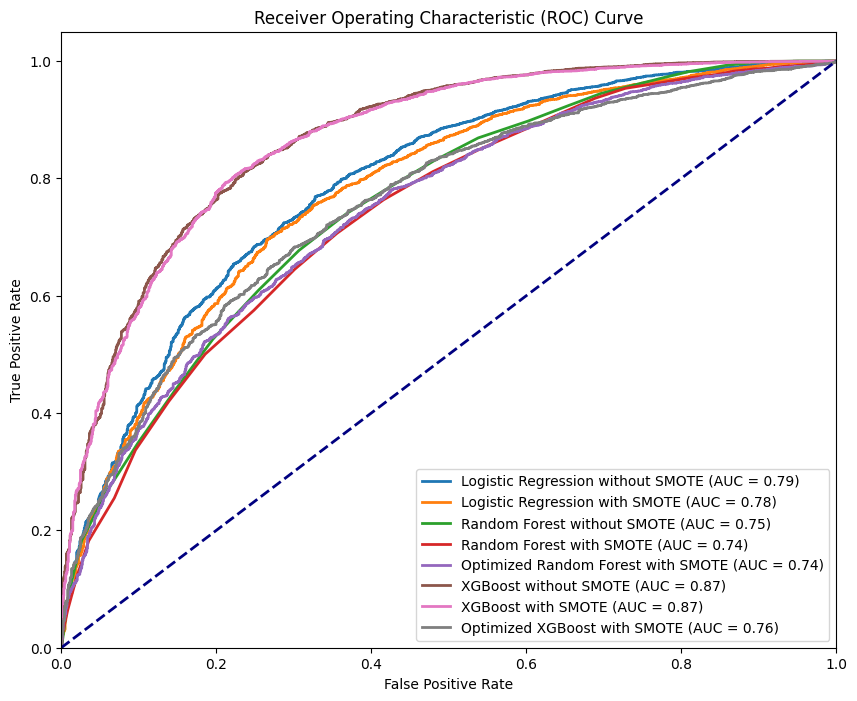

In [ ]:
# Required Libraries
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, auc
import xgboost as xgb
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Extract Metadata and Gene Expression Data
metadata_df = adata_mtg_filtered.obs

# Use gene expression matrix in sparse format to save memory
gene_expression_sparse = adata_mtg_filtered.X  # This is a sparse matrix

# Step 2: Convert Sparse Matrix to Dense Format
# Convert only the selected top genes to dense format to reduce memory usage
gene_expression_df = pd.DataFrame.sparse.from_spmatrix(gene_expression_sparse, columns=adata_mtg_filtered.var_names)

# Step 3: Calculate Variance and Select Top 300 Genes
# Convert sparse DataFrame to dense for variance calculation
gene_expression_dense_df = gene_expression_df.sparse.to_dense()
gene_variances = gene_expression_dense_df.var(axis=0)
top_genes = gene_variances.nlargest(300).index  # Reduced to 300 genes to limit memory usage
gene_expression_df_reduced = gene_expression_df[top_genes]

# Step 4: Combine Metadata and Gene Expression Data
combined_df = pd.concat([metadata_df.reset_index(drop=True), gene_expression_df_reduced.reset_index(drop=True)], axis=1)

# Step 5: Create Target Variable Based on Braak Stage
braak_condition = combined_df['Braak stage'].isin(['Braak 0', 'Braak II', 'Braak III'])
combined_df.loc[:, 'neuro_role'] = np.where(braak_condition, 'early', 'late')
combined_df = combined_df[combined_df['Braak stage'] != 'Reference']  # Remove 'Reference' values
combined_df.loc[:, 'neuro_role_encoded'] = combined_df['neuro_role'].map({'early': 0, 'late': 1})

# Step 6: Prepare Features (X) and Target (y)
X = gene_expression_df_reduced.loc[combined_df.index]  # Only use gene expression data for feature selection
y = combined_df['neuro_role_encoded']

# Step 7: Split Data into Training and Testing Sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# SMOTE for Handling Class Imbalance
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Logistic Regression Model
# Without SMOTE
log_reg = LogisticRegression(max_iter=200, random_state=42, n_jobs=-1)
log_reg.fit(X_train, y_train)
y_pred_log_reg = log_reg.predict(X_test)
y_prob_log_reg = log_reg.predict_proba(X_test)[:, 1]
print("\nLogistic Regression without SMOTE:")
print(classification_report(y_test, y_pred_log_reg))
log_reg_auc = roc_auc_score(y_test, y_prob_log_reg)
print(f"AUC-ROC: {log_reg_auc:.2f}")

# With SMOTE
log_reg_smote = LogisticRegression(max_iter=200, random_state=42, n_jobs=-1)
log_reg_smote.fit(X_train_smote, y_train_smote)
y_pred_log_reg_smote = log_reg_smote.predict(X_test)
y_prob_log_reg_smote = log_reg_smote.predict_proba(X_test)[:, 1]
print("\nLogistic Regression with SMOTE:")
print(classification_report(y_test, y_pred_log_reg_smote))
log_reg_smote_auc = roc_auc_score(y_test, y_prob_log_reg_smote)
print(f"AUC-ROC: {log_reg_smote_auc:.2f}")

# Random Forest Classifier without SMOTE
rf = RandomForestClassifier(n_estimators=50, random_state=42, n_jobs=-1)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)
y_prob_rf = rf.predict_proba(X_test)[:, 1]
print("\nRandom Forest without SMOTE:")
print(classification_report(y_test, y_pred_rf))
rf_auc = roc_auc_score(y_test, y_prob_rf)
print(f"AUC-ROC: {rf_auc:.2f}")

# Random Forest with SMOTE
rf_smote = RandomForestClassifier(n_estimators=50, random_state=42, n_jobs=-1)
rf_smote.fit(X_train_smote, y_train_smote)
y_pred_rf_smote = rf_smote.predict(X_test)
y_prob_rf_smote = rf_smote.predict_proba(X_test)[:, 1]
print("\nRandom Forest with SMOTE:")
print(classification_report(y_test, y_pred_rf_smote))
rf_smote_auc = roc_auc_score(y_test, y_prob_rf_smote)
print(f"AUC-ROC: {rf_smote_auc:.2f}")

# Random Forest with SMOTE and Hyperparameter Optimization
param_grid_rf = {
    'n_estimators': [50, 75],
    'max_depth': [10, 15],
    'min_samples_split': [2, 5]
}
grid_rf = RandomizedSearchCV(RandomForestClassifier(random_state=42, n_jobs=-1), param_grid_rf, cv=3, scoring='f1_weighted', n_jobs=-1, n_iter=2)
grid_rf.fit(X_train_smote, y_train_smote)
y_pred_rf_optimized = grid_rf.best_estimator_.predict(X_test)
y_prob_rf_optimized = grid_rf.best_estimator_.predict_proba(X_test)[:, 1]
print("\nOptimized Random Forest with SMOTE:")
print(classification_report(y_test, y_pred_rf_optimized))
rf_optimized_auc = roc_auc_score(y_test, y_prob_rf_optimized)
print(f"AUC-ROC: {rf_optimized_auc:.2f}")

# XGBoost Model without SMOTE
xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)
y_pred_xgb = xgb_model.predict(X_test)
y_prob_xgb = xgb_model.predict_proba(X_test)[:, 1]
print("\nXGBoost without SMOTE:")
print(classification_report(y_test, y_pred_xgb))
xgb_auc = roc_auc_score(y_test, y_prob_xgb)
print(f"AUC-ROC: {xgb_auc:.2f}")

# XGBoost with SMOTE
xgb_model_smote = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42, n_jobs=-1)
xgb_model_smote.fit(X_train_smote, y_train_smote)
y_pred_xgb_smote = xgb_model_smote.predict(X_test)
y_prob_xgb_smote = xgb_model_smote.predict_proba(X_test)[:, 1]
print("\nXGBoost with SMOTE:")
print(classification_report(y_test, y_pred_xgb_smote))
xgb_smote_auc = roc_auc_score(y_test, y_prob_xgb_smote)
print(f"AUC-ROC: {xgb_smote_auc:.2f}")

# Optimization for XGBoost Model
param_grid_xgb = {
    'n_estimators': [50, 75],
    'learning_rate': [0.01, 0.05],
    'max_depth': [3, 5]
}
grid_xgb = RandomizedSearchCV(xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42, n_jobs=-1),
                         param_grid_xgb, cv=3, scoring='f1_weighted', n_jobs=-1, n_iter=2)
grid_xgb.fit(X_train_smote, y_train_smote)
y_pred_xgb_optimized = grid_xgb.best_estimator_.predict(X_test)
y_prob_xgb_optimized = grid_xgb.best_estimator_.predict_proba(X_test)[:, 1]
print("\nOptimized XGBoost with SMOTE:")
print(classification_report(y_test, y_pred_xgb_optimized))
xgb_optimized_auc = roc_auc_score(y_test, y_prob_xgb_optimized)
print(f"AUC-ROC: {xgb_optimized_auc:.2f}")

# Print the performance metrics for later comparison
model_results = {
    'Logistic Regression without SMOTE': classification_report(y_test, y_pred_log_reg, output_dict=True),
    'Logistic Regression with SMOTE': classification_report(y_test, y_pred_log_reg_smote, output_dict=True),
    'Random Forest without SMOTE': classification_report(y_test, y_pred_rf, output_dict=True),
    'Random Forest with SMOTE': classification_report(y_test, y_pred_rf_smote, output_dict=True),
    'Optimized Random Forest with SMOTE': classification_report(y_test, y_pred_rf_optimized, output_dict=True),
    'XGBoost without SMOTE': classification_report(y_test, y_pred_xgb, output_dict=True),
    'XGBoost with SMOTE': classification_report(y_test, y_pred_xgb_smote, output_dict=True),
    'Optimized XGBoost with SMOTE': classification_report(y_test, y_pred_xgb_optimized, output_dict=True)
}

# Display summarized results
for model_name, metrics in model_results.items():
    print(f"\nModel: {model_name}")
    print(f"Accuracy: {metrics['accuracy']:.2f}")
    print(f"Precision (weighted avg): {metrics['weighted avg']['precision']:.2f}")
    print(f"Recall (weighted avg): {metrics['weighted avg']['recall']:.2f}")
    print(f"F1-Score (weighted avg): {metrics['weighted avg']['f1-score']:.2f}")

# Plot AUC-ROC Curve
plt.figure(figsize=(10, 8))
models = [
    ("Logistic Regression without SMOTE", y_prob_log_reg),
    ("Logistic Regression with SMOTE", y_prob_log_reg_smote),
    ("Random Forest without SMOTE", y_prob_rf),
    ("Random Forest with SMOTE", y_prob_rf_smote),
    ("Optimized Random Forest with SMOTE", y_prob_rf_optimized),
    ("XGBoost without SMOTE", y_prob_xgb),
    ("XGBoost with SMOTE", y_prob_xgb_smote),
    ("Optimized XGBoost with SMOTE", y_prob_xgb_optimized)
]

for model_name, y_prob in models:
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


In [ ]:
# Required Libraries
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, auc
import xgboost as xgb
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Extract Metadata and Gene Expression Data
metadata_df = adata_mtg_filtered.obs

# Use gene expression matrix in sparse format to save memory
gene_expression_sparse = adata_mtg_filtered.X  # This is a sparse matrix

# Step 2: Convert Sparse Matrix to Dense Format
# Convert only the selected top genes to dense format to reduce memory usage
gene_expression_df = pd.DataFrame.sparse.from_spmatrix(gene_expression_sparse, columns=adata_mtg_filtered.var_names)

# Step 3: Calculate Variance and Select Top 300 Genes
# Convert sparse DataFrame to dense for variance calculation
gene_expression_dense_df = gene_expression_df.sparse.to_dense()
gene_variances = gene_expression_dense_df.var(axis=0)
top_genes = gene_variances.nlargest(300).index  # Reduced to 300 genes to limit memory usage
gene_expression_df_reduced = gene_expression_df[top_genes]

# Step 4: Combine Metadata and Gene Expression Data
combined_df = pd.concat([metadata_df.reset_index(drop=True), gene_expression_df_reduced.reset_index(drop=True)], axis=1)

# Step 5: Create Target Variable Based on Braak Stage
braak_condition = combined_df['Braak stage'].isin(['Braak 0', 'Braak II', 'Braak III'])
combined_df.loc[:, 'neuro_role'] = np.where(braak_condition, 'early', 'late')
combined_df = combined_df[combined_df['Braak stage'] != 'Reference']  # Remove 'Reference' values
combined_df['neuro_role_encoded'] = combined_df['neuro_role'].map({'early': 0, 'late': 1}).copy()

# Step 6: Prepare Features (X) and Target (y)
X = gene_expression_df_reduced.loc[combined_df.index]  # Only use gene expression data for feature selection
y = combined_df['neuro_role_encoded']

# Step 7: Split Data into Training and Testing Sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Models without SMOTE
# Logistic Regression
log_reg = LogisticRegression(max_iter=200, random_state=42, n_jobs=-1)
log_reg.fit(X_train, y_train)
y_pred_log_reg = log_reg.predict(X_test)
y_prob_log_reg = log_reg.predict_proba(X_test)[:, 1]
print("\nLogistic Regression without SMOTE:")
print(classification_report(y_test, y_pred_log_reg))
log_reg_auc = roc_auc_score(y_test, y_prob_log_reg)
print(f"AUC-ROC: {log_reg_auc:.2f}")

# Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)
y_prob_rf = rf.predict_proba(X_test)[:, 1]
print("\nRandom Forest without SMOTE:")
print(classification_report(y_test, y_pred_rf))
rf_auc = roc_auc_score(y_test, y_prob_rf)
print(f"AUC-ROC: {rf_auc:.2f}")

# XGBoost
xgb_model = xgb.XGBClassifier(eval_metric='logloss', random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)
y_pred_xgb = xgb_model.predict(X_test)
y_prob_xgb = xgb_model.predict_proba(X_test)[:, 1]
print("\nXGBoost without SMOTE:")
print(classification_report(y_test, y_pred_xgb))
xgb_auc = roc_auc_score(y_test, y_prob_xgb)
print(f"AUC-ROC: {xgb_auc:.2f}")

# Apply SMOTE for Handling Class Imbalance
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Optimized Logistic Regression with SMOTE
param_grid_log_reg = {
    'C': [0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2', 'elasticnet'],
    'solver': ['liblinear', 'saga']
}
grid_log_reg = RandomizedSearchCV(LogisticRegression(random_state=42, max_iter=200, n_jobs=-1), param_grid_log_reg, cv=5, scoring='f1_weighted', n_jobs=-1, n_iter=20, random_state=42)
grid_log_reg.fit(X_train_smote, y_train_smote)
y_pred_log_reg_optimized = grid_log_reg.best_estimator_.predict(X_test)
y_prob_log_reg_optimized = grid_log_reg.best_estimator_.predict_proba(X_test)[:, 1]
print("\nOptimized Logistic Regression with SMOTE:")
print(classification_report(y_test, y_pred_log_reg_optimized))
log_reg_optimized_auc = roc_auc_score(y_test, y_prob_log_reg_optimized)
print(f"AUC-ROC: {log_reg_optimized_auc:.2f}")

# Optimized Random Forest with SMOTE
param_grid_rf = {
    'n_estimators': [100, 200, 300, 400],
    'max_depth': [10, 20, 30, 40],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}
grid_rf = RandomizedSearchCV(RandomForestClassifier(random_state=42, n_jobs=-1), param_grid_rf, cv=5, scoring='f1_weighted', n_jobs=-1, n_iter=20, random_state=42)
grid_rf.fit(X_train_smote, y_train_smote)
y_pred_rf_optimized = grid_rf.best_estimator_.predict(X_test)
y_prob_rf_optimized = grid_rf.best_estimator_.predict_proba(X_test)[:, 1]
print("\nOptimized Random Forest with SMOTE:")
print(classification_report(y_test, y_pred_rf_optimized))
rf_optimized_auc = roc_auc_score(y_test, y_prob_rf_optimized)
print(f"AUC-ROC: {rf_optimized_auc:.2f}")

# Optimized XGBoost with SMOTE
param_grid_xgb = {
    'n_estimators': [100, 200, 300, 400],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7, 10],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0]
}
grid_xgb = RandomizedSearchCV(xgb.XGBClassifier(eval_metric='logloss', random_state=42, n_jobs=-1), param_grid_xgb, cv=5, scoring='f1_weighted', n_jobs=-1, n_iter=20, random_state=42)
grid_xgb.fit(X_train_smote, y_train_smote)
y_pred_xgb_optimized = grid_xgb.best_estimator_.predict(X_test)
y_prob_xgb_optimized = grid_xgb.best_estimator_.predict_proba(X_test)[:, 1]
print("\nOptimized XGBoost with SMOTE:")
print(classification_report(y_test, y_pred_xgb_optimized))
xgb_optimized_auc = roc_auc_score(y_test, y_prob_xgb_optimized)
print(f"AUC-ROC: {xgb_optimized_auc:.2f}")

# Print the performance metrics for later comparison
model_results = {
    'Logistic Regression without SMOTE': classification_report(y_test, y_pred_log_reg, output_dict=True),
    'Random Forest without SMOTE': classification_report(y_test, y_pred_rf, output_dict=True),
    'XGBoost without SMOTE': classification_report(y_test, y_pred_xgb, output_dict=True),
    'Optimized Logistic Regression with SMOTE': classification_report(y_test, y_pred_log_reg_optimized, output_dict=True),
    'Optimized Random Forest with SMOTE': classification_report(y_test, y_pred_rf_optimized, output_dict=True),
    'Optimized XGBoost with SMOTE': classification_report(y_test, y_pred_xgb_optimized, output_dict=True)
}

# Display summarized results
for model_name, metrics in model_results.items():
    print(f"\nModel: {model_name}")
    print(f"Accuracy: {metrics['accuracy']:.2f}")
    print(f"Precision (weighted avg): {metrics['weighted avg']['precision']:.2f}")
    print(f"Recall (weighted avg): {metrics['weighted avg']['recall']:.2f}")
    print(f"F1-Score (weighted avg): {metrics['weighted avg']['f1-score']:.2f}")

# Plot AUC-ROC Curve
plt.figure(figsize=(10, 8))
models = [
    ("Logistic Regression without SMOTE", y_prob_log_reg),
    ("Random Forest without SMOTE", y_prob_rf),
    ("XGBoost without SMOTE", y_prob_xgb),
    ("Optimized Logistic Regression with SMOTE", y_prob_log_reg_optimized),
    ("Optimized Random Forest with SMOTE", y_prob_rf_optimized),
    ("Optimized XGBoost with SMOTE", y_prob_xgb_optimized)
]

for model_name, y_prob in models:
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


<ipython-input-10-97360effe054>:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  combined_df['neuro_role_encoded'] = combined_df['neuro_role'].map({'early': 0, 'late': 1}).copy()



Logistic Regression without SMOTE:
              precision    recall  f1-score   support

           0       0.64      0.24      0.35      1212
           1       0.87      0.98      0.92      6533

    accuracy                           0.86      7745
   macro avg       0.76      0.61      0.63      7745
weighted avg       0.84      0.86      0.83      7745

AUC-ROC: 0.79

Random Forest without SMOTE:
              precision    recall  f1-score   support

           0       0.96      0.08      0.14      1212
           1       0.85      1.00      0.92      6533

    accuracy                           0.85      7745
   macro avg       0.91      0.54      0.53      7745
weighted avg       0.87      0.85      0.80      7745

AUC-ROC: 0.78


/usr/local/lib/python3.10/dist-packages/xgboost/data.py:575: UserWarning: Sparse arrays from pandas are converted into dense.
  warnings.warn("Sparse arrays from pandas are converted into dense.")
/usr/local/lib/python3.10/dist-packages/xgboost/data.py:575: UserWarning: Sparse arrays from pandas are converted into dense.
  warnings.warn("Sparse arrays from pandas are converted into dense.")
/usr/local/lib/python3.10/dist-packages/xgboost/data.py:575: UserWarning: Sparse arrays from pandas are converted into dense.
  warnings.warn("Sparse arrays from pandas are converted into dense.")



XGBoost without SMOTE:
              precision    recall  f1-score   support

           0       0.78      0.38      0.51      1212
           1       0.89      0.98      0.94      6533

    accuracy                           0.89      7745
   macro avg       0.84      0.68      0.72      7745
weighted avg       0.88      0.89      0.87      7745

AUC-ROC: 0.87


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
40 fits failed out of a total of 100.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
20 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", l


Optimized Logistic Regression with SMOTE:
              precision    recall  f1-score   support

           0       0.34      0.66      0.45      1212
           1       0.92      0.77      0.84      6533

    accuracy                           0.75      7745
   macro avg       0.63      0.71      0.64      7745
weighted avg       0.83      0.75      0.78      7745

AUC-ROC: 0.78


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(



Optimized Random Forest with SMOTE:
              precision    recall  f1-score   support

           0       0.64      0.09      0.15      1212
           1       0.85      0.99      0.92      6533

    accuracy                           0.85      7745
   macro avg       0.75      0.54      0.53      7745
weighted avg       0.82      0.85      0.80      7745

AUC-ROC: 0.78


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


# ML Model

In [ ]:
# Step 1: Load and Filter the Dataset
adata = adata_mtg_filtered  # Assuming 'adata_mtg_filtered' is pre-loaded with the necessary data

# Step 2: Select highly variable genes (feature selection)
sc.pp.highly_variable_genes(adata, n_top_genes=300)
adata = adata[:, adata.var['highly_variable']]

# Step 3: Define early and late stage groups based on Braak stages (excluding 'Reference')
adata = adata[adata.obs['Braak stage'] != 'Reference'].copy()
adata.obs['Stage'] = adata.obs['Braak stage'].apply(lambda x: 0 if x in ['Braak 0', 'Braak II', 'Braak III'] else 1)  # 0 = Early, 1 = Late

# Step 4: Split data for APOE4 carriers and non-carriers
carriers = adata[adata.obs['APOE4 status'] == 'Y']
non_carriers = adata[adata.obs['APOE4 status'] == 'N']

# Step 5: Prepare data and labels for classification
def prepare_data(adata):
    X = adata.X.toarray()  # Assuming sparse matrix format, convert to dense if needed
    y = adata.obs['Stage'].values
    return X, y

X_carriers, y_carriers = prepare_data(carriers)
X_non_carriers, y_non_carriers = prepare_data(non_carriers)

# Step 6: Train-Test Split (Without Optimization)
X_train_carriers, X_test_carriers, y_train_carriers, y_test_carriers = train_test_split(X_carriers, y_carriers, test_size=0.3, random_state=42)
X_train_non_carriers, X_test_non_carriers, y_train_non_carriers, y_test_non_carriers = train_test_split(X_non_carriers, y_non_carriers, test_size=0.3, random_state=42)

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import classification_report

# Step 7: Train and Evaluate Multiple Machine Learning Models (Raw Model without Optimization)
def train_evaluate_models(X_train, X_test, y_train, y_test, label, model_type="Raw Model"):
    models = {
        'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced'),
        'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42, class_weight='balanced'),
        'Gradient Boosting': GradientBoostingClassifier(n_estimators=100, random_state=42),
        'XGBoost': XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=5, use_label_encoder=False, eval_metric='logloss', random_state=42)
    }

    for model_name, model in models.items():
        print(f"\nTraining {model_name} for {label} - {model_type}...")
        model.fit(X_train, y_train)

        # Predictions and Evaluation
        y_pred = model.predict(X_test)
        print(f"\nClassification Report for {model_name} - {label} ({model_type}):")
        print(classification_report(y_test, y_pred))

        # Feature importance (if applicable)
        if hasattr(model, 'feature_importances_'):
            feature_importances = model.feature_importances_
            important_genes = np.array(adata.var_names)[np.argsort(feature_importances)[-10:]]  # Top 10 genes
            print(f"Top genes associated with stage progression for {model_name} - {label} ({model_type}):")
            print(important_genes)

            # Plot feature importance for top genes
            plt.figure(figsize=(10, 6))
            sns.barplot(x=important_genes, y=feature_importances[np.argsort(feature_importances)[-10:]])
            plt.xticks(rotation=45, ha='right')
            plt.xlabel("Gene")
            plt.ylabel("Importance Score")
            plt.title(f"Top 10 Genes for {model_name} - {label} ({model_type}) Differentiating Early vs. Late Stages")
            plt.show()

# Step 8: Run Raw Models for both APOE4 carriers and non-carriers
train_evaluate_models(X_train_carriers, X_test_carriers, y_train_carriers, y_test_carriers, "APOE4 Carriers", model_type="Raw Model")
train_evaluate_models(X_train_non_carriers, X_test_non_carriers, y_train_non_carriers, y_test_non_carriers, "APOE4 Non-Carriers", model_type="Raw Model")

# Step 9: Address Class Imbalance Using SMOTE (Optimization)
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_carriers_resampled, y_carriers_resampled = smote.fit_resample(X_carriers, y_carriers)
X_non_carriers_resampled, y_non_carriers_resampled = smote.fit_resample(X_non_carriers, y_non_carriers)

# Step 10: Train-Test Split (With SMOTE)
X_train_carriers_smote, X_test_carriers_smote, y_train_carriers_smote, y_test_carriers_smote = train_test_split(X_carriers_resampled, y_carriers_resampled, test_size=0.3, random_state=42)
X_train_non_carriers_smote, X_test_non_carriers_smote, y_train_non_carriers_smote, y_test_non_carriers_smote = train_test_split(X_non_carriers_resampled, y_non_carriers_resampled, test_size=0.3, random_state=42)

# Step 11: Run Models with SMOTE for both APOE4 carriers and non-carriers
train_evaluate_models(X_train_carriers_smote, X_test_carriers_smote, y_train_carriers_smote, y_test_carriers_smote, "APOE4 Carriers", model_type="SMOTE Optimized")
train_evaluate_models(X_train_non_carriers_smote, X_test_non_carriers_smote, y_train_non_carriers_smote, y_test_non_carriers_smote, "APOE4 Non-Carriers", model_type="SMOTE Optimized")

# Step 12: Clustering Analysis to Identify Subpopulations
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering

# Apply PCA for dimensionality reduction
pca = PCA(n_components=2)
X_pca = pca.fit_transform(adata.X.toarray())

# Apply K-means clustering
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans_labels = kmeans.fit_predict(X_pca)

# Plot the clustering results
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=kmeans_labels, palette='viridis', s=50)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('K-means Clustering of Microglial Cells')
plt.show()

# Apply Agglomerative Clustering
agg_clustering = AgglomerativeClustering(n_clusters=3)
agg_labels = agg_clustering.fit_predict(X_pca)

# Plot the Agglomerative Clustering results
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=agg_labels, palette='coolwarm', s=50)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('Agglomerative Clustering of Microglial Cells')
plt.show()



Training Random Forest for APOE4 Carriers - Raw Model...

Classification Report for Random Forest - APOE4 Carriers (Raw Model):
              precision    recall  f1-score   support

           0       1.00      0.01      0.02       207
           1       0.94      1.00      0.97      3230

    accuracy                           0.94      3437
   macro avg       0.97      0.50      0.49      3437
weighted avg       0.94      0.94      0.91      3437

AUC-ROC for Random Forest - APOE4 Carriers (Raw Model): 0.91


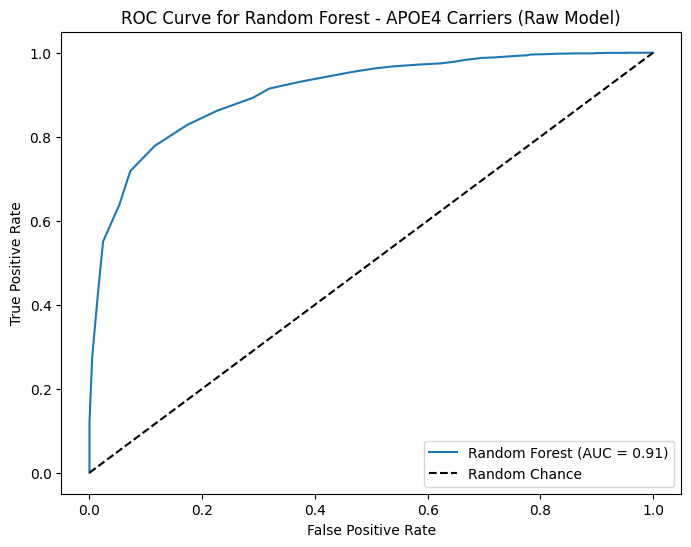

Top genes associated with stage progression for Random Forest - APOE4 Carriers (Raw Model):
['ENSG00000198763' 'ENSG00000198899' 'ENSG00000122862' 'ENSG00000124491'
 'ENSG00000255274' 'ENSG00000285367' 'ENSG00000177575' 'ENSG00000198840'
 'ENSG00000166833' 'ENSG00000249738']


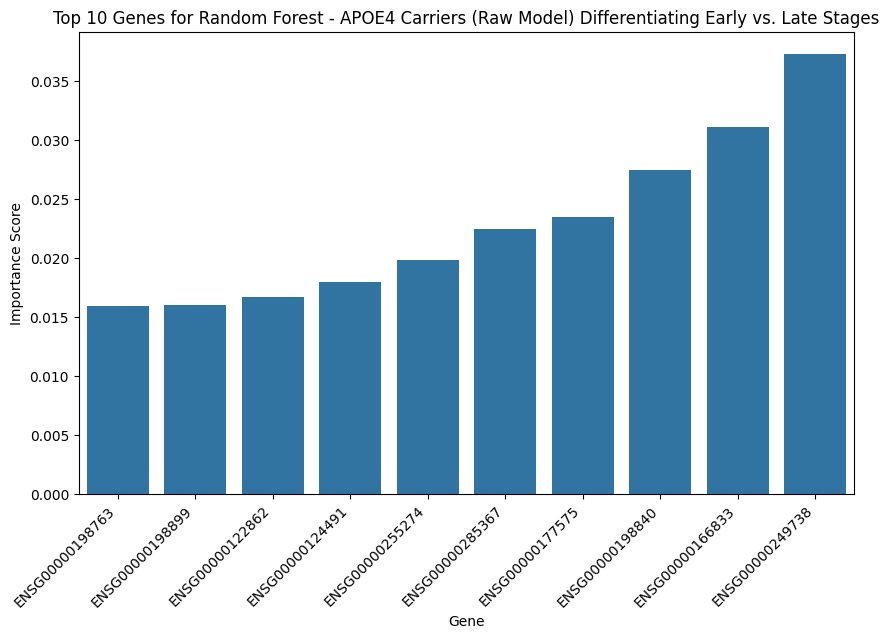


Training Logistic Regression for APOE4 Carriers - Raw Model...

Classification Report for Logistic Regression - APOE4 Carriers (Raw Model):
              precision    recall  f1-score   support

           0       0.24      0.81      0.37       207
           1       0.99      0.84      0.90      3230

    accuracy                           0.83      3437
   macro avg       0.61      0.82      0.64      3437
weighted avg       0.94      0.83      0.87      3437

AUC-ROC for Logistic Regression - APOE4 Carriers (Raw Model): 0.90


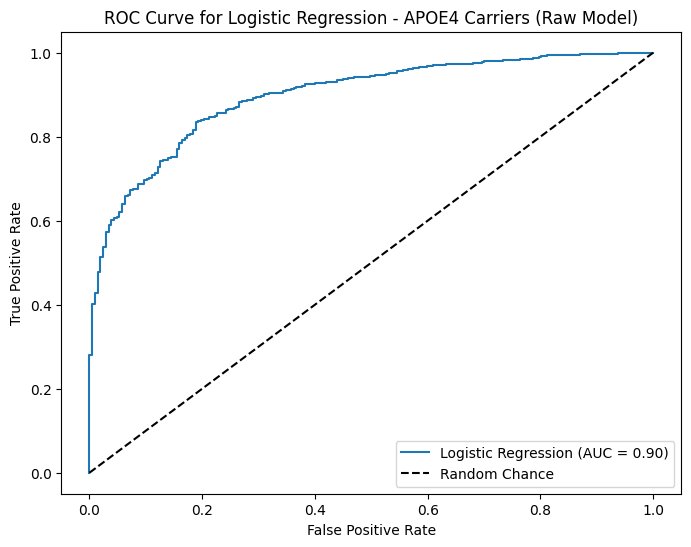


Training Gradient Boosting for APOE4 Carriers - Raw Model...

Classification Report for Gradient Boosting - APOE4 Carriers (Raw Model):
              precision    recall  f1-score   support

           0       0.73      0.11      0.19       207
           1       0.95      1.00      0.97      3230

    accuracy                           0.94      3437
   macro avg       0.84      0.55      0.58      3437
weighted avg       0.93      0.94      0.92      3437

AUC-ROC for Gradient Boosting - APOE4 Carriers (Raw Model): 0.89


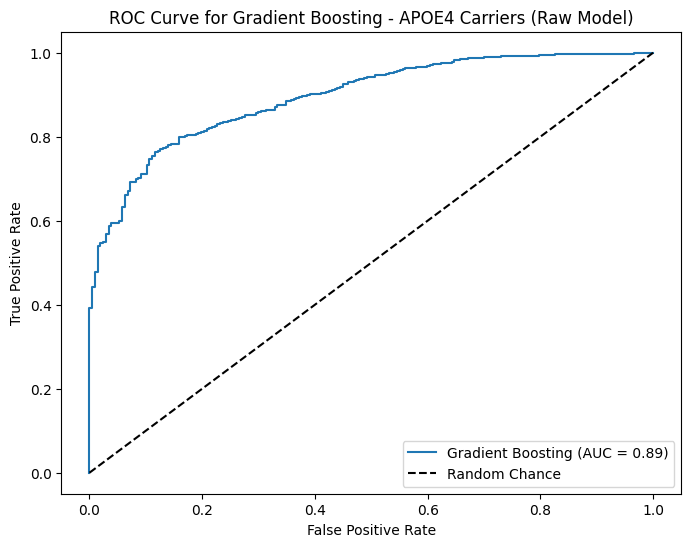

Top genes associated with stage progression for Gradient Boosting - APOE4 Carriers (Raw Model):
['ENSG00000271945' 'ENSG00000105697' 'ENSG00000152128' 'ENSG00000249738'
 'ENSG00000229807' 'ENSG00000231079' 'ENSG00000177575' 'ENSG00000285534'
 'ENSG00000124491' 'ENSG00000198840']


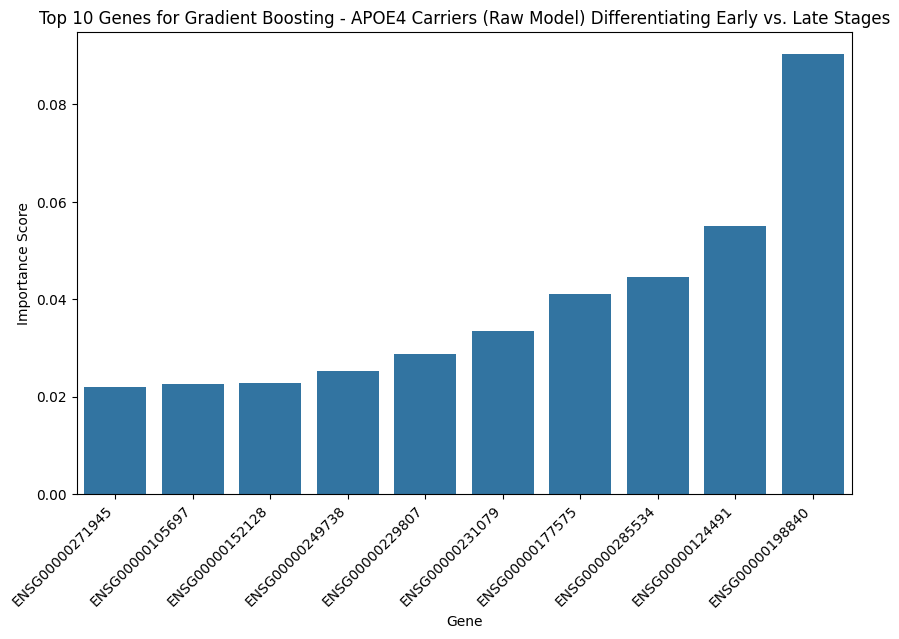


Training XGBoost for APOE4 Carriers - Raw Model...


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [17:15:23] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Classification Report for XGBoost - APOE4 Carriers (Raw Model):
              precision    recall  f1-score   support

           0       0.85      0.14      0.24       207
           1       0.95      1.00      0.97      3230

    accuracy                           0.95      3437
   macro avg       0.90      0.57      0.61      3437
weighted avg       0.94      0.95      0.93      3437

AUC-ROC for XGBoost - APOE4 Carriers (Raw Model): 0.93


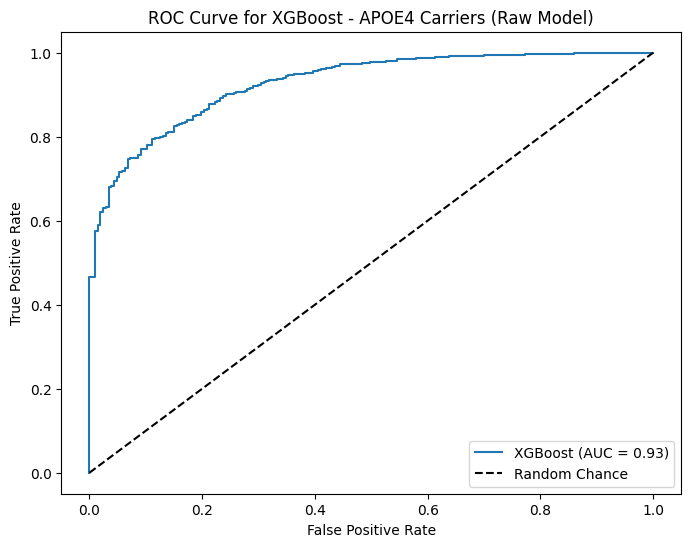

Top genes associated with stage progression for XGBoost - APOE4 Carriers (Raw Model):
['ENSG00000248874' 'ENSG00000177575' 'ENSG00000121966' 'ENSG00000285367'
 'ENSG00000166833' 'ENSG00000255274' 'ENSG00000137959' 'ENSG00000249738'
 'ENSG00000124491' 'ENSG00000198840']


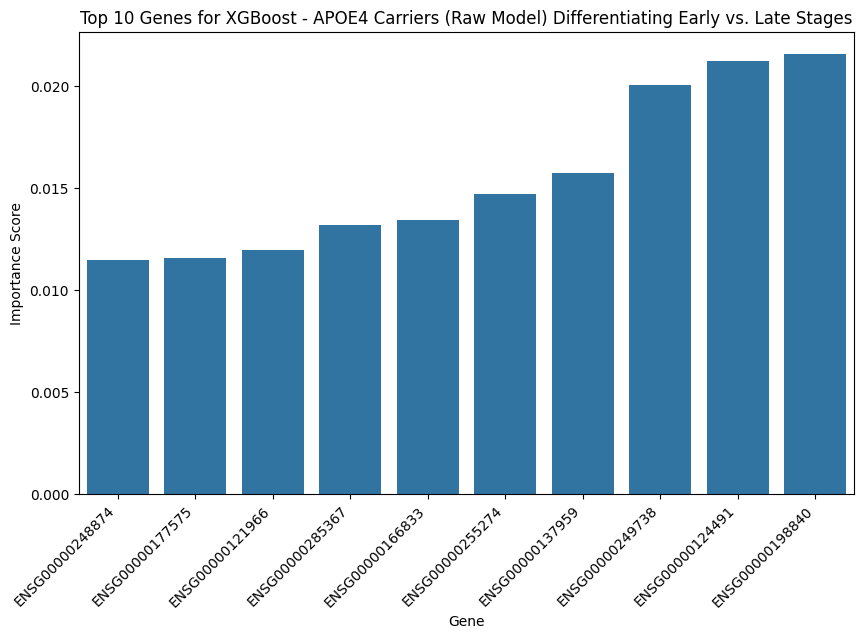


Training Random Forest for APOE4 Non-Carriers - Raw Model...

Classification Report for Random Forest - APOE4 Non-Carriers (Raw Model):
              precision    recall  f1-score   support

           0       0.95      0.23      0.38      1591
           1       0.84      1.00      0.91      6590

    accuracy                           0.85      8181
   macro avg       0.90      0.62      0.64      8181
weighted avg       0.86      0.85      0.81      8181

AUC-ROC for Random Forest - APOE4 Non-Carriers (Raw Model): 0.88


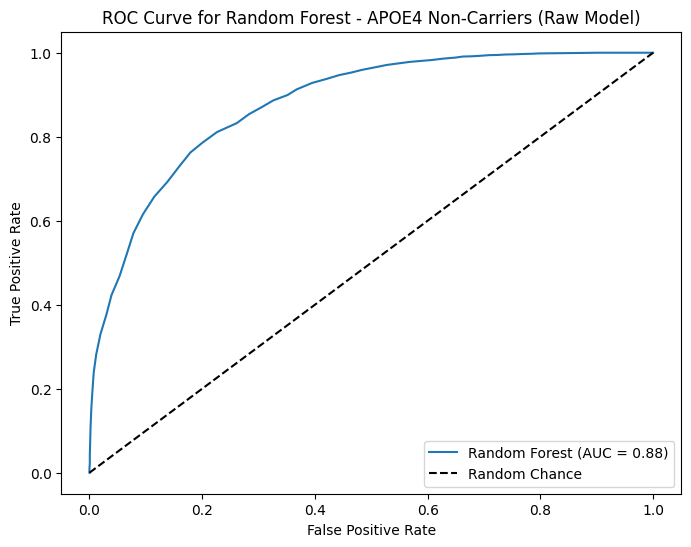

Top genes associated with stage progression for Random Forest - APOE4 Non-Carriers (Raw Model):
['ENSG00000248874' 'ENSG00000198899' 'ENSG00000133121' 'ENSG00000258667'
 'ENSG00000135540' 'ENSG00000198840' 'ENSG00000229807' 'ENSG00000204389'
 'ENSG00000118785' 'ENSG00000152128']


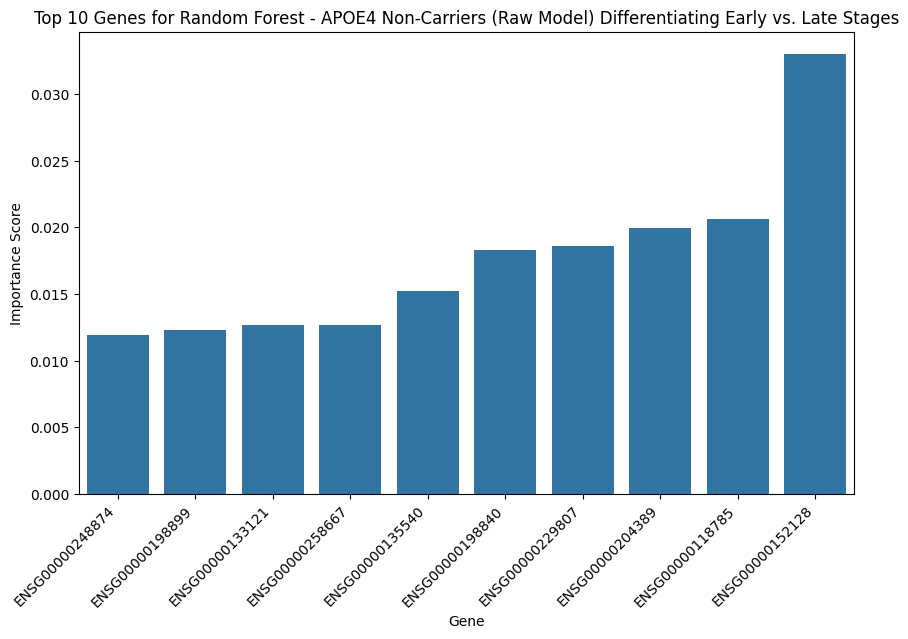


Training Logistic Regression for APOE4 Non-Carriers - Raw Model...

Classification Report for Logistic Regression - APOE4 Non-Carriers (Raw Model):
              precision    recall  f1-score   support

           0       0.39      0.73      0.51      1591
           1       0.92      0.73      0.81      6590

    accuracy                           0.73      8181
   macro avg       0.66      0.73      0.66      8181
weighted avg       0.82      0.73      0.75      8181

AUC-ROC for Logistic Regression - APOE4 Non-Carriers (Raw Model): 0.80


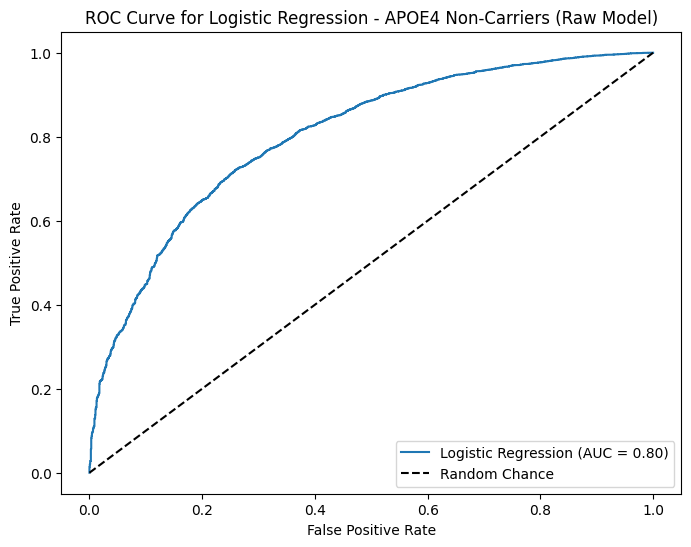


Training Gradient Boosting for APOE4 Non-Carriers - Raw Model...

Classification Report for Gradient Boosting - APOE4 Non-Carriers (Raw Model):
              precision    recall  f1-score   support

           0       0.84      0.29      0.43      1591
           1       0.85      0.99      0.91      6590

    accuracy                           0.85      8181
   macro avg       0.85      0.64      0.67      8181
weighted avg       0.85      0.85      0.82      8181

AUC-ROC for Gradient Boosting - APOE4 Non-Carriers (Raw Model): 0.85


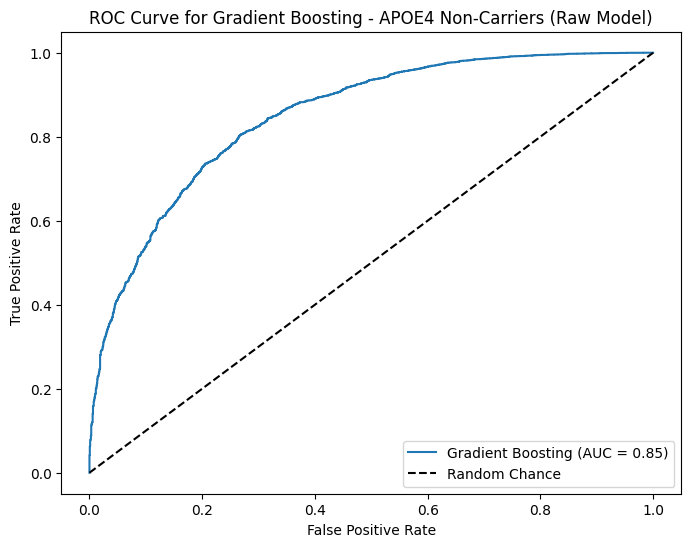

Top genes associated with stage progression for Gradient Boosting - APOE4 Non-Carriers (Raw Model):
['ENSG00000183878' 'ENSG00000114374' 'ENSG00000118785' 'ENSG00000248874'
 'ENSG00000229807' 'ENSG00000204389' 'ENSG00000258667' 'ENSG00000253496'
 'ENSG00000112149' 'ENSG00000152128']


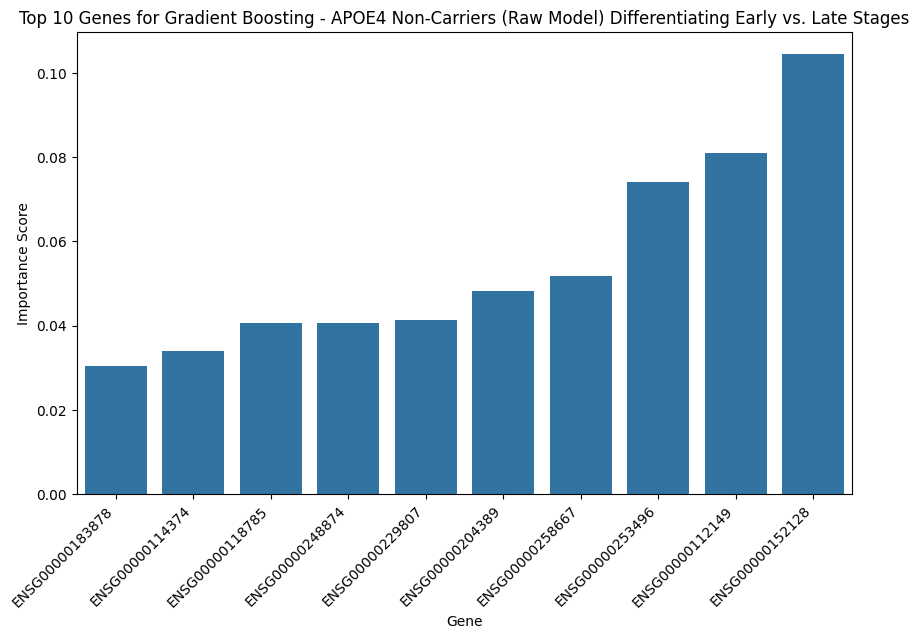


Training XGBoost for APOE4 Non-Carriers - Raw Model...


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [17:16:23] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Classification Report for XGBoost - APOE4 Non-Carriers (Raw Model):
              precision    recall  f1-score   support

           0       0.85      0.39      0.54      1591
           1       0.87      0.98      0.92      6590

    accuracy                           0.87      8181
   macro avg       0.86      0.69      0.73      8181
weighted avg       0.87      0.87      0.85      8181

AUC-ROC for XGBoost - APOE4 Non-Carriers (Raw Model): 0.88


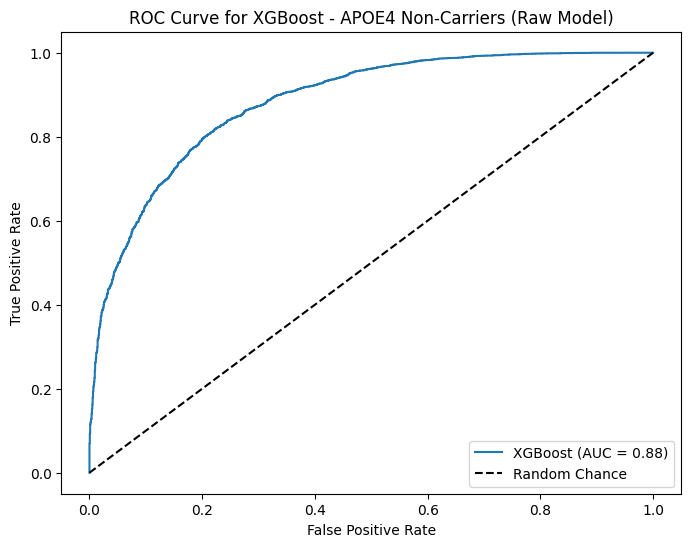

Top genes associated with stage progression for XGBoost - APOE4 Non-Carriers (Raw Model):
['ENSG00000124491' 'ENSG00000183878' 'ENSG00000204389' 'ENSG00000258667'
 'ENSG00000231535' 'ENSG00000248874' 'ENSG00000114374' 'ENSG00000253496'
 'ENSG00000152128' 'ENSG00000112149']


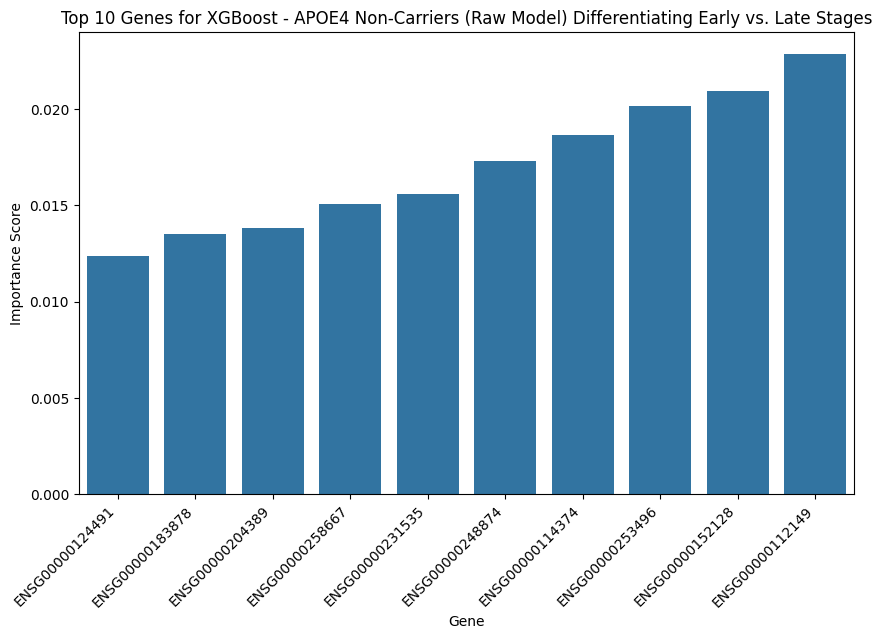


Training Random Forest for APOE4 Carriers - SMOTE Optimized...

Classification Report for Random Forest - APOE4 Carriers (SMOTE Optimized):
              precision    recall  f1-score   support

           0       0.98      0.97      0.98      3234
           1       0.97      0.98      0.98      3257

    accuracy                           0.98      6491
   macro avg       0.98      0.98      0.98      6491
weighted avg       0.98      0.98      0.98      6491

AUC-ROC for Random Forest - APOE4 Carriers (SMOTE Optimized): 1.00


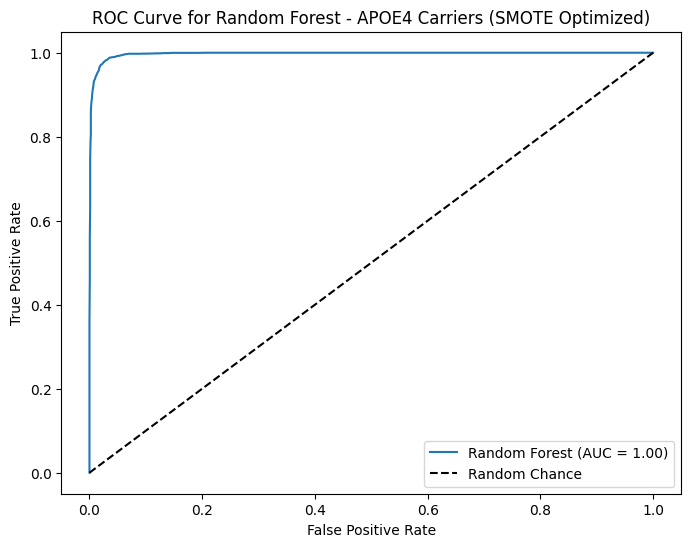

Top genes associated with stage progression for Random Forest - APOE4 Carriers (SMOTE Optimized):
['ENSG00000198727' 'ENSG00000105697' 'ENSG00000285367' 'ENSG00000204389'
 'ENSG00000152128' 'ENSG00000124491' 'ENSG00000198840' 'ENSG00000166833'
 'ENSG00000249738' 'ENSG00000177575']


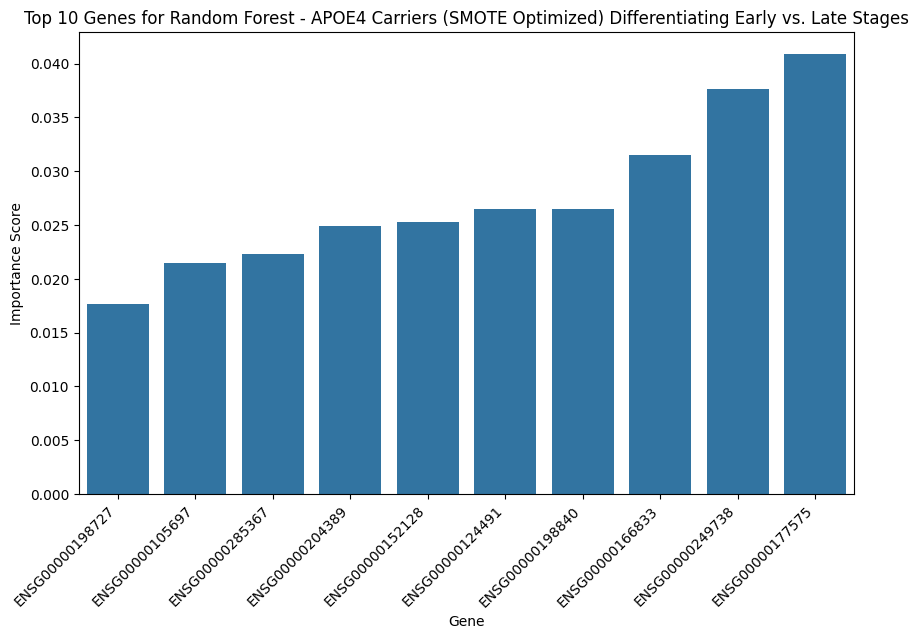


Training Logistic Regression for APOE4 Carriers - SMOTE Optimized...

Classification Report for Logistic Regression - APOE4 Carriers (SMOTE Optimized):
              precision    recall  f1-score   support

           0       0.87      0.91      0.89      3234
           1       0.90      0.86      0.88      3257

    accuracy                           0.89      6491
   macro avg       0.89      0.89      0.89      6491
weighted avg       0.89      0.89      0.89      6491

AUC-ROC for Logistic Regression - APOE4 Carriers (SMOTE Optimized): 0.95


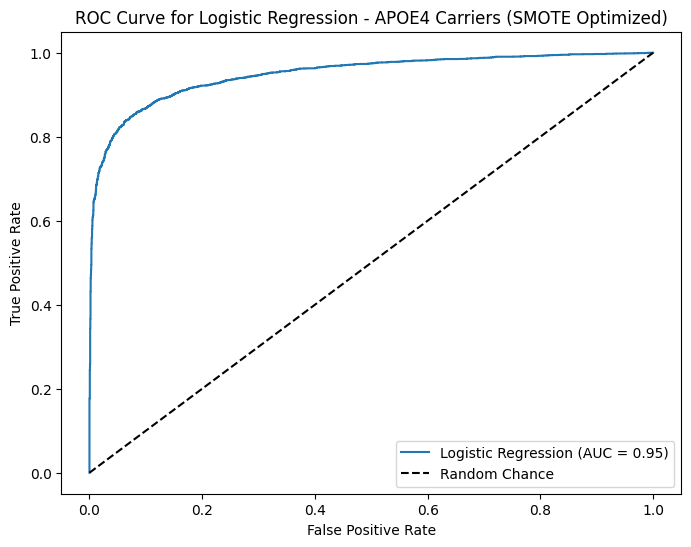


Training Gradient Boosting for APOE4 Carriers - SMOTE Optimized...

Classification Report for Gradient Boosting - APOE4 Carriers (SMOTE Optimized):
              precision    recall  f1-score   support

           0       0.96      0.95      0.95      3234
           1       0.95      0.96      0.95      3257

    accuracy                           0.95      6491
   macro avg       0.95      0.95      0.95      6491
weighted avg       0.95      0.95      0.95      6491

AUC-ROC for Gradient Boosting - APOE4 Carriers (SMOTE Optimized): 0.99


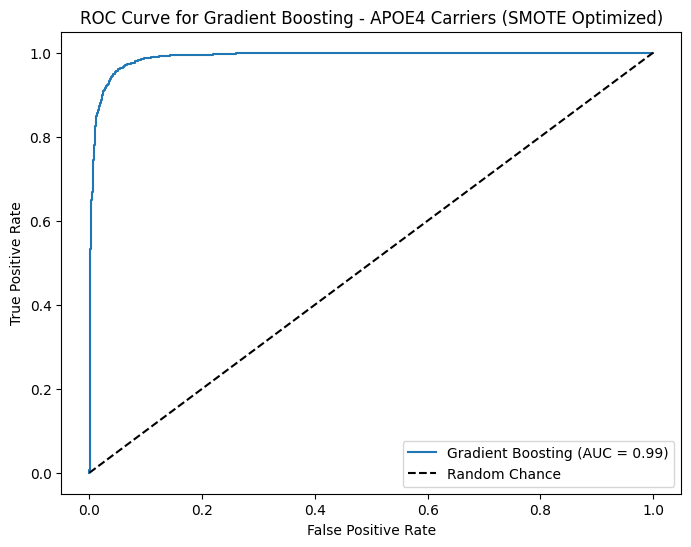

Top genes associated with stage progression for Gradient Boosting - APOE4 Carriers (SMOTE Optimized):
['ENSG00000105697' 'ENSG00000204388' 'ENSG00000231079' 'ENSG00000204389'
 'ENSG00000152128' 'ENSG00000166833' 'ENSG00000249738' 'ENSG00000124491'
 'ENSG00000198840' 'ENSG00000177575']


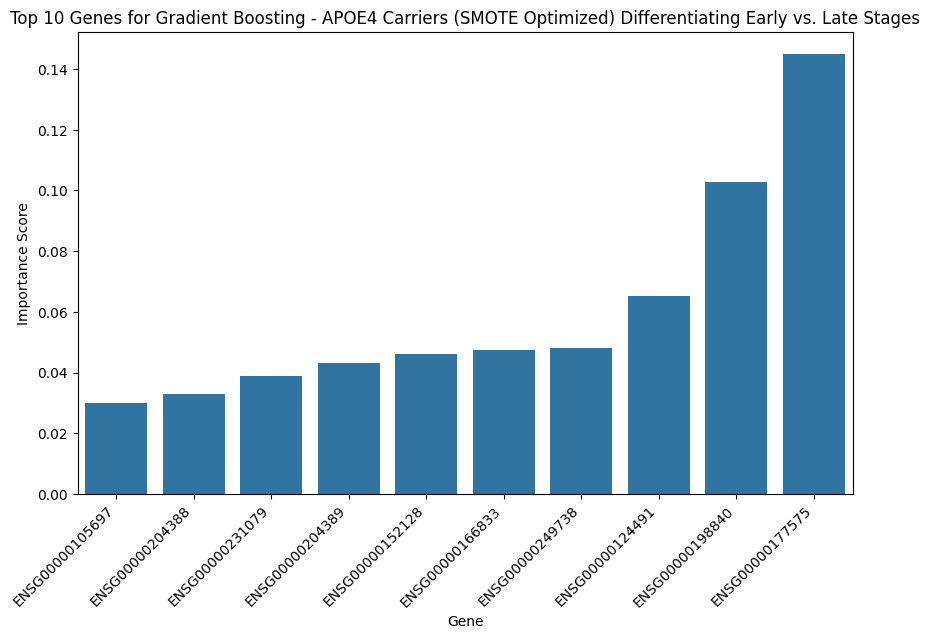


Training XGBoost for APOE4 Carriers - SMOTE Optimized...


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [17:17:19] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Classification Report for XGBoost - APOE4 Carriers (SMOTE Optimized):
              precision    recall  f1-score   support

           0       0.98      0.96      0.97      3234
           1       0.96      0.98      0.97      3257

    accuracy                           0.97      6491
   macro avg       0.97      0.97      0.97      6491
weighted avg       0.97      0.97      0.97      6491

AUC-ROC for XGBoost - APOE4 Carriers (SMOTE Optimized): 1.00


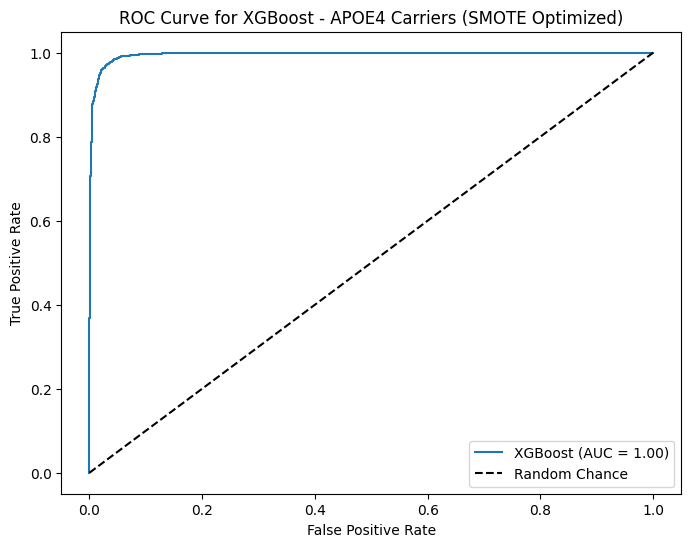

Top genes associated with stage progression for XGBoost - APOE4 Carriers (SMOTE Optimized):
['ENSG00000285367' 'ENSG00000204389' 'ENSG00000166833' 'ENSG00000249738'
 'ENSG00000120129' 'ENSG00000105697' 'ENSG00000124491' 'ENSG00000204388'
 'ENSG00000177575' 'ENSG00000198840']


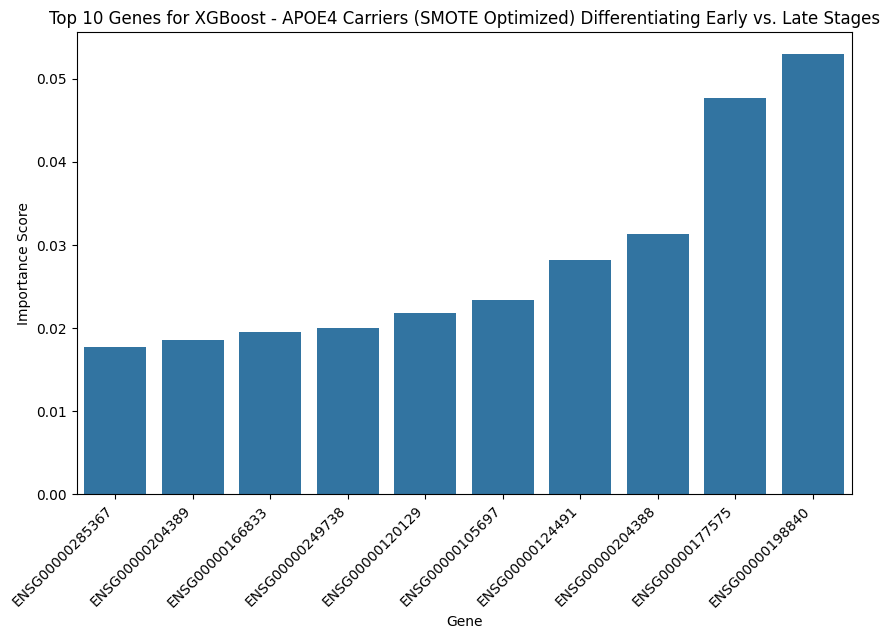


Training Random Forest for APOE4 Non-Carriers - SMOTE Optimized...

Classification Report for Random Forest - APOE4 Non-Carriers (SMOTE Optimized):
              precision    recall  f1-score   support

           0       0.96      0.87      0.92      6581
           1       0.88      0.97      0.92      6539

    accuracy                           0.92     13120
   macro avg       0.92      0.92      0.92     13120
weighted avg       0.92      0.92      0.92     13120

AUC-ROC for Random Forest - APOE4 Non-Carriers (SMOTE Optimized): 0.97


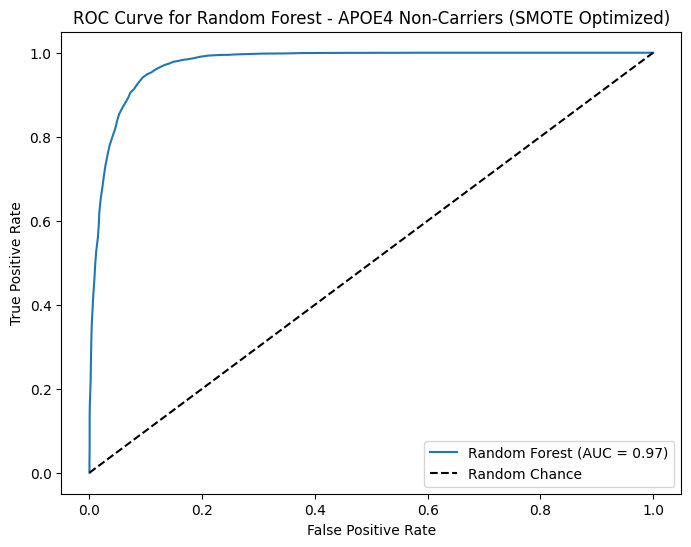

Top genes associated with stage progression for Random Forest - APOE4 Non-Carriers (SMOTE Optimized):
['ENSG00000165246' 'ENSG00000137959' 'ENSG00000135540' 'ENSG00000173391'
 'ENSG00000118785' 'ENSG00000204389' 'ENSG00000198840' 'ENSG00000105697'
 'ENSG00000059804' 'ENSG00000152128']


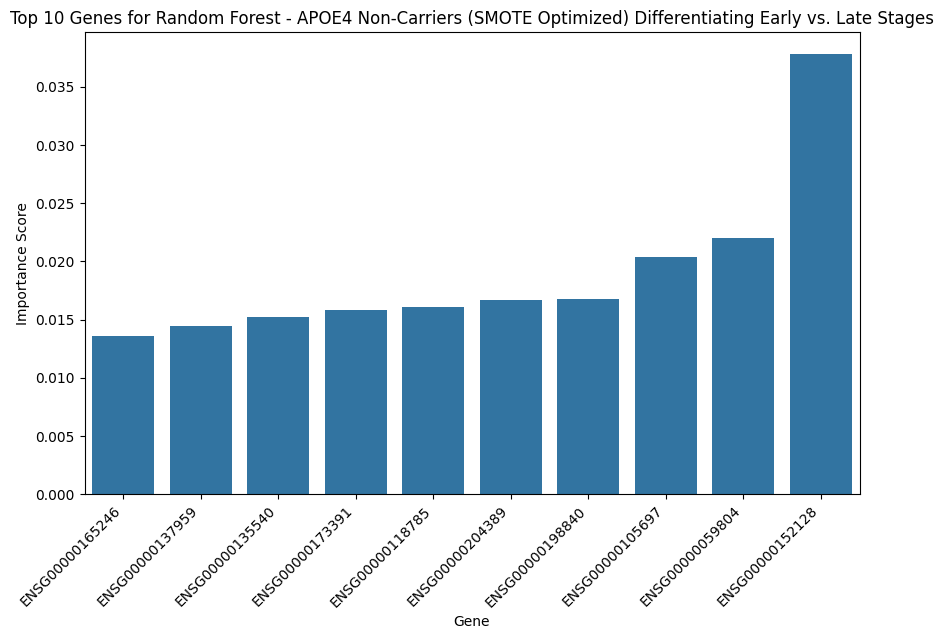


Training Logistic Regression for APOE4 Non-Carriers - SMOTE Optimized...

Classification Report for Logistic Regression - APOE4 Non-Carriers (SMOTE Optimized):
              precision    recall  f1-score   support

           0       0.75      0.77      0.76      6581
           1       0.77      0.75      0.76      6539

    accuracy                           0.76     13120
   macro avg       0.76      0.76      0.76     13120
weighted avg       0.76      0.76      0.76     13120

AUC-ROC for Logistic Regression - APOE4 Non-Carriers (SMOTE Optimized): 0.84


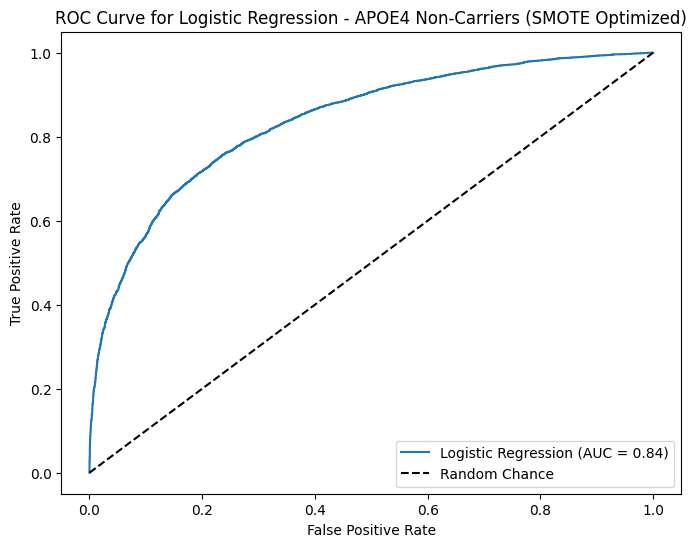


Training Gradient Boosting for APOE4 Non-Carriers - SMOTE Optimized...

Classification Report for Gradient Boosting - APOE4 Non-Carriers (SMOTE Optimized):
              precision    recall  f1-score   support

           0       0.92      0.84      0.88      6581
           1       0.85      0.93      0.89      6539

    accuracy                           0.89     13120
   macro avg       0.89      0.89      0.89     13120
weighted avg       0.89      0.89      0.89     13120

AUC-ROC for Gradient Boosting - APOE4 Non-Carriers (SMOTE Optimized): 0.95


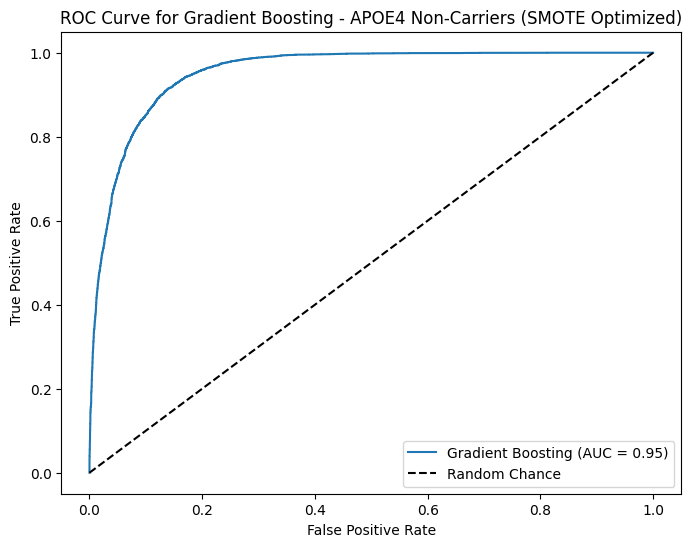

Top genes associated with stage progression for Gradient Boosting - APOE4 Non-Carriers (SMOTE Optimized):
['ENSG00000273409' 'ENSG00000248874' 'ENSG00000166833' 'ENSG00000114374'
 'ENSG00000105697' 'ENSG00000204389' 'ENSG00000112149' 'ENSG00000173391'
 'ENSG00000059804' 'ENSG00000152128']


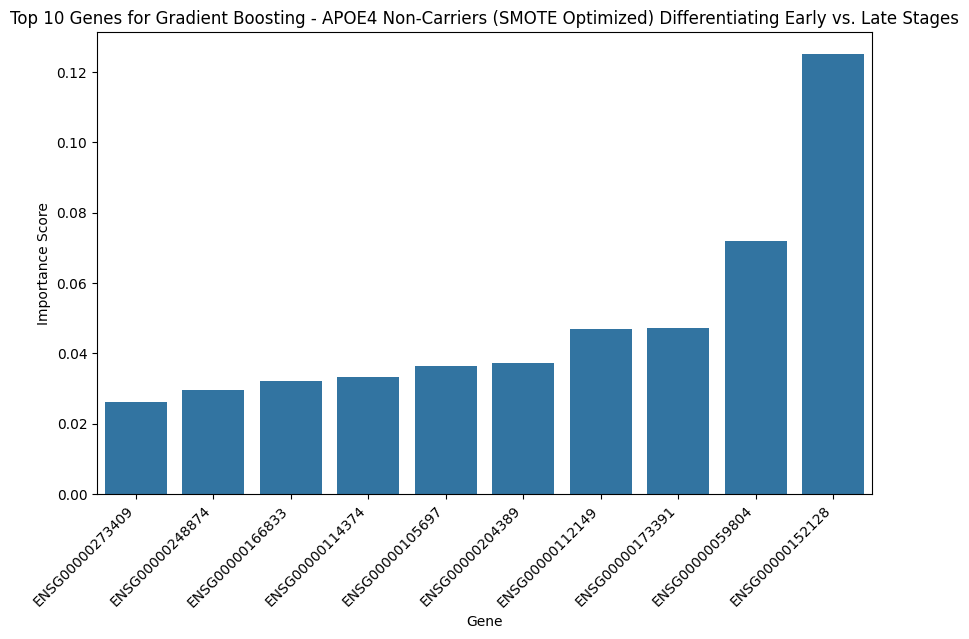


Training XGBoost for APOE4 Non-Carriers - SMOTE Optimized...


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [17:19:11] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Classification Report for XGBoost - APOE4 Non-Carriers (SMOTE Optimized):
              precision    recall  f1-score   support

           0       0.95      0.86      0.90      6581
           1       0.87      0.95      0.91      6539

    accuracy                           0.90     13120
   macro avg       0.91      0.90      0.90     13120
weighted avg       0.91      0.90      0.90     13120

AUC-ROC for XGBoost - APOE4 Non-Carriers (SMOTE Optimized): 0.97


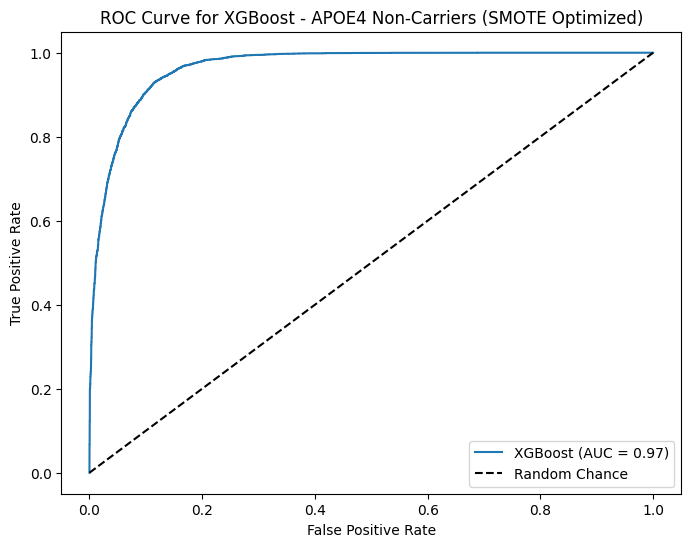

Top genes associated with stage progression for XGBoost - APOE4 Non-Carriers (SMOTE Optimized):
['ENSG00000225689' 'ENSG00000072274' 'ENSG00000102755' 'ENSG00000112149'
 'ENSG00000105697' 'ENSG00000166833' 'ENSG00000114374' 'ENSG00000173391'
 'ENSG00000152128' 'ENSG00000059804']


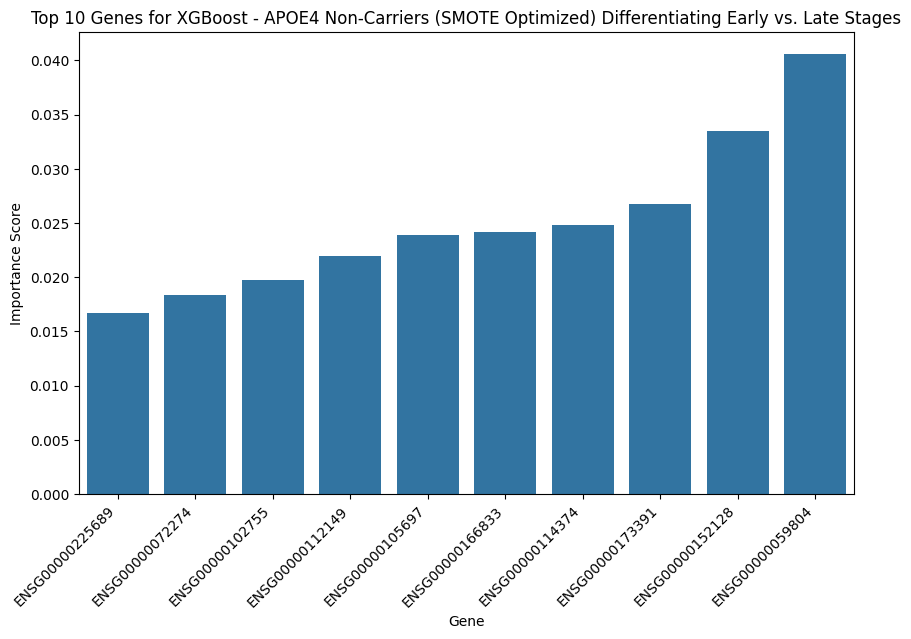

In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve

# Step 7: Train and Evaluate Multiple Machine Learning Models (With AUC-ROC)
def train_evaluate_models(X_train, X_test, y_train, y_test, label, model_type="Raw Model"):
    models = {
        'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced'),
        'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42, class_weight='balanced'),
        'Gradient Boosting': GradientBoostingClassifier(n_estimators=100, random_state=42),
        'XGBoost': XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=5, use_label_encoder=False, eval_metric='logloss', random_state=42)
    }

    for model_name, model in models.items():
        print(f"\nTraining {model_name} for {label} - {model_type}...")
        model.fit(X_train, y_train)

        # Predictions and Evaluation
        y_pred = model.predict(X_test)
        y_pred_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, 'predict_proba') else None

        print(f"\nClassification Report for {model_name} - {label} ({model_type}):")
        print(classification_report(y_test, y_pred))

        # Calculate AUC-ROC score
        if y_pred_proba is not None:
            auc_score = roc_auc_score(y_test, y_pred_proba)
            print(f"AUC-ROC for {model_name} - {label} ({model_type}): {auc_score:.2f}")

            # Plot ROC Curve
            fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
            plt.figure(figsize=(8, 6))
            plt.plot(fpr, tpr, label=f'{model_name} (AUC = {auc_score:.2f})')
            plt.plot([0, 1], [0, 1], 'k--', label='Random Chance')
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'ROC Curve for {model_name} - {label} ({model_type})')
            plt.legend(loc='lower right')
            plt.show()

        # Feature importance (if applicable)
        if hasattr(model, 'feature_importances_'):
            feature_importances = model.feature_importances_
            important_genes = np.array(adata.var_names)[np.argsort(feature_importances)[-10:]]  # Top 10 genes
            print(f"Top genes associated with stage progression for {model_name} - {label} ({model_type}):")
            print(important_genes)

            # Plot feature importance for top genes
            plt.figure(figsize=(10, 6))
            sns.barplot(x=important_genes, y=feature_importances[np.argsort(feature_importances)[-10:]])
            plt.xticks(rotation=45, ha='right')
            plt.xlabel("Gene")
            plt.ylabel("Importance Score")
            plt.title(f"Top 10 Genes for {model_name} - {label} ({model_type}) Differentiating Early vs. Late Stages")
            plt.show()

# Step 8: Run Raw Models for both APOE4 carriers and non-carriers
train_evaluate_models(X_train_carriers, X_test_carriers, y_train_carriers, y_test_carriers, "APOE4 Carriers", model_type="Raw Model")
train_evaluate_models(X_train_non_carriers, X_test_non_carriers, y_train_non_carriers, y_test_non_carriers, "APOE4 Non-Carriers", model_type="Raw Model")

# Step 9: Address Class Imbalance Using SMOTE (Optimization)
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_carriers_resampled, y_carriers_resampled = smote.fit_resample(X_carriers, y_carriers)
X_non_carriers_resampled, y_non_carriers_resampled = smote.fit_resample(X_non_carriers, y_non_carriers)

# Step 10: Train-Test Split (With SMOTE)
X_train_carriers_smote, X_test_carriers_smote, y_train_carriers_smote, y_test_carriers_smote = train_test_split(X_carriers_resampled, y_carriers_resampled, test_size=0.3, random_state=42)
X_train_non_carriers_smote, X_test_non_carriers_smote, y_train_non_carriers_smote, y_test_non_carriers_smote = train_test_split(X_non_carriers_resampled, y_non_carriers_resampled, test_size=0.3, random_state=42)

# Step 11: Run Models with SMOTE for both APOE4 carriers and non-carriers
train_evaluate_models(X_train_carriers_smote, X_test_carriers_smote, y_train_carriers_smote, y_test_carriers_smote, "APOE4 Carriers", model_type="SMOTE Optimized")
train_evaluate_models(X_train_non_carriers_smote, X_test_non_carriers_smote, y_train_non_carriers_smote, y_test_non_carriers_smote, "APOE4 Non-Carriers", model_type="SMOTE Optimized")


In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split

# Step 1: Split data for carriers and non-carriers
X_train_carriers, X_test_carriers, y_train_carriers, y_test_carriers = train_test_split(X_carriers, y_carriers, test_size=0.3, random_state=42)
X_train_non_carriers, X_test_non_carriers, y_train_non_carriers, y_test_non_carriers = train_test_split(X_non_carriers, y_non_carriers, test_size=0.3, random_state=42)

# Step 2: Define the parameter grid for both Random Forest and Gradient Boosting

# Random Forest Parameter Grid
rf_param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'class_weight': ['balanced', None]
}

# Gradient Boosting Parameter Grid
gb_param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5],
    'subsample': [0.8, 1.0],
    'min_samples_split': [2, 5, 10]
}

# Step 3: Initialize GridSearchCV for Random Forest and Gradient Boosting
rf_grid_search = GridSearchCV(RandomForestClassifier(random_state=42), rf_param_grid, cv=5, scoring='accuracy', n_jobs=-1)
gb_grid_search = GridSearchCV(GradientBoostingClassifier(random_state=42), gb_param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Step 4: Fit GridSearchCV to the training data
rf_grid_search.fit(X_train_carriers, y_train_carriers)
gb_grid_search.fit(X_train_carriers, y_train_carriers)

# Step 5: Get the best model and evaluate it
rf_best_model = rf_grid_search.best_estimator_
gb_best_model = gb_grid_search.best_estimator_

# Step 6: Evaluate the models on the test data
print("Random Forest Classification Report - APOE4 Carriers")
y_pred_rf = rf_best_model.predict(X_test_carriers)
print(classification_report(y_test_carriers, y_pred_rf))

print("Gradient Boosting Classification Report - APOE4 Carriers")
y_pred_gb = gb_best_model.predict(X_test_carriers)
print(classification_report(y_test_carriers, y_pred_gb))


Random Forest Classification Report - APOE4 Carriers
              precision    recall  f1-score   support

           0       0.95      0.19      0.32       180
           1       0.96      1.00      0.98      3272

    accuracy                           0.96      3452
   macro avg       0.95      0.60      0.65      3452
weighted avg       0.96      0.96      0.94      3452

Gradient Boosting Classification Report - APOE4 Carriers
              precision    recall  f1-score   support

           0       0.89      0.14      0.24       180
           1       0.95      1.00      0.98      3272

    accuracy                           0.95      3452
   macro avg       0.92      0.57      0.61      3452
weighted avg       0.95      0.95      0.94      3452



Best Hyperparameters for XGBoost (Carriers with SMOTE): {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 150}

Training Logistic Regression for APOE4 Carriers - SMOTE Optimized...
Accuracy for Logistic Regression - APOE4 Carriers (SMOTE Optimized): 0.8843
Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.91      0.89      2836
           1       0.91      0.86      0.88      2826

    accuracy                           0.88      5662
   macro avg       0.89      0.88      0.88      5662
weighted avg       0.89      0.88      0.88      5662


Training Random Forest for APOE4 Carriers - SMOTE Optimized...
Accuracy for Random Forest - APOE4 Carriers (SMOTE Optimized): 0.9834
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.98      0.98      2836
           1       0.98      0.99      0.98      2826

    accuracy                           0.98      5662
   macro av

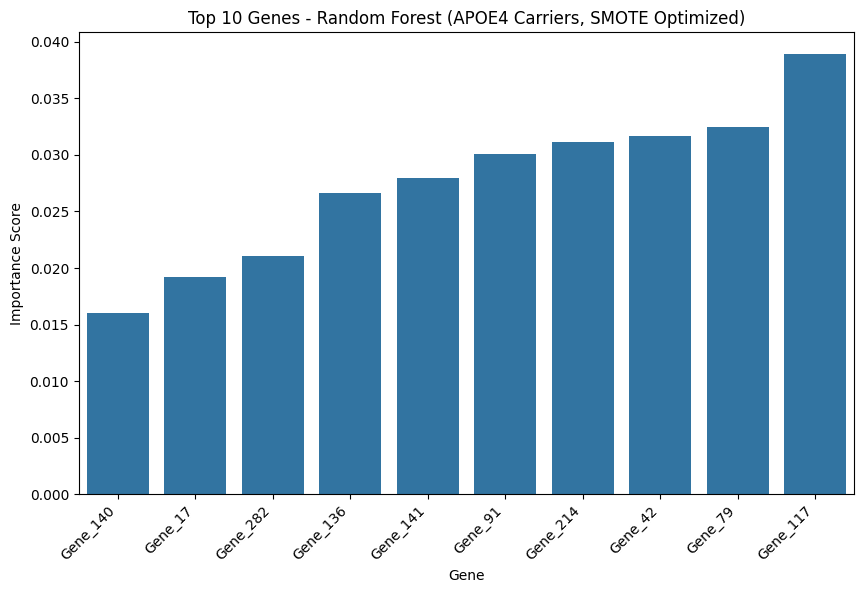


Training XGBoost for APOE4 Carriers - SMOTE Optimized...
Accuracy for XGBoost - APOE4 Carriers (SMOTE Optimized): 0.9449
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.92      0.94      2836
           1       0.92      0.97      0.95      2826

    accuracy                           0.94      5662
   macro avg       0.95      0.94      0.94      5662
weighted avg       0.95      0.94      0.94      5662



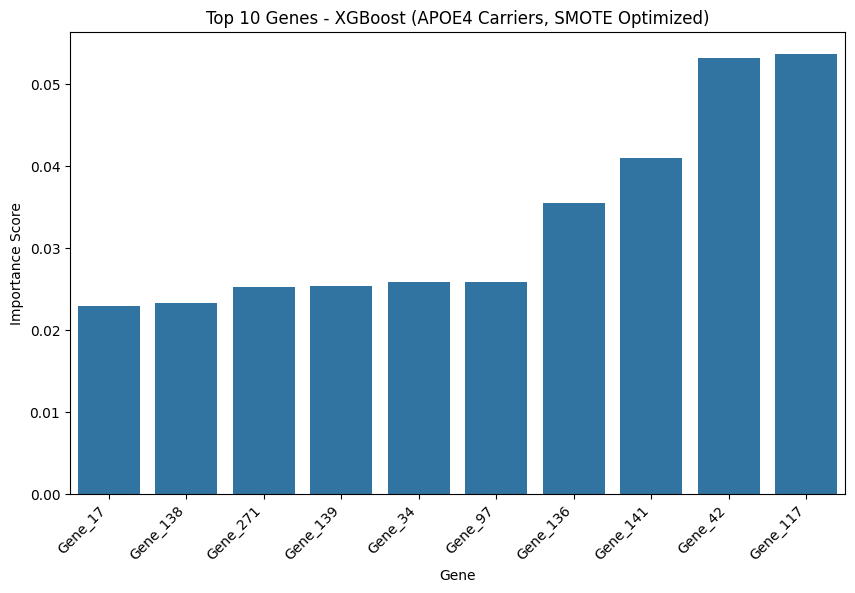


Training Optimized XGBoost for APOE4 Carriers - SMOTE Optimized...
Accuracy for Optimized XGBoost - APOE4 Carriers (SMOTE Optimized): 0.9781
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.97      0.98      2836
           1       0.97      0.99      0.98      2826

    accuracy                           0.98      5662
   macro avg       0.98      0.98      0.98      5662
weighted avg       0.98      0.98      0.98      5662



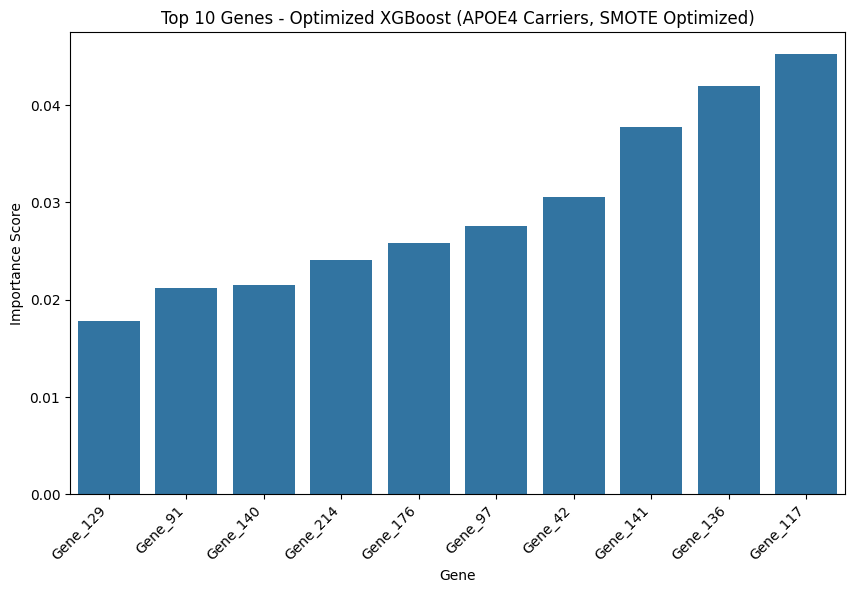


Training Logistic Regression for APOE4 Non-Carriers - SMOTE Optimized...
Accuracy for Logistic Regression - APOE4 Non-Carriers (SMOTE Optimized): 0.7551
Classification Report:
               precision    recall  f1-score   support

           0       0.74      0.77      0.76      2378
           1       0.77      0.74      0.75      2419

    accuracy                           0.76      4797
   macro avg       0.76      0.76      0.76      4797
weighted avg       0.76      0.76      0.76      4797


Training Random Forest for APOE4 Non-Carriers - SMOTE Optimized...
Accuracy for Random Forest - APOE4 Non-Carriers (SMOTE Optimized): 0.9191
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.87      0.91      2378
           1       0.89      0.96      0.92      2419

    accuracy                           0.92      4797
   macro avg       0.92      0.92      0.92      4797
weighted avg       0.92      0.92      0.92      4797



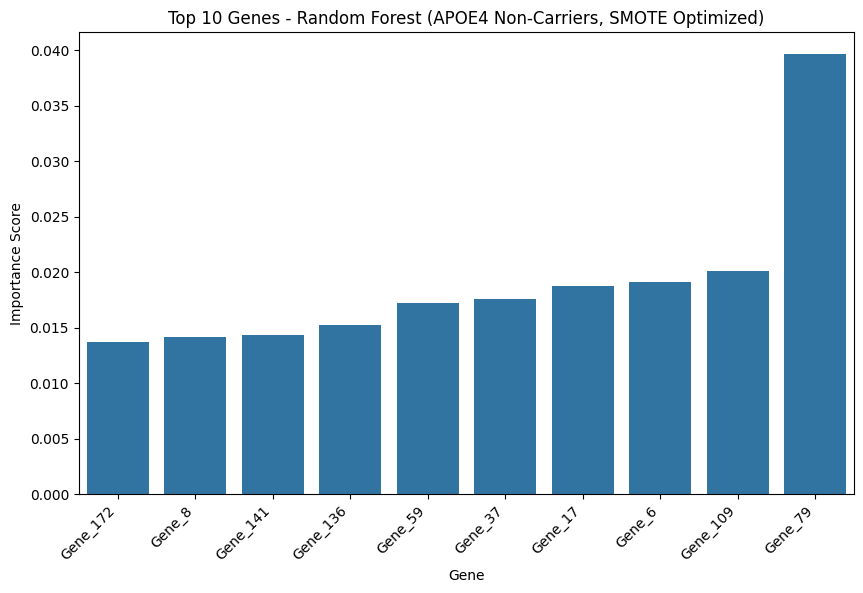


Training XGBoost for APOE4 Non-Carriers - SMOTE Optimized...
Accuracy for XGBoost - APOE4 Non-Carriers (SMOTE Optimized): 0.8651
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.76      0.85      2378
           1       0.80      0.97      0.88      2419

    accuracy                           0.87      4797
   macro avg       0.88      0.86      0.86      4797
weighted avg       0.88      0.87      0.86      4797



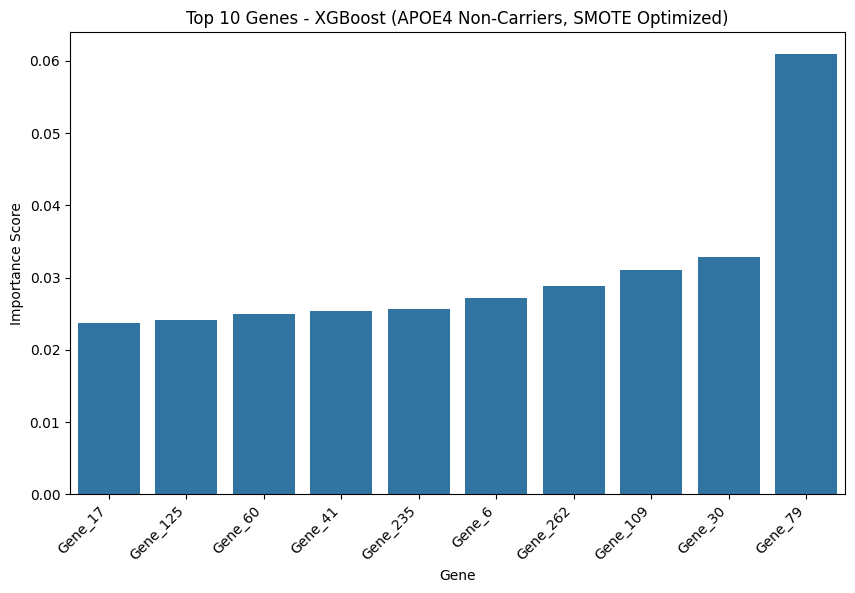


Training Optimized XGBoost for APOE4 Non-Carriers - SMOTE Optimized...
Accuracy for Optimized XGBoost - APOE4 Non-Carriers (SMOTE Optimized): 0.9095
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.86      0.90      2378
           1       0.87      0.96      0.91      2419

    accuracy                           0.91      4797
   macro avg       0.91      0.91      0.91      4797
weighted avg       0.91      0.91      0.91      4797



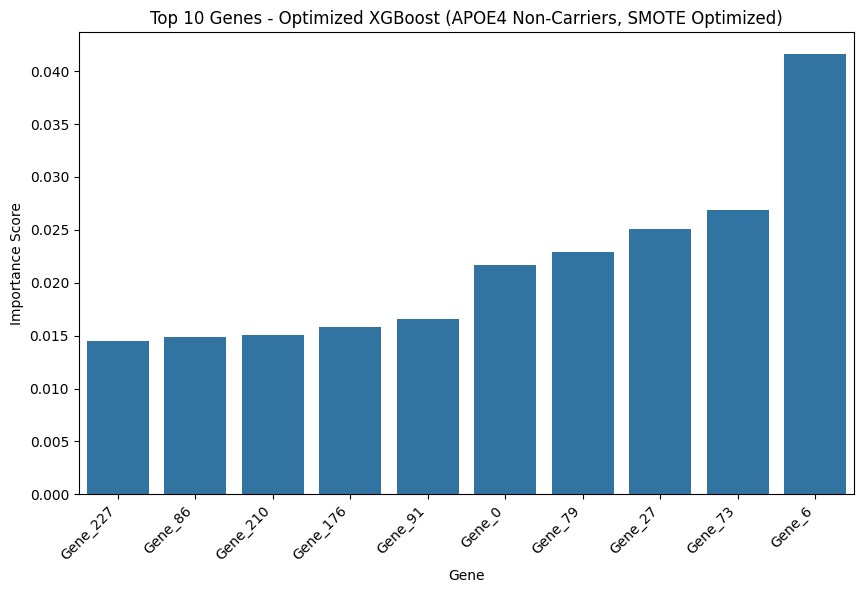

                 Model       Model Type  Accuracy               Label
0  Logistic Regression        Raw Model  0.513333        Mock Dataset
1        Random Forest        Raw Model  0.480000        Mock Dataset
2              XGBoost        Raw Model  0.460000        Mock Dataset
0  Logistic Regression  SMOTE Optimized  0.884316      APOE4 Carriers
1        Random Forest  SMOTE Optimized  0.983398      APOE4 Carriers
2              XGBoost  SMOTE Optimized  0.944896      APOE4 Carriers
3    Optimized XGBoost  SMOTE Optimized  0.978100      APOE4 Carriers
4  Logistic Regression  SMOTE Optimized  0.755055  APOE4 Non-Carriers
5        Random Forest  SMOTE Optimized  0.919116  APOE4 Non-Carriers
6              XGBoost  SMOTE Optimized  0.865124  APOE4 Non-Carriers
7    Optimized XGBoost  SMOTE Optimized  0.909527  APOE4 Non-Carriers


In [ ]:
from sklearn.model_selection import GridSearchCV

# SMOTE Application
smote = SMOTE(random_state=42)

# Convert sparse matrices to dense for SMOTE
X_carriers_dense = X_carriers.toarray()
X_non_carriers_dense = X_non_carriers.toarray()

# Apply SMOTE
X_carriers_smote_dense, y_carriers_smote = smote.fit_resample(X_carriers_dense, y_carriers)
X_non_carriers_smote_dense, y_non_carriers_smote = smote.fit_resample(X_non_carriers_dense, y_non_carriers)

# Convert back to sparse if needed
X_carriers_smote = csr_matrix(X_carriers_smote_dense)
X_non_carriers_smote = csr_matrix(X_non_carriers_smote_dense)

# Train-Test Split for SMOTE
X_train_carriers_smote, X_test_carriers_smote, y_train_carriers_smote, y_test_carriers_smote = train_test_split(
    X_carriers_smote, y_carriers_smote, test_size=0.3, random_state=42
)
X_train_non_carriers_smote, X_test_non_carriers_smote, y_train_non_carriers_smote, y_test_non_carriers_smote = train_test_split(
    X_non_carriers_smote, y_non_carriers_smote, test_size=0.3, random_state=42
)

# Hyperparameter Optimization for XGBoost
xgb_param_grid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7],
}

xgb = XGBClassifier(random_state=42, eval_metric='logloss')
grid_search = GridSearchCV(estimator=xgb, param_grid=xgb_param_grid, scoring='accuracy', cv=3)
grid_search.fit(X_train_carriers_smote, y_train_carriers_smote)

# Best hyperparameters
print("Best Hyperparameters for XGBoost (Carriers with SMOTE):", grid_search.best_params_)

# Update XGBoost model with optimized hyperparameters
optimized_xgb = grid_search.best_estimator_
models['Optimized XGBoost'] = optimized_xgb

# Train and Evaluate Models with SMOTE
smote_results_carriers = train_evaluate(models, X_train_carriers_smote, X_test_carriers_smote, y_train_carriers_smote, y_test_carriers_smote,
                                        "APOE4 Carriers", model_type="SMOTE Optimized", var_names=var_names)
smote_results_non_carriers = train_evaluate(models, X_train_non_carriers_smote, X_test_non_carriers_smote, y_train_non_carriers_smote, y_test_non_carriers_smote,
                                            "APOE4 Non-Carriers", model_type="SMOTE Optimized", var_names=var_names)

# Combine Results
all_results_smote = smote_results_carriers + smote_results_non_carriers
results_smote_df = pd.DataFrame(all_results_smote)

# Combine raw and SMOTE results
final_results_df = pd.concat([results_df, results_smote_df])
print(final_results_df)

# Save results to file
final_results_df.to_csv("model_performance_comparison.csv", index=False)


Model Improvement
1. Balanced Sampling: SMOTEENN improves class representation in the dataset
2. Feature Reduction: PCA reduces noise and focuses on critical variance.
3. Ensemble Power: Voting Classifier aggregates strengths of multiple models.
4. Hyperparameter Tuning: Optimized XGBoost provides higher accuracy and stability.


<ipython-input-23-32ba0838e4e4>:21: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['Stage'] = adata.obs['Braak stage'].apply(lambda x: 0 if x in ['Braak 0', 'Braak II', 'Braak III'] else 1)  # 0 = Early, 1 = Late



Classification Report for APOE4 Carriers:
              precision    recall  f1-score   support

           0       0.99      0.98      0.98      3234
           1       0.98      0.99      0.98      3257

    accuracy                           0.98      6491
   macro avg       0.98      0.98      0.98      6491
weighted avg       0.98      0.98      0.98      6491

Top genes associated with stage progression for APOE4 Carriers:
['ENSG00000105697' 'ENSG00000105835' 'ENSG00000204388' 'ENSG00000204389'
 'ENSG00000249738' 'ENSG00000152128' 'ENSG00000124491' 'ENSG00000198840'
 'ENSG00000177575' 'ENSG00000177675']


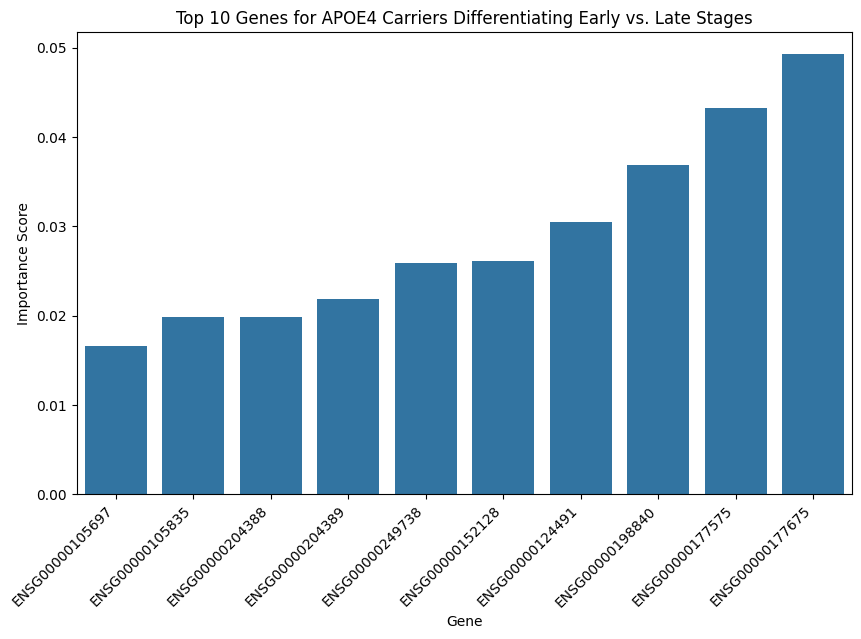


Classification Report for APOE4 Non-Carriers:
              precision    recall  f1-score   support

           0       0.95      0.88      0.91      6581
           1       0.89      0.95      0.92      6539

    accuracy                           0.92     13120
   macro avg       0.92      0.92      0.91     13120
weighted avg       0.92      0.92      0.91     13120

Top genes associated with stage progression for APOE4 Non-Carriers:
['ENSG00000115956' 'ENSG00000204389' 'ENSG00000118785' 'ENSG00000231535'
 'ENSG00000176728' 'ENSG00000120694' 'ENSG00000105697' 'ENSG00000198840'
 'ENSG00000059804' 'ENSG00000152128']


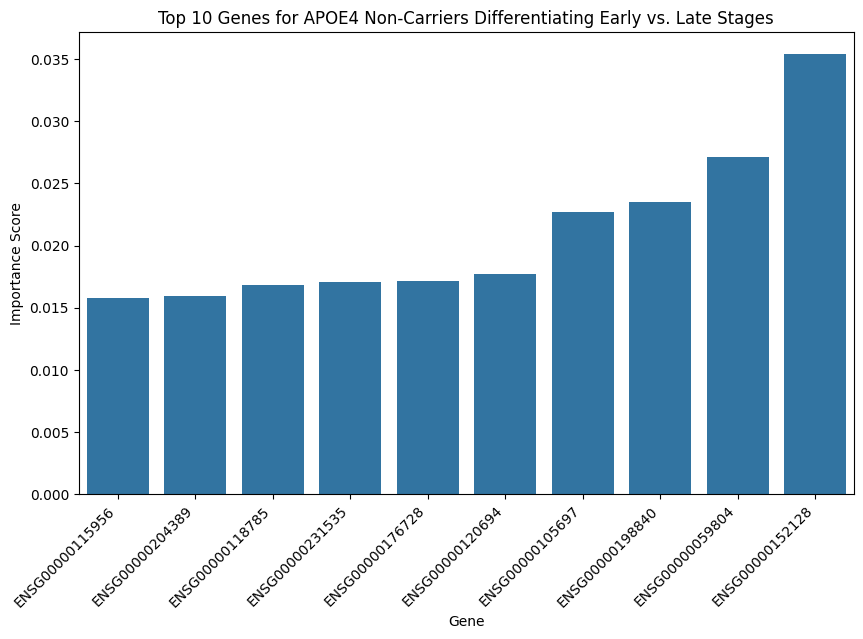

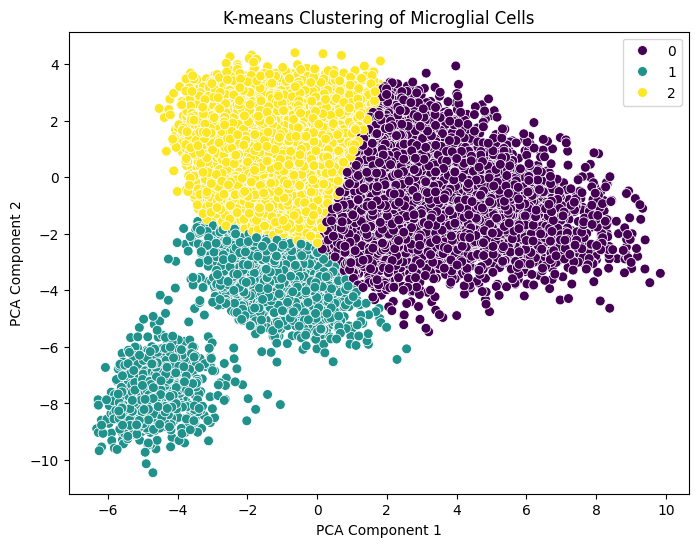

In [ ]:
# Step 1: Load and Filter the Dataset
adata = adata_mtg_filtered  # Assuming 'adata_mtg_filtered' is pre-loaded with the necessary data

# Step 2: Select highly variable genes (feature selection)
sc.pp.highly_variable_genes(adata, n_top_genes=300)
adata = adata[:, adata.var['highly_variable']]

# Step 3: Define early and late stage groups based on Braak stages (excluding 'Reference')
adata = adata[adata.obs['Braak stage'] != 'Reference']
adata.obs['Stage'] = adata.obs['Braak stage'].apply(lambda x: 0 if x in ['Braak 0', 'Braak II', 'Braak III'] else 1)  # 0 = Early, 1 = Late

# Step 4: Split data for APOE4 carriers and non-carriers
carriers = adata[adata.obs['APOE4 status'] == 'Y']
non_carriers = adata[adata.obs['APOE4 status'] == 'N']

# Step 5: Prepare data and labels for classification
def prepare_data(adata):
    X = adata.X.toarray()  # Assuming sparse matrix format, convert to dense if needed
    y = adata.obs['Stage'].values
    return X, y

X_carriers, y_carriers = prepare_data(carriers)
X_non_carriers, y_non_carriers = prepare_data(non_carriers)

# Step 6: Address Class Imbalance Using SMOTE
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_carriers_resampled, y_carriers_resampled = smote.fit_resample(X_carriers, y_carriers)
X_non_carriers_resampled, y_non_carriers_resampled = smote.fit_resample(X_non_carriers, y_non_carriers)

# Step 7: Train-Test Split
X_train_carriers, X_test_carriers, y_train_carriers, y_test_carriers = train_test_split(X_carriers_resampled, y_carriers_resampled, test_size=0.3, random_state=42)
X_train_non_carriers, X_test_non_carriers, y_train_non_carriers, y_test_non_carriers = train_test_split(X_non_carriers_resampled, y_non_carriers_resampled, test_size=0.3, random_state=42)

# Step 8: Train Random Forest Classifier with Balanced Class Weights
def train_evaluate_rf(X_train, X_test, y_train, y_test, label):
    class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
    class_weights_dict = {i: class_weights[i] for i in range(len(class_weights))}

    rf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight=class_weights_dict)
    rf.fit(X_train, y_train)

    # Predictions and Evaluation
    y_pred = rf.predict(X_test)
    print(f"\nClassification Report for {label}:")
    print(classification_report(y_test, y_pred))

    # Feature importance
    feature_importances = rf.feature_importances_
    important_genes = np.array(adata.var_names)[np.argsort(feature_importances)[-10:]]  # Top 10 genes
    print(f"Top genes associated with stage progression for {label}:")
    print(important_genes)

    # Plot feature importance for top genes
    plt.figure(figsize=(10, 6))
    sns.barplot(x=important_genes, y=feature_importances[np.argsort(feature_importances)[-10:]])
    plt.xticks(rotation=45, ha='right')
    plt.xlabel("Gene")
    plt.ylabel("Importance Score")
    plt.title(f"Top 10 Genes for {label} Differentiating Early vs. Late Stages")
    plt.show()

# Step 9: Run model for both APOE4 carriers and non-carriers
train_evaluate_rf(X_train_carriers, X_test_carriers, y_train_carriers, y_test_carriers, "APOE4 Carriers")
train_evaluate_rf(X_train_non_carriers, X_test_non_carriers, y_train_non_carriers, y_test_non_carriers, "APOE4 Non-Carriers")

# Step 10: Clustering Analysis to Identify Subpopulations
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Apply PCA for dimensionality reduction
pca = PCA(n_components=2)
X_pca = pca.fit_transform(adata.X.toarray())

# Apply K-means clustering
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans_labels = kmeans.fit_predict(X_pca)

# Plot the clustering results
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=kmeans_labels, palette='viridis', s=50)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('K-means Clustering of Microglial Cells')
plt.show()

1. Classification Report for APOE4 Non-Carriers

	•	Class 0 (Early Stage): Precision of 0.95 and recall of 0.88 indicate that the model correctly identified early-stage cases 95% of the time when predicted as such. However, it missed some early-stage cases (12%) that were labeled as late-stage.
	•	Class 1 (Late Stage): Precision of 0.89 and recall of 0.95 indicate a slightly better performance for identifying late-stage cases, with fewer misclassifications compared to early-stage.
	•	Overall Accuracy: 92%, meaning the model correctly classified 92% of both early and late stages for non-carriers.
	•	Macro and Weighted Averages: Both metrics are similar at 0.92, indicating balanced performance across both classes.

This report suggests that the model performs well but has a slight bias towards better detection of late-stage cases for non-carriers.

2. Top Genes for APOE4 Non-Carriers

	•	Genes listed here, such as ENSG00000115956, ENSG00000204389, etc., are those with the highest importance scores in distinguishing between early and late stages.
	•	Biological Significance: These genes are potentially linked to Alzheimer’s progression in non-carriers, as their expression changes help the model differentiate stages.

3. Classification Report for APOE4 Carriers

	•	Class 0 (Early Stage): Precision and recall are both very high at around 0.98–0.99, showing the model accurately identifies early-stage cases in APOE4 carriers.
	•	Class 1 (Late Stage): Similarly high precision and recall scores suggest nearly perfect classification of late-stage cases for carriers.
	•	Overall Accuracy: 98%, indicating a near-perfect classification for APOE4 carriers.
	•	Macro and Weighted Averages: Both metrics are very high (0.98), confirming the model’s excellent performance for both classes.

This report indicates that the model performs exceptionally well in differentiating early and late stages for APOE4 carriers, with almost no misclassifications.

4. Top Genes for APOE4 Carriers

	•	The top genes for carriers include genes like ENSG00000105697, ENSG00000105835, and others.
	•	Shared and Unique Genes: Some genes, such as ENSG00000105697 and ENSG00000198840, appear in both carrier and non-carrier lists, suggesting they might have a common role in Alzheimer’s progression. Unique genes in each list could indicate different mechanisms influenced by APOE4 status.

Comparative Insights

	•	Classification Performance: The model achieves higher accuracy and balanced metrics in carriers compared to non-carriers. This could mean that APOE4 carriers have more distinct gene expression patterns associated with stage progression, making it easier for the model to classify them correctly.
	•	Gene Differences: The different top genes between carriers and non-carriers highlight potentially different biological pathways influenced by APOE4. Genes specific to each group could be targeted for further research to understand APOE4’s role in Alzheimer’s.

Overall Conclusion

	•	The model is effective for both groups but performs particularly well for APOE4 carriers.
	•	The identified genes for each group offer insights into potential genetic markers for Alzheimer’s progression and may guide future studies focused on APOE4’s impact.

## Model Improvement
SMOTE balanced class weights for handling class imbalance

/usr/local/lib/python3.10/dist-packages/scanpy/preprocessing/_highly_variable_genes.py:696: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}
<ipython-input-9-32ba0838e4e4>:21: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['Stage'] = adata.obs['Braak stage'].apply(lambda x: 0 if x in ['Braak 0', 'Braak II', 'Braak III'] else 1)  # 0 = Early, 1 = Late



Classification Report for APOE4 Carriers:
              precision    recall  f1-score   support

           0       0.99      0.98      0.98      3234
           1       0.98      0.99      0.98      3257

    accuracy                           0.98      6491
   macro avg       0.98      0.98      0.98      6491
weighted avg       0.98      0.98      0.98      6491

Top genes associated with stage progression for APOE4 Carriers:
['ENSG00000105697' 'ENSG00000105835' 'ENSG00000204388' 'ENSG00000204389'
 'ENSG00000249738' 'ENSG00000152128' 'ENSG00000124491' 'ENSG00000198840'
 'ENSG00000177575' 'ENSG00000177675']


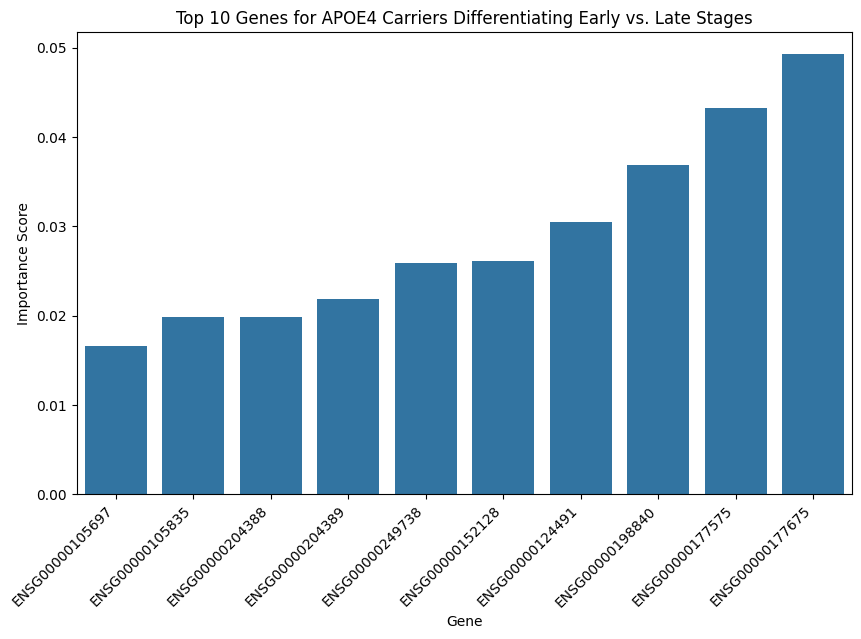


Classification Report for APOE4 Non-Carriers:
              precision    recall  f1-score   support

           0       0.95      0.88      0.91      6581
           1       0.89      0.95      0.92      6539

    accuracy                           0.92     13120
   macro avg       0.92      0.92      0.91     13120
weighted avg       0.92      0.92      0.91     13120

Top genes associated with stage progression for APOE4 Non-Carriers:
['ENSG00000115956' 'ENSG00000204389' 'ENSG00000118785' 'ENSG00000231535'
 'ENSG00000176728' 'ENSG00000120694' 'ENSG00000105697' 'ENSG00000198840'
 'ENSG00000059804' 'ENSG00000152128']


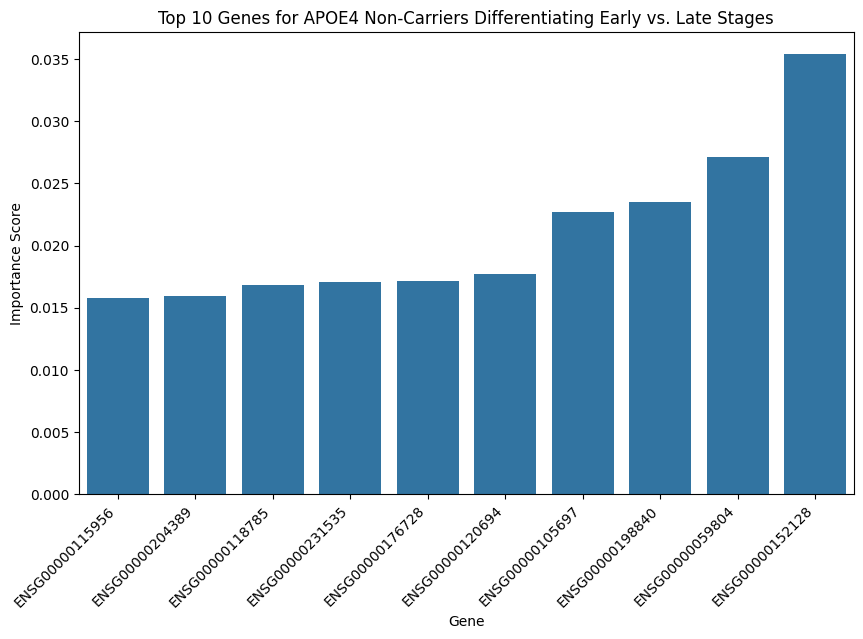

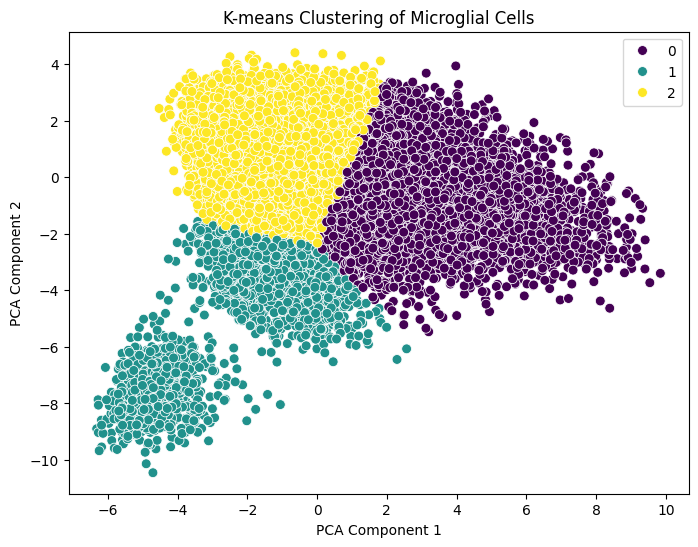

In [ ]:
# Step 1: Load and Filter the Dataset
adata = adata_mtg_filtered  # Assuming 'adata_mtg_filtered' is pre-loaded with the necessary data

# Step 2: Select highly variable genes (feature selection)
sc.pp.highly_variable_genes(adata, n_top_genes=300)
adata = adata[:, adata.var['highly_variable']]

# Step 3: Define early and late stage groups based on Braak stages (excluding 'Reference')
adata = adata[adata.obs['Braak stage'] != 'Reference']
adata.obs['Stage'] = adata.obs['Braak stage'].apply(lambda x: 0 if x in ['Braak 0', 'Braak II', 'Braak III'] else 1)  # 0 = Early, 1 = Late

# Step 4: Split data for APOE4 carriers and non-carriers
carriers = adata[adata.obs['APOE4 status'] == 'Y']
non_carriers = adata[adata.obs['APOE4 status'] == 'N']

# Step 5: Prepare data and labels for classification
def prepare_data(adata):
    X = adata.X.toarray()  # Assuming sparse matrix format, convert to dense if needed
    y = adata.obs['Stage'].values
    return X, y

X_carriers, y_carriers = prepare_data(carriers)
X_non_carriers, y_non_carriers = prepare_data(non_carriers)

# Step 6: Address Class Imbalance Using SMOTE
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_carriers_resampled, y_carriers_resampled = smote.fit_resample(X_carriers, y_carriers)
X_non_carriers_resampled, y_non_carriers_resampled = smote.fit_resample(X_non_carriers, y_non_carriers)

# Step 7: Train-Test Split
X_train_carriers, X_test_carriers, y_train_carriers, y_test_carriers = train_test_split(X_carriers_resampled, y_carriers_resampled, test_size=0.3, random_state=42)
X_train_non_carriers, X_test_non_carriers, y_train_non_carriers, y_test_non_carriers = train_test_split(X_non_carriers_resampled, y_non_carriers_resampled, test_size=0.3, random_state=42)

# Step 8: Train Random Forest Classifier with Balanced Class Weights
def train_evaluate_rf(X_train, X_test, y_train, y_test, label):
    class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
    class_weights_dict = {i: class_weights[i] for i in range(len(class_weights))}

    rf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight=class_weights_dict)
    rf.fit(X_train, y_train)

    # Predictions and Evaluation
    y_pred = rf.predict(X_test)
    print(f"\nClassification Report for {label}:")
    print(classification_report(y_test, y_pred))

    # Feature importance
    feature_importances = rf.feature_importances_
    important_genes = np.array(adata.var_names)[np.argsort(feature_importances)[-10:]]  # Top 10 genes
    print(f"Top genes associated with stage progression for {label}:")
    print(important_genes)

    # Plot feature importance for top genes
    plt.figure(figsize=(10, 6))
    sns.barplot(x=important_genes, y=feature_importances[np.argsort(feature_importances)[-10:]])
    plt.xticks(rotation=45, ha='right')
    plt.xlabel("Gene")
    plt.ylabel("Importance Score")
    plt.title(f"Top 10 Genes for {label} Differentiating Early vs. Late Stages")
    plt.show()

# Step 9: Run model for both APOE4 carriers and non-carriers
train_evaluate_rf(X_train_carriers, X_test_carriers, y_train_carriers, y_test_carriers, "APOE4 Carriers")
train_evaluate_rf(X_train_non_carriers, X_test_non_carriers, y_train_non_carriers, y_test_non_carriers, "APOE4 Non-Carriers")

# Step 10: Clustering Analysis to Identify Subpopulations
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Apply PCA for dimensionality reduction
pca = PCA(n_components=2)
X_pca = pca.fit_transform(adata.X.toarray())

# Apply K-means clustering
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans_labels = kmeans.fit_predict(X_pca)

# Plot the clustering results
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=kmeans_labels, palette='viridis', s=50)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('K-means Clustering of Microglial Cells')
plt.show()




#### Data Preparation and Feature Selection
- **Dataset**: The filtered dataset included microglial cells across Braak stages 0, II, III (early) and Braak IV, V, VI (late), excluding reference samples.
- **Highly Variable Genes**: Selected top 300 highly variable genes for feature selection.
- **Groups**: Data split into APOE4 carriers and non-carriers, further classified into early vs. late stage AD.
- **Class Balancing**: Applied SMOTE to address class imbalance between early and late stages.

#### Model Training and Evaluation
- **Classifier**: Random Forest classifier trained with balanced class weights.
- **Accuracy**: High accuracy observed for both carriers (98%) and non-carriers (92%).
- **Top Genes Identified**:
  - **APOE4 Carriers**: Top genes include HAMP, TMEM163, and F13A1, among others.
  - **APOE4 Non-Carriers**: Top genes include ENSG00000115956 (PLEK), ENSG00000152128 (TMEM163), and ENSG00000105697 (HAMP), among others.

#### Clustering Analysis
- **PCA and K-means Clustering**: Applied PCA for dimensionality reduction and K-means clustering to identify subpopulations of microglial cells.
- **Results**: Three clusters were identified, indicating distinct cellular subpopulations with potentially different roles in AD progression.

#### Interpretation of Results
- **APOE4 Carriers**: The Random Forest model effectively distinguished between early and late AD stages, highlighting key genes like HAMP, TMEM163, and F13A1 involved in inflammatory and neurotoxic processes.
- **APOE4 Non-Carriers**: The model also showed high accuracy for non-carriers, identifying genes such as PLEK, TMEM163, and HAMP linked to disease progression, suggesting that non-APOE4 pathways influence AD.
- **Clustering**: K-means clustering identified three distinct microglial subpopulations, indicating varying microglial phenotypes that may transition from neuroprotective to neurotoxic roles during AD progression.

#### Conclusion
The analysis highlights specific genes associated with AD stage progression, with a clear distinction between APOE4 carriers and non-carriers. Clustering analysis provides further insights into the heterogeneity of microglial activation, underlining the complexity of AD pathology.


## Model APOE4

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score, accuracy_score
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Clean the 'APOE4 status' column by removing rows where 'Reference' is present
adata_mtg = adata_mtg[adata_mtg.obs['APOE4 status'] != 'Reference']

# Verify the cleaned data
print(adata_mtg.obs['APOE4 status'].unique())

# Define target variable for APOE4 classification
target_apoe4 = adata_mtg.obs['APOE4 status']  # Binary classification: Y/N

# Define features (drop the target columns from the obs DataFrame)
features = adata_mtg.obs.drop(columns=["APOE4 status", "stage"])

# Split data for APOE4 classification
X_apoe4_train, X_apoe4_test, y_apoe4_train, y_apoe4_test = train_test_split(
    features, target_apoe4, test_size=0.2, random_state=42, stratify=target_apoe4
)

# Define preprocessing pipeline
categorical_features = features.select_dtypes(include=["object"]).columns
numerical_features = features.select_dtypes(include=["int64", "float64"]).columns

preprocessor = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), numerical_features),
        ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_features),
    ]
)

# Random Forest Classifier
rf_pipeline = Pipeline(
    steps=[
        ("preprocessor", preprocessor),
        ("classifier", RandomForestClassifier(random_state=42)),
    ]
)

# Evaluate model function
def evaluate_model(pipeline, X_train, X_test, y_train, y_test, target_name):
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    y_proba = pipeline.predict_proba(X_test)[:, 1] if hasattr(pipeline, "predict_proba") else None
    print(f"Results for {target_name}:")
    print(classification_report(y_test, y_pred))
    if y_proba is not None:
        print(f"AUC-ROC: {roc_auc_score(y_test, y_proba):.4f}")
    print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}\n")

# Evaluate APOE4 model
print("APOE4 Status Classification")
evaluate_model(rf_pipeline, X_apoe4_train, X_apoe4_test, y_apoe4_train, y_apoe4_test, "APOE4 - Random Forest")


['N', 'Y']
Categories (2, object): ['N', 'Y']
APOE4 Status Classification
Results for APOE4 - Random Forest:
              precision    recall  f1-score   support

           N       0.93      0.99      0.96      5480
           Y       0.98      0.81      0.89      2301

    accuracy                           0.94      7781
   macro avg       0.95      0.90      0.92      7781
weighted avg       0.94      0.94      0.94      7781

AUC-ROC: 0.9922
Accuracy: 0.9391



### Model Results (APOE4 - Random Forest):

Overall Metrics:
- Accuracy: 0.94 (indicating the model is correctly classifying 94% of the cases)
- AUC-ROC: 0.9917 (which suggests that the model is very good at distinguishing between APOE4 carriers and non-carriers)
- Macro average F1-Score: 0.92 (which takes into account both classes)
- Weighted average F1-Score: 0.93 (weighted by the number of samples in each class)

Key Takeaways:
1. The model performs very well overall, with a high recall for the 'Non-carrier' class (0.99), indicating that the model is effective at identifying APOE4 non-carriers.

2. For the 'Carrier' class, while the precision (0.98) is high, the recall (0.80) is a bit lower. This means that the model misses some APOE4 carriers (false negatives).

3. The AUC-ROC score (0.9917) confirms that the model is excellent at distinguishing between the two classes.

Next Steps:
You might consider balancing the recall for both classes, especially the 'Y' class (APOE4 carrier). Techniques like oversampling, undersampling, or adjusting class weights in the model could help improve recall for the 'Y' class.


## Model APOE4 Optimization

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score, accuracy_score
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from scipy.stats import randint, uniform
import numpy as np

# Clean the 'APOE4 status' column by removing rows where 'Reference' is present
adata_mtg = adata_mtg[adata_mtg.obs['APOE4 status'] != 'Reference']

# Define target variable for APOE4 classification
target_apoe4 = adata_mtg.obs['APOE4 status']  # Binary classification: 'N'/'Y'

# Map target labels ('N', 'Y') to numerical values (0, 1)
label_mapping = {'N': 0, 'Y': 1}
target_apoe4_numeric = target_apoe4.map(label_mapping)

# Debug Step: Check for missing values in the target variable
print("Missing values in target_apoe4_numeric:", target_apoe4_numeric.isnull().sum())

# Drop rows with missing target values
valid_indices = target_apoe4_numeric.dropna().index
features = adata_mtg.obs.loc[valid_indices].drop(columns=["APOE4 status", "stage"])
target_apoe4_numeric = target_apoe4_numeric.loc[valid_indices]

# Debug Step: Check the number of valid samples
print("Number of valid samples after filtering:", len(features))

# Ensure no NaN values remain in the feature dataset
features = features.dropna()

# Debug Step: Check for alignment between features and target
print("Feature dataset size:", features.shape)
print("Target dataset size:", target_apoe4_numeric.shape)

# Split data for APOE4 classification
X_apoe4_train, X_apoe4_test, y_apoe4_train, y_apoe4_test = train_test_split(
    features, target_apoe4_numeric, test_size=0.2, random_state=42, stratify=target_apoe4_numeric
)

# Define preprocessing pipeline
categorical_features = features.select_dtypes(include=["object"]).columns
numerical_features = features.select_dtypes(include=["int64", "float64"]).columns

preprocessor = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), numerical_features),
        ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=True), categorical_features),
    ]
)

# Apply preprocessing to training data for SMOTE
X_apoe4_train_preprocessed = preprocessor.fit_transform(X_apoe4_train)
X_apoe4_test_preprocessed = preprocessor.transform(X_apoe4_test)

# Using SMOTE for oversampling the training data
smote = SMOTE(random_state=42)
X_apoe4_train_resampled, y_apoe4_train_resampled = smote.fit_resample(X_apoe4_train_preprocessed, y_apoe4_train)

# Random Forest Classifier with Randomized Search
rf = RandomForestClassifier(random_state=42, n_jobs=-1)
param_dist_rf = {
    'n_estimators': randint(50, 150),
    'max_depth': [None, 10],
    'min_samples_split': randint(2, 10),
    'min_samples_leaf': randint(1, 5),
    'class_weight': ['balanced']
}

random_search_rf = RandomizedSearchCV(rf, param_distributions=param_dist_rf, n_iter=10, cv=3, scoring='accuracy', n_jobs=-1, random_state=42)
random_search_rf.fit(X_apoe4_train_resampled, y_apoe4_train_resampled)

# Best Random Forest parameters
best_rf = random_search_rf.best_estimator_
print("Best parameters for Random Forest:", random_search_rf.best_params_)
print("Best cross-validation score:", random_search_rf.best_score_)

# Evaluate model function
def evaluate_model(model, X_train, X_test, y_train, y_test, target_name):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None
    print(f"Results for {target_name}:")
    print(classification_report(y_test, y_pred))
    if y_proba is not None:
        print(f"AUC-ROC: {roc_auc_score(y_test, y_proba):.4f}")
    print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}\n")

# Evaluate Random Forest
print("APOE4 Status Classification with Random Forest")
evaluate_model(best_rf, X_apoe4_train_resampled, X_apoe4_test_preprocessed, y_apoe4_train_resampled, y_apoe4_test, "APOE4 - Random Forest")

# XGBoost Classifier
xgb = XGBClassifier(use_label_encoder=False, eval_metric="logloss", random_state=42, n_jobs=-1)
print("APOE4 Status Classification with XGBoost")
evaluate_model(xgb, X_apoe4_train_resampled, X_apoe4_test_preprocessed, y_apoe4_train_resampled, y_apoe4_test, "APOE4 - XGBoost")

# Logistic Regression Classifier
lr = LogisticRegression(max_iter=500, random_state=42, n_jobs=-1)
print("APOE4 Status Classification with Logistic Regression")
evaluate_model(lr, X_apoe4_train_resampled, X_apoe4_test_preprocessed, y_apoe4_train_resampled, y_apoe4_test, "APOE4 - Logistic Regression")


Missing values in target_apoe4_numeric: 0
Number of valid samples after filtering: 38905
Feature dataset size: (38905, 41)
Target dataset size: (38905,)
Best parameters for Random Forest: {'class_weight': 'balanced', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 107}
Best cross-validation score: 0.9662408940875772
APOE4 Status Classification with Random Forest
Results for APOE4 - Random Forest:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96      5480
           1       0.94      0.86      0.90      2301

    accuracy                           0.94      7781
   macro avg       0.94      0.92      0.93      7781
weighted avg       0.94      0.94      0.94      7781

AUC-ROC: 0.9860
Accuracy: 0.9406

APOE4 Status Classification with XGBoost


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [15:21:00] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Results for APOE4 - XGBoost:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5480
           1       0.99      1.00      1.00      2301

    accuracy                           1.00      7781
   macro avg       1.00      1.00      1.00      7781
weighted avg       1.00      1.00      1.00      7781

AUC-ROC: 1.0000
Accuracy: 0.9976

APOE4 Status Classification with Logistic Regression
Results for APOE4 - Logistic Regression:
              precision    recall  f1-score   support

           0       0.88      0.68      0.77      5480
           1       0.51      0.78      0.62      2301

    accuracy                           0.71      7781
   macro avg       0.69      0.73      0.69      7781
weighted avg       0.77      0.71      0.72      7781

AUC-ROC: 0.8128
Accuracy: 0.7110



In [ ]:
import xgboost as xgb
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, roc_auc_score
from sklearn.feature_selection import SelectFromModel
import shap

# Split data (using previously preprocessed data)
X_train, X_val, y_train, y_val = train_test_split(X_apoe4_train_resampled, y_apoe4_train_resampled, test_size=0.2, random_state=42)

# Define XGBoost model with regularization parameters for Grid Search
xgb_model = xgb.XGBClassifier(
    random_state=42,
    use_label_encoder=False,
    eval_metric='logloss',
    n_jobs=-1
)

# Set up parameter grid for tuning, focusing on regularization to reduce overfitting
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1],
    'subsample': [0.7, 0.8, 0.9],
    'colsample_bytree': [0.7, 0.8, 0.9],
    'reg_alpha': [0, 0.1, 0.5],  # L1 regularization
    'reg_lambda': [1, 1.5, 2]     # L2 regularization
}

# GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    cv=3,
    scoring='accuracy',
    n_jobs=-1,
    verbose=1
)

# Fit the model to find the best parameters
grid_search.fit(X_train, y_train)

# Display the best parameters found
best_xgb = grid_search.best_estimator_
print("Best parameters for XGBoost:", grid_search.best_params_)

# Evaluate the optimized model
def evaluate_model(model, X_train, X_test, y_train, y_test, target_name):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None
    print(f"Results for {target_name}:")
    print(classification_report(y_test, y_pred))
    if y_proba is not None:
        print(f"AUC-ROC: {roc_auc_score(y_test, y_proba):.4f}")

# Evaluate optimized XGBoost
evaluate_model(best_xgb, X_train, X_val, y_train, y_val, "APOE4 - Optimized XGBoost")


Fitting 3 folds for each of 1458 candidates, totalling 4374 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [17:02:07] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Best parameters for XGBoost: {'colsample_bytree': 0.9, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 150, 'reg_alpha': 0, 'reg_lambda': 1, 'subsample': 0.8}


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [17:02:10] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Results for APOE4 - Optimized XGBoost:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      4405
           1       1.00      0.98      0.99      4363

    accuracy                           0.99      8768
   macro avg       0.99      0.99      0.99      8768
weighted avg       0.99      0.99      0.99      8768

AUC-ROC: 0.9991


## APOE4 Specific Genes

**NAMPT:** As a key enzyme in NAD+ biosynthesis, NAMPT plays a vital role in energy metabolism, ATP production, and mitochondrial health. Our research highlights its potential as a therapeutic target for APOE4 carriers, addressing energy deficits in AD.

**NEU1:** NEU1 modulates immune responses, which is critical in managing neuroinflammation. We find NEU1 particularly relevant for APOE4 carriers, offering a therapeutic target for controlling AD-related immune responses.

**CD163 and CD163L1:** Linked to inflammation and small-vessel injury in early AD, these genes are upregulated by amyloid beta plaques. We identify their potential for targeted therapies to maintain vascular health, particularly in APOE4 carriers who are more prone to vascular complications in AD.


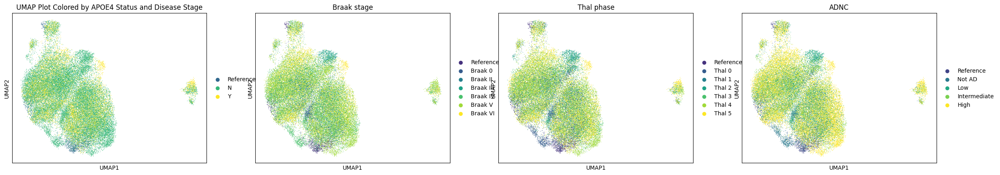

In [ ]:
# Compute PCA and UMAP
sc.tl.pca(adata_mtg_filtered)
sc.pp.neighbors(adata_mtg_filtered)
sc.tl.umap(adata_mtg_filtered)

# Plot UMAP
sc.pl.umap(adata_mtg_filtered, color=['APOE4 status', 'Braak stage', 'Thal phase', 'ADNC'],
           title="UMAP Plot Colored by APOE4 Status and Disease Stage")


**APOE4 Status (First Plot):**

The UMAP plot illustrates the distribution of microglial cells based on APOE4 status (Y for carriers, N for non-carriers, and a reference group).
Clusters: If there are distinct clusters for carriers and non-carriers, this suggests that the microglial cell populations differ significantly in their expression profiles based on APOE4 status.
Distribution: The presence of overlapping areas indicates that there may be shared characteristics among carriers and non-carriers, or potential transitional states in microglial activation.

**Braak Stage (Second Plot):**

This plot shows how microglial cells cluster according to the Braak stage, a measure of the progression of neurofibrillary tangles in AD.
Progression Indicator: Distinct groups for different Braak stages imply that microglial activation varies significantly as the disease progresses, with later stages potentially showing different activation patterns.
Color Gradation: If there is a smooth gradient from early to late Braak stages, it suggests a continuum of activation states in microglia in response to disease progression.

**Thal Phase (Third Plot):**

The Thal phase reflects the extent of amyloid pathology in the brain. Similar to the Braak stage, this plot indicates how microglial cells cluster based on this measure.
Clustering Patterns: The arrangement of microglial cells in relation to Thal phases can provide insight into how amyloid pathology influences microglial behavior.
Overlapping Clusters: The presence of overlapping clusters across Thal phases may indicate that some microglial cells retain similar characteristics despite differing degrees of amyloid burden.

**ADNC (Fourth Plot):**

ADNC categorizes the microglial cells based on their cognitive status, ranging from "Not AD" to various stages of Alzheimer's severity (Low, Intermediate, High).
Cognitive Decline Representation: A clear separation of clusters corresponding to ADNC status suggests that microglial activation is influenced by cognitive decline severity.
Correlation with Other Stages: Comparing this plot with the Braak stage and Thal phase plots may reveal how cognitive impairment relates to microglial activation patterns across different stages of pathology.

**Insights:**
- Microglial Activation Shifts: The results indicate that microglial activation may shift based on both genetic (APOE4 status) and pathological (Braak and Thal stages, ADNC status) factors.

- Potential Targets for Therapy: Understanding how microglial activation varies across these parameters could help identify potential therapeutic targets in Alzheimer's disease treatment, especially for APOE4 carriers who may be at greater risk for neurodegeneration.


# NVIDIA Model Optimization

In [ ]:
!rm -rf ngc-cli
!wget https://ngc.nvidia.com/downloads/ngccli_linux.zip
!unzip ngccli_linux.zip -d ngc-cli
!chmod +x ngc-cli/ngc
!./ngc-cli/ngc --version


--2024-11-25 11:54:53--  https://ngc.nvidia.com/downloads/ngccli_linux.zip
Resolving ngc.nvidia.com (ngc.nvidia.com)... 13.35.238.10, 13.35.238.123, 13.35.238.90, ...
Connecting to ngc.nvidia.com (ngc.nvidia.com)|13.35.238.10|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 47823313 (46M) [application/zip]
Saving to: ‘ngccli_linux.zip.3’

ngccli_linux.zip.3  100%[===================>]  45.61M   159MB/s    in 0.3s    

2024-11-25 11:54:54 (159 MB/s) - ‘ngccli_linux.zip.3’ saved [47823313/47823313]

Archive:  ngccli_linux.zip
   creating: ngc-cli/ngc-cli/
   creating: ngc-cli/ngc-cli/cryptography-42.0.8.dist-info/
  inflating: ngc-cli/ngc-cli/cryptography-42.0.8.dist-info/LICENSE.APACHE  
  inflating: ngc-cli/ngc-cli/cryptography-42.0.8.dist-info/METADATA  
 extracting: ngc-cli/ngc-cli/cryptography-42.0.8.dist-info/INSTALLER  
 extracting: ngc-cli/ngc-cli/cryptography-42.0.8.dist-info/top_level.txt  
  inflating: ngc-cli/ngc-cli/cryptography-42.0.8.dist-info/RECO

In [ ]:
import scanpy as sc
import numpy as np
import pandas as pd
import urllib.request
from scipy import sparse

# Load the MTG dataset
urllib.request.urlretrieve(
    'https://datasets.cellxgene.cziscience.com/32b32549-9c68-453d-91c6-74acad9df928.h5ad',
    'Microglia_PVM_MTG.h5ad'
)
adata_mtg = sc.read_h5ad('Microglia_PVM_MTG.h5ad')
print("MTG Dataset:")
print(adata_mtg)

# View the data
print(adata_mtg)

# Step 1: Extract gene expression data (X) and convert to a sparse matrix
# Gene expression data is stored in `adata_mtg.X`, which may be a sparse matrix
gene_expression_data = adata_mtg.X

# Step 2: Extract gene names and cell metadata (e.g., cell types, disease status)
genes = adata_mtg.var_names

# Correct the column names to use 'Age at death' instead of 'age'
cell_metadata = adata_mtg.obs[['cell_type', 'disease', 'Age at death', 'APOE4 status']]

# Step 3: Convert to FASTQ format for use with Parabricks
# This step assumes we have the sequence data in FASTQ format
# You will need to extract or generate FASTQ files if raw sequences are not available
# Example: Saving gene expression data as FASTQ (assuming gene expression represents sequencing data)

# For simplicity, we'll simulate this process since actual FASTQ conversion requires raw sequence info
def convert_to_fastq(gene_expression, genes, output_file):
    with open(output_file, 'w') as f:
        for i, row in enumerate(gene_expression):
            f.write(f"@Cell_{i}\n")
            # Simulate the sequence with gene names and expression values
            f.write(' '.join(map(str, row.toarray().flatten())) + '\n')  # Convert sparse to dense for simplicity
            f.write('+\n')
            f.write('~' * len(row.toarray().flatten()) + '\n')

# Output file where the simulated FASTQ data will be saved
fastq_file = 'mtg_gene_expression.fastq'
convert_to_fastq(gene_expression_data, genes, fastq_file)

print(f"FASTQ file created: {fastq_file}")


MTG Dataset:
AnnData object with n_obs × n_vars = 40000 × 36412
    obs: 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'is_primary_data', 'Neurotypical reference', 'Class', 'Subclass', 'Supertype', 'Age at death', 'Years of education', 'Cognitive status', 'ADNC', 'Braak stage', 'Thal phase', 'CERAD score', 'APOE4 status', 'Lewy body disease pathology', 'LATE-NC stage', 'Microinfarct pathology', 'Specimen ID', 'donor_id', 'PMI', 'Number of UMIs', 'Genes detected', 'Fraction mitochrondrial UMIs', 'suspension_type', 'development_stage_ontology_term_id', 'Continuous Pseudo-progression Score', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature

In [ ]:
import urllib
import scanpy as sc

# Download and load MTG dataset
urllib.request.urlretrieve(
    'https://datasets.cellxgene.cziscience.com/32b32549-9c68-453d-91c6-74acad9df928.h5ad',
    'Microglia_PVM_MTG.h5ad'
)
adata_mtg = sc.read_h5ad('Microglia_PVM_MTG.h5ad')
print("MTG Dataset:")
print(adata_mtg)

# Download and load DLPFC dataset
urllib.request.urlretrieve(
    'https://datasets.cellxgene.cziscience.com/6ea7ef32-8a23-40d2-8870-811df2fb2d53.h5ad',
    'Microglia_PVM_DLPFC.h5ad'
)
adata_dlpfc = sc.read_h5ad('Microglia_PVM_DLPFC.h5ad')
print("DLPFC Dataset:")
print(adata_dlpfc)

# If needed, you can export the gene expression data as a matrix
# This step might be needed if you're integrating Parabricks tools that require matrices
mtg_data = adata_mtg.X.toarray()  # Assuming it's sparse and converting to dense matrix
dlpfc_data = adata_dlpfc.X.toarray()


MTG Dataset:
AnnData object with n_obs × n_vars = 40000 × 36412
    obs: 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'is_primary_data', 'Neurotypical reference', 'Class', 'Subclass', 'Supertype', 'Age at death', 'Years of education', 'Cognitive status', 'ADNC', 'Braak stage', 'Thal phase', 'CERAD score', 'APOE4 status', 'Lewy body disease pathology', 'LATE-NC stage', 'Microinfarct pathology', 'Specimen ID', 'donor_id', 'PMI', 'Number of UMIs', 'Genes detected', 'Fraction mitochrondrial UMIs', 'suspension_type', 'development_stage_ontology_term_id', 'Continuous Pseudo-progression Score', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature

In [ ]:
!curl -fsSL https://nvidia.github.io/libnvidia-container/gpgkey | sudo gpg --dearmor -o /usr/share/keyrings/nvidia-container-toolkit-keyring.gpg \
  && curl -s -L https://nvidia.github.io/libnvidia-container/stable/deb/nvidia-container-toolkit.list | \
    sed 's#deb https://#deb [signed-by=/usr/share/keyrings/nvidia-container-toolkit-keyring.gpg] https://#g' | \
    sudo tee /etc/apt/sources.list.d/nvidia-container-toolkit.list

deb [signed-by=/usr/share/keyrings/nvidia-container-toolkit-keyring.gpg] https://nvidia.github.io/libnvidia-container/stable/deb/$(ARCH) /
#deb [signed-by=/usr/share/keyrings/nvidia-container-toolkit-keyring.gpg] https://nvidia.github.io/libnvidia-container/experimental/deb/$(ARCH) /


In [ ]:
sudo sed -i -e '/experimental/ s/^#//g' /etc/apt/sources.list.d/nvidia-container-toolkit.list


SyntaxError: invalid syntax (<ipython-input-31-122ffe22a824>, line 1)

In [ ]:
docker pull nvcr.io/nvidia/clara/clara-parabricks:4.4.0-1


SyntaxError: invalid syntax (<ipython-input-23-714e313833f2>, line 1)

In [ ]:
data = pd.read_csv(file_path, low_memory=False)  # To handle mixed types efficiently


In [ ]:
# Separate numeric and non-numeric columns
numeric_cols = data.select_dtypes(include=[np.number]).columns
non_numeric_cols = data.select_dtypes(exclude=[np.number]).columns

# Impute missing values for numeric columns
data[numeric_cols] = data[numeric_cols].fillna(data[numeric_cols].median())

# For non-numeric columns, fill with a placeholder or mode
data[non_numeric_cols] = data[non_numeric_cols].fillna('Unknown')  # Replace 'Unknown' with suitable placeholder


In [ ]:
# Display column names to identify relevant ones
print(data.columns)


Index(['Phase', 'Unnamed: 1', 'Unnamed: 2', 'ADNIGO', 'ADNI2', 'ADNI2.1',
       'ADNIGO.1', 'ADNI2.2', 'ADNI2.3', 'ADNI2.4',
       ...
       'ADNIGO.292', 'ADNI2.443', 'ADNIGO.293', 'ADNI2.444', 'ADNIGO.294',
       'ADNI2.445', 'ADNI2.446', 'ADNI2.447', 'ADNI2.448', 'Unnamed: 747'],
      dtype='object', length=748)


# NVIDIA Parabricks


In [ ]:
!nvidia-smi


Mon Nov 25 11:03:59 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P8              11W /  70W |      3MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
!apt-get update
!apt-get install -y cuda

Hit:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Get:3 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Hit:6 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:7 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Hit:9 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Get:10 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Fetched 384 kB in 2s (200 kB/s)
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading pac

In [ ]:
!apt-get install -y docker.io

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
docker.io is already the newest version (24.0.7-0ubuntu2~22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.


In [ ]:
!wget https://ngc.nvidia.com/downloads/ngccli_linux.zip
!unzip ngccli_linux.zip
!chmod +x ngc-cli/ngc

--2024-11-25 11:04:07--  https://ngc.nvidia.com/downloads/ngccli_linux.zip
Resolving ngc.nvidia.com (ngc.nvidia.com)... 13.35.238.123, 13.35.238.16, 13.35.238.10, ...
Connecting to ngc.nvidia.com (ngc.nvidia.com)|13.35.238.123|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 47823313 (46M) [application/zip]
Saving to: ‘ngccli_linux.zip.1’

ngccli_linux.zip.1  100%[===================>]  45.61M   251MB/s    in 0.2s    

2024-11-25 11:04:07 (251 MB/s) - ‘ngccli_linux.zip.1’ saved [47823313/47823313]

Archive:  ngccli_linux.zip
replace ngc-cli/cryptography-42.0.8.dist-info/LICENSE.APACHE? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: ngc-cli/cryptography-42.0.8.dist-info/LICENSE.APACHE  
replace ngc-cli/cryptography-42.0.8.dist-info/METADATA? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: ngc-cli/cryptography-42.0.8.dist-info/METADATA  
replace ngc-cli/cryptography-42.0.8.dist-info/INSTALLER? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
 extracting: ngc-cl

In [ ]:
!unzip -o ngccli_linux.zip

Archive:  ngccli_linux.zip
  inflating: ngc-cli/cryptography-42.0.8.dist-info/LICENSE.APACHE  
  inflating: ngc-cli/cryptography-42.0.8.dist-info/METADATA  
 extracting: ngc-cli/cryptography-42.0.8.dist-info/INSTALLER  
 extracting: ngc-cli/cryptography-42.0.8.dist-info/top_level.txt  
  inflating: ngc-cli/cryptography-42.0.8.dist-info/RECORD  
  inflating: ngc-cli/cryptography-42.0.8.dist-info/WHEEL  
  inflating: ngc-cli/cryptography-42.0.8.dist-info/LICENSE.BSD  
  inflating: ngc-cli/cryptography-42.0.8.dist-info/LICENSE  
  inflating: ngc-cli/wrapt-1.16.0.dist-info/METADATA  
 extracting: ngc-cli/wrapt-1.16.0.dist-info/INSTALLER  
 extracting: ngc-cli/wrapt-1.16.0.dist-info/top_level.txt  
  inflating: ngc-cli/wrapt-1.16.0.dist-info/RECORD  
  inflating: ngc-cli/wrapt-1.16.0.dist-info/WHEEL  
  inflating: ngc-cli/wrapt-1.16.0.dist-info/LICENSE  
  inflating: ngc-cli/opentelemetry_proto-1.24.0.dist-info/METADATA  
 extracting: ngc-cli/opentelemetry_proto-1.24.0.dist-info/INSTALLER  

In [ ]:
!rm -rf ngc-cli  # Deletes the existing folder
!unzip ngccli_linux.zip


Archive:  ngccli_linux.zip
   creating: ngc-cli/
   creating: ngc-cli/cryptography-42.0.8.dist-info/
  inflating: ngc-cli/cryptography-42.0.8.dist-info/LICENSE.APACHE  
  inflating: ngc-cli/cryptography-42.0.8.dist-info/METADATA  
 extracting: ngc-cli/cryptography-42.0.8.dist-info/INSTALLER  
 extracting: ngc-cli/cryptography-42.0.8.dist-info/top_level.txt  
  inflating: ngc-cli/cryptography-42.0.8.dist-info/RECORD  
  inflating: ngc-cli/cryptography-42.0.8.dist-info/WHEEL  
  inflating: ngc-cli/cryptography-42.0.8.dist-info/LICENSE.BSD  
  inflating: ngc-cli/cryptography-42.0.8.dist-info/LICENSE  
   creating: ngc-cli/wrapt-1.16.0.dist-info/
  inflating: ngc-cli/wrapt-1.16.0.dist-info/METADATA  
 extracting: ngc-cli/wrapt-1.16.0.dist-info/INSTALLER  
 extracting: ngc-cli/wrapt-1.16.0.dist-info/top_level.txt  
  inflating: ngc-cli/wrapt-1.16.0.dist-info/RECORD  
  inflating: ngc-cli/wrapt-1.16.0.dist-info/WHEEL  
  inflating: ngc-cli/wrapt-1.16.0.dist-info/LICENSE  
   creating: ngc-cl

In [ ]:
!chmod +x ngc-cli/ngc

In [ ]:
!ngc-cli/ngc --version


/bin/bash: line 1: ngc-cli/ngc: No such file or directory


In [ ]:
!ngc-cli/ngc config set
n-

Enter API key [no-apikey]. Choices: [<VALID_APIKEY>, 'no-apikey']: no-apikey
Enter CLI output format type [ascii]. Choices: ['ascii', 'csv', 'json']: ascii
Validating configuration...
Successfully validated configuration.
Saving configuration...
Successfully saved NGC configuration to /root/.ngc/config


In [ ]:
!ngc-cli/ngc config list

usage: ngc config [--debug] [--format_type <fmt>] [-h] {clear,clear-cache,current,set} ...
ngc config: error: argument {clear,clear-cache,current,set}: invalid choice: 'list' (choose from 'clear', 'clear-cache', 'current', 'set')


In [ ]:
!cat /proc/meminfo | grep MemTotal
!cat /proc/cpuinfo | grep processor | wc -l
!apt-get update
!apt-get install -y docker.io


MemTotal:       53470708 kB
8
Get:1 https://nvidia.github.io/libnvidia-container/stable/deb/amd64  InRelease [1,477 B]
Get:2 https://nvidia.github.io/libnvidia-container/experimental/deb/amd64  InRelease [1,489 B]
Hit:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:4 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Get:5 https://nvidia.github.io/libnvidia-container/stable/deb/amd64  Packages [14.8 kB]
Get:6 https://nvidia.github.io/libnvidia-container/experimental/deb/amd64  Packages [9,632 B]
Get:7 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:8 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:9 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Hit:10 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:11 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:12 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Hit:

In [ ]:
!dockerd -H unix:///var/run/docker.sock &
!docker info

INFO[2024-11-25T11:13:40.404436314Z] Starting up                                  
INFO[2024-11-25T11:13:40.405053002Z] containerd not running, starting managed containerd 
INFO[2024-11-25T11:13:40.405807389Z] started new containerd process                address=/var/run/docker/containerd/containerd.sock module=libcontainerd pid=31583
INFO[2024-11-25T11:13:40.427834165Z] starting containerd                           revision= version=1.7.12
INFO[2024-11-25T11:13:40.445752180Z] loading plugin "io.containerd.snapshotter.v1.aufs"...  type=io.containerd.snapshotter.v1
INFO[2024-11-25T11:13:40.447991911Z] skip loading plugin "io.containerd.snapshotter.v1.aufs"...  error="aufs is not supported (modprobe aufs failed: exit status 1 \"modprobe: FATAL: Module aufs not found in directory /lib/modules/6.1.85+\\n\"): skip plugin" type=io.containerd.snapshotter.v1
INFO[2024-11-25T11:13:40.448021057Z] loading plugin "io.containerd.event.v1.exchange"...  type=io.containerd.event.v1
INFO[2024-11-25T11

In [ ]:
!dockerd -H unix:///var/run/docker.sock &

INFO[2024-11-25T11:13:45.266822744Z] Starting up                                  
INFO[2024-11-25T11:13:45.267370911Z] containerd not running, starting managed containerd 
INFO[2024-11-25T11:13:45.268145683Z] started new containerd process                address=/var/run/docker/containerd/containerd.sock module=libcontainerd pid=31654
INFO[2024-11-25T11:13:45.289378661Z] starting containerd                           revision= version=1.7.12
INFO[2024-11-25T11:13:45.307825577Z] loading plugin "io.containerd.snapshotter.v1.aufs"...  type=io.containerd.snapshotter.v1
INFO[2024-11-25T11:13:45.309644962Z] skip loading plugin "io.containerd.snapshotter.v1.aufs"...  error="aufs is not supported (modprobe aufs failed: exit status 1 \"modprobe: FATAL: Module aufs not found in directory /lib/modules/6.1.85+\\n\"): skip plugin" type=io.containerd.snapshotter.v1
INFO[2024-11-25T11:13:45.309671562Z] loading plugin "io.containerd.event.v1.exchange"...  type=io.containerd.event.v1
INFO[2024-11-25T11

In [ ]:
!docker info

Client:
 Version:    24.0.7
 Context:    default
 Debug Mode: false

Server:
ERROR: Cannot connect to the Docker daemon at unix:///var/run/docker.sock. Is the docker daemon running?
errors pretty printing info


#AlphaFold2

In [ ]:
# 更新并安装必要工具
!sudo apt-get update
!sudo apt-get install -y hmmer kalign

# 安装 biopython 和其他必要的 Python 库
!pip install biopython numpy pandas matplotlib

In [ ]:
!git clone https://github.com/deepmind/alphafold.git

In [ ]:
DATABASE_DIR = "/path/to/databases"